In [3]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import (
ensemble,
preprocessing,
tree,
)
from sklearn.metrics import (
auc,
confusion_matrix,
roc_auc_score, # type: ignore
roc_curve,
)
from sklearn.model_selection import (
train_test_split,
StratifiedKFold,
)
from yellowbrick.classifier import (
ConfusionMatrix,
ROCAUC,
)
from yellowbrick.model_selection import (
LearningCurve,
)

## Lecture du fichier

In [4]:
file_path = r"C:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\titanic_dataset.csv"
df = pd.read_csv(file_path)
orig_df = df.copy()
print(df.head())


   PassengerId  Survived  Pclass  \
0            1         0       3   
1            2         1       1   
2            3         1       3   
3            4         1       1   
4            5         0       3   

                                                Name     Sex   Age  SibSp  \
0                            Braund, Mr. Owen Harris    male  22.0      1   
1  Cumings, Mrs. John Bradley (Florence Briggs Th...  female  38.0      1   
2                             Heikkinen, Miss. Laina  female  26.0      0   
3       Futrelle, Mrs. Jacques Heath (Lily May Peel)  female  35.0      1   
4                           Allen, Mr. William Henry    male  35.0      0   

   Parch            Ticket     Fare Cabin Embarked  
0      0         A/5 21171   7.2500   NaN        S  
1      0          PC 17599  71.2833   C85        C  
2      0  STON/O2. 3101282   7.9250   NaN        S  
3      0            113803  53.1000  C123        S  
4      0            373450   8.0500   NaN        S  


## Analyse des types des features

In [5]:
df.dtypes

PassengerId      int64
Survived         int64
Pclass           int64
Name            object
Sex             object
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked        object
dtype: object

## ydata_profiling pour analyse statistique de chaque feature

In [6]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Titanic Profiling Report")
profile.to_notebook_iframe() #Exploration in VS Code

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 12/12 [00:00<00:00, 47.46it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## One hot encoding : Colonnes textuelles en numérique

In [7]:
## suppression colonnes divulgâcheuses
cols_to_drop = ["Name", "Ticket", "Cabin", "PassengerId"]
df = df.drop(columns=cols_to_drop, errors='ignore')

df = pd.get_dummies(df, drop_first=True, dtype=int)
# drop_first=True supprime la première colonne créée (ex: sex_female) car elle est redondante (si sex_male = 0, alors c'est une femme).
# dtype=int force l'affichage en 0 et 1 (au lieu de True/False)
y = df["Survived"]
X = df.drop(columns="Survived")

print("Colonnes restantes dans X :")
print(X.columns.tolist())
print("\nAperçu des données X :")
print(X.head())


Colonnes restantes dans X :
['Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'Sex_male', 'Embarked_Q', 'Embarked_S']

Aperçu des données X :
   Pclass   Age  SibSp  Parch     Fare  Sex_male  Embarked_Q  Embarked_S
0       3  22.0      1      0   7.2500         1           0           1
1       1  38.0      1      0  71.2833         0           0           0
2       3  26.0      0      0   7.9250         0           0           1
3       1  35.0      1      0  53.1000         0           0           1
4       3  35.0      0      0   8.0500         1           0           1


## Test train split

In [8]:
from sklearn.model_selection import train_test_split
y = df["Survived"]
X = df.drop(columns=["Survived"])
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42
)
print(f"Taille de l'entraînement (70%) : {X_train.shape}")
print(f"Taille du test (30%) : {X_test.shape}")

Taille de l'entraînement (70%) : (712, 8)
Taille du test (30%) : (179, 8)


## Imputation des données sur valeurs manquantes

In [9]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import train_test_split

# Sélection des colonnes numériques pour imputation
num_cols = [
    "Pclass",
    "Age",
    "SibSp",
    "Parch",
    "Fare",
    "Sex_male"
]

imputer = IterativeImputer(random_state=42)
print("Imputation en cours...")

# --- 3. Apprentissage et Remplacement sur le TRAIN ---
# .fit_transform() : Il apprend les corrélations ET remplace les trous
imputed_train = imputer.fit_transform(X_train[num_cols])
X_train.loc[:, num_cols] = imputed_train

# --- 4. Remplacement sur le TEST ---
# .transform() seulement : On n'apprend RIEN du test, on applique juste les règles du train
imputed_test = imputer.transform(X_test[num_cols])
X_test.loc[:, num_cols] = imputed_test

# --- 5. Vérification ---
print("Valeurs manquantes restantes dans Age (Train) :", X_train["Age"].isnull().sum())
print("Valeurs manquantes restantes dans Age (Test) :", X_test["Age"].isnull().sum())

Imputation en cours...
Valeurs manquantes restantes dans Age (Train) : 0
Valeurs manquantes restantes dans Age (Test) : 0


## Normalisation des données (moyenne 0 écart type 1)

In [10]:
from sklearn import preprocessing
cols_to_scale = ["Pclass", "Age", "SibSp", "Parch", "Fare"]
scaler = preprocessing.StandardScaler()

# 3. Entraînement et Transformation sur le TRAIN
# On utilise .loc pour ne modifier QUE les colonnes sélectionnées
# Le scaler renvoie un tableau numpy, on le remet directement dans le DataFrame
X_train.loc[:, cols_to_scale] = scaler.fit_transform(X_train[cols_to_scale])

# 4. Transformation sur le TEST
# IMPORTANT : On utilise seulement .transform() ici (pas de fit !)
# On utilise les moyennes/écarts-types calculés sur le train.
X_test.loc[:, cols_to_scale] = scaler.transform(X_test[cols_to_scale])

# --- Vérification ---
# La moyenne doit être proche de 0 et l'écart-type (std) proche de 1
print("Moyennes après standardisation (doit être proche de 0) :")
print(X_train[cols_to_scale].mean())

print("\nÉcart-types après standardisation (doit être proche de 1) :")
print(X_train[cols_to_scale].std())

Moyennes après standardisation (doit être proche de 0) :
Pclass    9.355812e-17
Age      -7.484650e-18
SibSp     1.746418e-17
Parch     2.245395e-17
Fare      5.363999e-17
dtype: float64

Écart-types après standardisation (doit être proche de 1) :
Pclass    1.000703
Age       1.000703
SibSp     1.000703
Parch     1.000703
Fare      1.000703
dtype: float64


C:\Users\TBAUU1N9\AppData\Local\Temp\ipykernel_6916\351365673.py:8: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[-1.61413602 -0.40055118  0.81303367  0.81303367  0.81303367 -1.61413602
 -1.61413602 -0.40055118  0.81303367 -1.61413602 -0.40055118  0.81303367
 -0.40055118  0.81303367  0.81303367 -0.40055118 -1.61413602 -1.61413602
 -0.40055118 -1.61413602  0.81303367  0.81303367  0.81303367 -0.40055118
  0.81303367  0.81303367  0.81303367  0.81303367 -1.61413602  0.81303367
  0.81303367 -1.61413602  0.81303367 -1.61413602  0.81303367  0.81303367
  0.81303367 -0.40055118 -1.61413602 -0.40055118  0.81303367  0.81303367
 -0.40055118  0.81303367 -1.61413602  0.81303367 -0.40055118  0.81303367
 -1.61413602 -0.40055118  0.81303367 -0.40055118 -1.61413602  0.81303367
  0.81303367  0.81303367  0.81303367 -1.61413602  0.81303367 -1.61413602
 -0.40055118  0.81303367 -0.40055118  0.81303367  0.81303367  0.81303367
  0.8130336

## Refactor pour mise en production

In [11]:
import pandas as pd
from sklearn import model_selection, impute, preprocessing
from sklearn.experimental import enable_iterative_imputer  # Toujours nécessaire

def tweak_titanic(df):
    """
    Nettoie le dataset : supprime les colonnes inutiles et encode les catégories.
    """
    # Liste adaptée à ton fichier Kaggle + sécurité avec errors='ignore'
    cols_to_drop = [
        "Name", "Ticket", "Cabin", "PassengerId",
        "Home.dest", "Boat", "Body"  # Ceux-ci seront ignorés s'ils n'existent pas
    ]
    
    return df.drop(
        columns=cols_to_drop, errors='ignore'
    ).pipe(pd.get_dummies, drop_first=True, dtype=int)

def get_train_test_X_y(df, y_col, size=0.3, std_cols=None):
    """
    Divise en Train/Test, impute les valeurs manquantes et normalise.
    """
    y = df[y_col]
    X = df.drop(columns=y_col)
    
    # 1. Split
    X_train, X_test, y_train, y_test = model_selection.train_test_split(
        X, y, test_size=size, random_state=42
    )
    
    # 2. Imputation (Définition des colonnes numériques avec Majuscules)
    num_cols = ["Pclass", "Age", "SibSp", "Parch", "Fare"]
    
    fi = impute.IterativeImputer(random_state=42)
    
    # On applique l'imputation sur le TRAIN puis le TEST
    X_train.loc[:, num_cols] = fi.fit_transform(X_train[num_cols])
    X_test.loc[:, num_cols] = fi.transform(X_test[num_cols])
    
    # 3. Standardisation (si demandée)
    if std_cols:
        std = preprocessing.StandardScaler()
        X_train.loc[:, std_cols] = std.fit_transform(X_train[std_cols])
        X_test.loc[:, std_cols] = std.transform(X_test[std_cols])
        
    return X_train, X_test, y_train, y_test

# --- Utilisation des fonctions ---

# 1. Chargement et nettoyage initial
# (Assure-toi que orig_df est bien chargé depuis ton CSV avant)
ti_df = tweak_titanic(orig_df)

# 2. Définition des colonnes à normaliser (Attention aux majuscules !)
std_cols = ["Pclass", "Age", "SibSp", "Fare"]

# 3. Génération finale des sets
X_train, X_test, y_train, y_test = get_train_test_X_y(
    ti_df, 
    y_col="Survived",  # Majuscule importante ici aussi
    std_cols=std_cols
)

print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print("Aperçu X_train :")
print(X_train.head())

X_train shape: (623, 8)
X_test shape: (268, 8)
Aperçu X_train :
       Pclass       Age     SibSp  Parch      Fare  Sex_male  Embarked_Q  \
445 -1.637881 -1.804353 -0.474161      2  0.980998         1           0   
650  0.803267 -0.081525 -0.474161      0 -0.469634         1           0   
172  0.803267 -2.022872  0.348687      1 -0.406136         0           0   
450 -0.417307  0.526519  0.348687      2 -0.080232         1           0   
314 -0.417307  1.036397  0.348687      1 -0.109651         1           0   

     Embarked_S  
445           1  
650           1  
172           1  
450           1  
314           1  


C:\Users\TBAUU1N9\AppData\Local\Temp\ipykernel_6916\3958557850.py:43: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[-1.63788124  0.80326712  0.80326712 -0.41730706 -0.41730706 -1.63788124
 -0.41730706  0.80326712  0.80326712 -0.41730706 -1.63788124 -0.41730706
  0.80326712  0.80326712 -1.63788124  0.80326712 -0.41730706  0.80326712
  0.80326712  0.80326712 -0.41730706  0.80326712  0.80326712  0.80326712
  0.80326712  0.80326712  0.80326712 -1.63788124  0.80326712 -0.41730706
  0.80326712  0.80326712  0.80326712 -1.63788124 -0.41730706 -0.41730706
  0.80326712 -1.63788124  0.80326712  0.80326712 -1.63788124 -0.41730706
 -1.63788124 -0.41730706 -0.41730706  0.80326712  0.80326712 -0.41730706
  0.80326712 -0.41730706 -0.41730706  0.80326712 -1.63788124  0.80326712
 -1.63788124  0.80326712 -0.41730706  0.80326712  0.80326712  0.80326712
  0.80326712  0.80326712  0.80326712  0.80326712  0.80326712 -0.41730706
 -0.41730

## Dummy classifier

In [12]:
from sklearn.dummy import DummyClassifier
from sklearn import metrics

# 1. Création du modèle "bête" (Dummy)
# strategy='most_frequent' : Il va regarder qui gagne dans le train (les morts '0') 
# et prédire '0' pour absolument tout le monde.
bm = DummyClassifier(strategy='most_frequent')

# 2. Entraînement (il apprend juste que '0' est majoritaire)
bm.fit(X_train, y_train)

# 3. Évaluation de l'Accuracy (Taux de réussite global)
accuracy = bm.score(X_test, y_test)
print(f"Accuracy (Exactitude) du modèle naïf : {accuracy:.2%}")

# 4. Évaluation de la Précision
# Attention : Si le modèle prédit "0" pour tout le monde, il ne trouve aucun "Survivant" (1).
# La précision sera donc de 0.0 (ou une erreur de division par zéro qu'on gère ici).
y_pred_dummy = bm.predict(X_test)
precision = metrics.precision_score(y_test, y_pred_dummy, zero_division=0)

print(f"Précision du modèle naïf : {precision:.2%}")

Accuracy (Exactitude) du modèle naïf : 58.58%
Précision du modèle naïf : 0.00%


## Cross validation k pli et banc d'essai

In [13]:
import pandas as pd
from sklearn import model_selection
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import xgboost

# 1. Reconstitution du dataset complet
# (Nécessaire car la Cross-Validation fait son propre découpage interne)
X_all = pd.concat([X_train, X_test])
y_all = pd.concat([y_train, y_test])

# 2. Liste des modèles à tester
models = [
    DummyClassifier,
    LogisticRegression,
    DecisionTreeClassifier,
    KNeighborsClassifier,
    GaussianNB,
    SVC,
    RandomForestClassifier,
    xgboost.XGBClassifier,
]

print(f"{'Modèle':<25} {'AUC':<10} {'STD'}")
print("-" * 45)

# 3. Boucle de Benchmark
for model_class in models:
    # Instanciation du modèle
    # Cas particulier pour XGBoost (éviter les warnings) et LogisticRegression (augmente max_iter)
    if model_class == xgboost.XGBClassifier:
        cls = model_class(eval_metric='logloss', use_label_encoder=False)
    elif model_class == LogisticRegression:
        cls = model_class(max_iter=2000)
    elif model_class == DummyClassifier:
        cls = model_class(strategy='most_frequent')
    else:
        cls = model_class()

    # Configuration de la Cross-Validation
    # IMPORTANT : shuffle=True est obligatoire si on met un random_state
    kfold = model_selection.KFold(
        n_splits=10, 
        shuffle=True, 
        random_state=42
    )

    # Calcul des scores
    s = model_selection.cross_val_score(
        cls, X_all, y_all, scoring="roc_auc", cv=kfold
    )
    
    # Affichage propre
    print(
        f"{model_class.__name__:25} "
        f"{s.mean():.3f}      "
        f"{s.std():.2f}"
    )

Modèle                    AUC        STD
---------------------------------------------
DummyClassifier           0.500      0.00
LogisticRegression        0.849      0.06
DecisionTreeClassifier    0.770      0.05
KNeighborsClassifier      0.843      0.07
GaussianNB                0.826      0.07
SVC                       0.852      0.06
RandomForestClassifier    0.863      0.06


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\xgboost\training.py:199: UserWarning: [15:07:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\xgboost\training.py:199: UserWarning: [15:07:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\xgboost\training.py:199: UserWarning: [15:07:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\xgboost\training.py:199: UserWarning: [15:07:21] WARNING: C:\actio

XGBClassifier             0.863      0.07


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\xgboost\training.py:199: UserWarning: [15:07:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\xgboost\training.py:199: UserWarning: [15:07:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


## Random Forest

In [14]:
from sklearn import ensemble, metrics

# 1. Création et Entraînement du modèle de base
rf = ensemble.RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# 2. Évaluation simple
accuracy = rf.score(X_test, y_test)
y_pred = rf.predict(X_test)
precision = metrics.precision_score(y_test, y_pred)

print(f"Accuracy (Exactitude) : {accuracy:.2%}")
print(f"Précision : {precision:.2%}")

# 3. Quelles sont les variables les plus importantes ?
# (C'est l'avantage des forêts : on peut voir ce qui compte le plus)
print("\nImportance des caractéristiques :")
for col, val in sorted(
    zip(X_train.columns, rf.feature_importances_),
    key=lambda x: x[1],
    reverse=True,
)[:5]:
    print(f"{col:10} : {val:.3f}")

Accuracy (Exactitude) : 76.87%
Précision : 72.90%

Importance des caractéristiques :
Age        : 0.275
Fare       : 0.261
Sex_male   : 0.252
Pclass     : 0.082
SibSp      : 0.053


## Grid search optimisation hyperparamètres

In [15]:
from sklearn import ensemble, model_selection
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from yellowbrick.model_selection import LearningCurve
import matplotlib.pyplot as plt
import pandas as pd

# --- Partie 2 : Optimisation (GridSearch) SANS parallélisme ---

params = {
    "max_features": [0.4, "sqrt"],
    "n_estimators": [100, 200],
    "min_samples_leaf": [1, 2],
    "random_state": [42],
}

print("Optimisation en cours (GridSearch) - Mode séquentiel...")

# On retire n_jobs=-1 (par défaut n_jobs=None, donc 1 seul processeur)
cv = GridSearchCV(
    ensemble.RandomForestClassifier(),
    params,
    cv=5
)

cv.fit(X_train, y_train)
best_rf = cv.best_estimator_

print("Meilleurs paramètres trouvés :", cv.best_params_)
print(f"Score du meilleur modèle sur le Test : {best_rf.score(X_test, y_test):.2%}")


# --- Partie 3 : Visualisation (Learning Curve) ---

# Reconstitution pour la courbe d'apprentissage
X_all = pd.concat([X_train, X_test])
y_all = pd.concat([y_train, y_test])

print("\nGénération de la courbe d'apprentissage...")

plt.figure(figsize=(8, 5))
cv_strategy = StratifiedKFold(n_splits=10)

# Ici aussi, on retire n_jobs=-1 pour éviter le crash
lc_viz = LearningCurve(
    best_rf,
    cv=cv_strategy,
    scoring='accuracy'
    # n_jobs retiré (=1)
)

lc_viz.fit(X_all, y_all)
lc_viz.show()

Optimisation en cours (GridSearch) - Mode séquentiel...
Meilleurs paramètres trouvés : {'max_features': 0.4, 'min_samples_leaf': 2, 'n_estimators': 100, 'random_state': 42}
Score du meilleur modèle sur le Test : 79.85%

Génération de la courbe d'apprentissage...


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\yellowbrick\base.py:246: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


<Axes: title={'center': 'Learning Curve for RandomForestClassifier'}, xlabel='Training Instances', ylabel='Score'>

## Visualisation Random forest

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\yellowbrick\classifier\base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


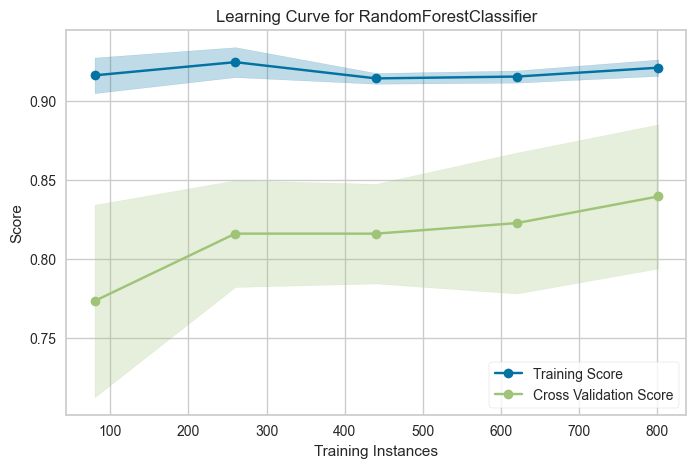

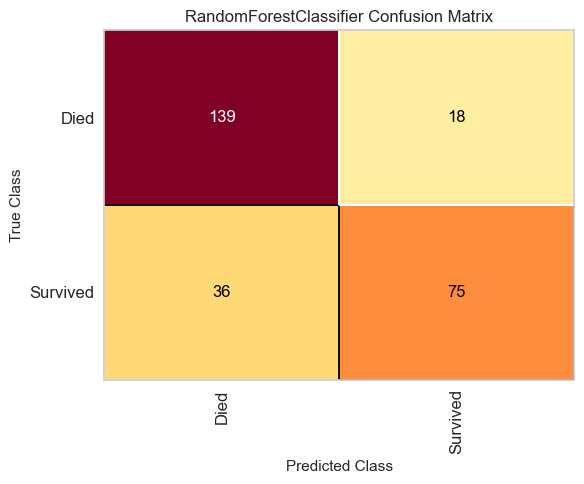

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


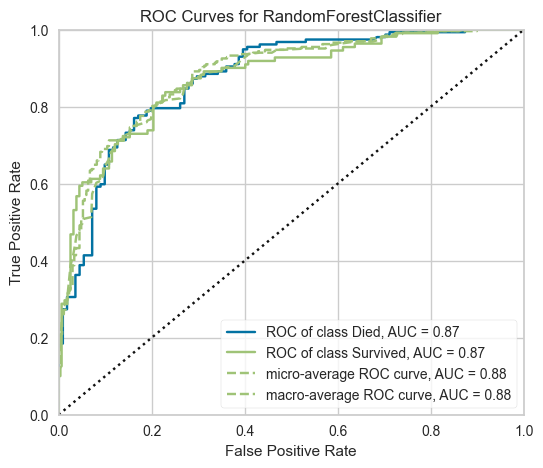

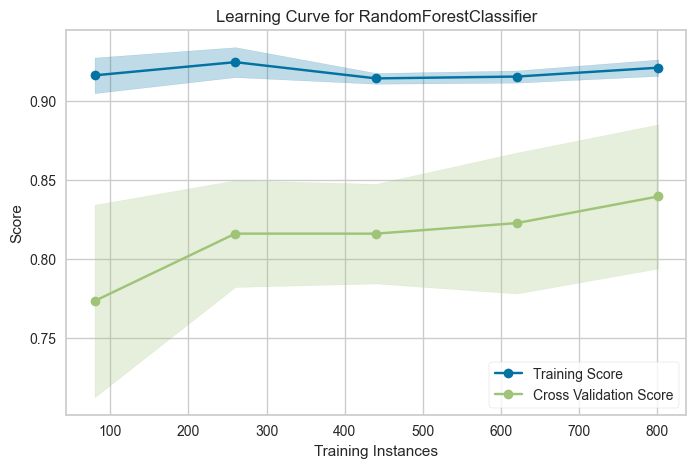

<Axes: title={'center': 'Learning Curve for RandomForestClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [16]:
%matplotlib inline

import matplotlib.pyplot as plt
from yellowbrick.classifier import ConfusionMatrix, ROCAUC
from yellowbrick.model_selection import LearningCurve
from sklearn.model_selection import StratifiedKFold
import pandas as pd

# --- A. Matrice de Confusion ---
# Permet de voir les Faux Positifs vs Faux Négatifs
plt.figure(figsize=(6, 5))
mapping = {0: "Died", 1: "Survived"}

cm_viz = ConfusionMatrix(
    best_rf, 
    classes=["Died", "Survived"], 
    label_encoder=mapping
)

# Note : Yellowbrick gère le fit/score souvent en interne, mais voici la méthode standard
cm_viz.score(X_test, y_test)
cm_viz.show()

# --- B. Courbe ROC (AUC) ---
# Évalue la performance globale (0.5 = hasard, 1.0 = parfait)

plt.figure(figsize=(6, 5))
roc_viz = ROCAUC(best_rf, classes=["Died", "Survived"])

# La courbe ROC a besoin d'être 'fittée' sur le train avant de scorer le test
roc_viz.fit(X_train, y_train)
roc_viz.score(X_test, y_test)
roc_viz.show()

# --- C. Courbe d'apprentissage (Learning Curve) ---
# Vérifie si on a assez de données ou s'il faut en collecter plus.

# On reconstitue X et y complets pour ce graphique
X_all = pd.concat([X_train, X_test])
y_all = pd.concat([y_train, y_test])

plt.figure(figsize=(8, 5))
cv_strategy = StratifiedKFold(n_splits=10)

lc_viz = LearningCurve(
    best_rf,
    cv=cv_strategy,
    scoring='accuracy',
    n_jobs=1  # IMPORTANT : Mis à 1 pour éviter le crash sous Windows
)

lc_viz.fit(X_all, y_all)
lc_viz.show()

## Déploiement du modèle pickle

In [17]:
import pickle
from sklearn.metrics import roc_auc_score

# --- 1. SAUVEGARDE (Mise en "Tupperware") ---
# On ouvre un fichier en mode 'wb' (Write Binary)
filename = 'mon_modele_titanic.pkl'
print(f"Sauvegarde du modèle dans {filename}...")

with open(filename, 'wb') as file:
    pickle.dump(best_rf, file)

print("Modèle sauvegardé avec succès !")

# --- 2. SIMULATION DE DÉPLOIEMENT (Le lendemain...) ---
# Imagine que c'est un nouveau script. On n'a plus 'best_rf' en mémoire.
# On supprime le modèle original pour prouver que le chargement fonctionne
del best_rf 

print("\nChargement du modèle depuis le disque...")

# On ouvre le fichier en mode 'rb' (Read Binary)
with open(filename, 'rb') as file:
    loaded_model = pickle.load(file)

# --- 3. VÉRIFICATION ---
# On utilise ce modèle "ressuscité" pour faire une prédiction
print("Test du modèle chargé :")

# On refait une prédiction sur le jeu de test
y_pred_new = loaded_model.predict(X_test)
score = roc_auc_score(y_test, y_pred_new)

print(f"Score AUC du modèle rechargé : {score:.5f}")

# Petit test unitaire pour être sûr à 100%
print(f"\nLe modèle est-il prêt ? {'OUI' if score > 0.75 else 'NON'}")

Sauvegarde du modèle dans mon_modele_titanic.pkl...
Modèle sauvegardé avec succès !

Chargement du modèle depuis le disque...
Test du modèle chargé :
Score AUC du modèle rechargé : 0.78051

Le modèle est-il prêt ? OUI


## Pourcentage de données manquantes

Pourcentage de données manquantes par colonne :
Cabin       77.104377
Age         19.865320
Embarked     0.224467
dtype: float64


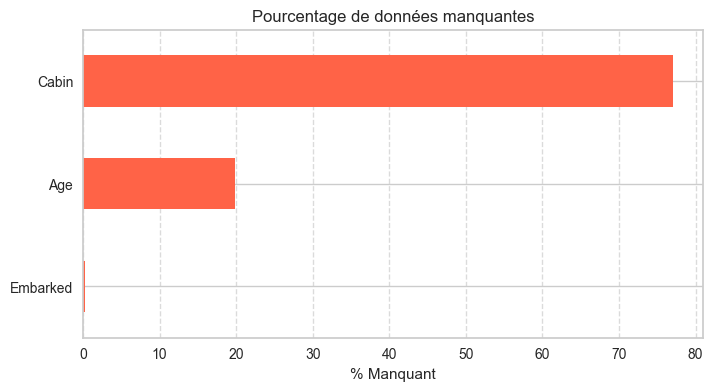

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Chargement du fichier
file_path = r"C:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\titanic_dataset.csv"
df = pd.read_csv(file_path)

# 2. Calcul du pourcentage de manquants
# df.isnull() crée un tableau de Vrai/Faux (Vrai si la case est vide)
# En Python, Vrai = 1 et Faux = 0.
# En faisant la moyenne (.mean()), on obtient donc le % de 1 (donc de vides).
missing_data = df.isnull().mean() * 100

# 3. Affichage propre (on filtre pour ne voir que ce qui manque)
print("Pourcentage de données manquantes par colonne :")
print(missing_data[missing_data > 0].sort_values(ascending=False))

# --- BONUS EXPERT : Visualisation Graphique ---
# Un petit graphique parle souvent mieux qu'une liste de chiffres
plt.figure(figsize=(8, 4))
missing_data[missing_data > 0].sort_values().plot.barh(color='tomato')
plt.title("Pourcentage de données manquantes")
plt.xlabel("% Manquant")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

## Détection motif remarquable dans données manquantes

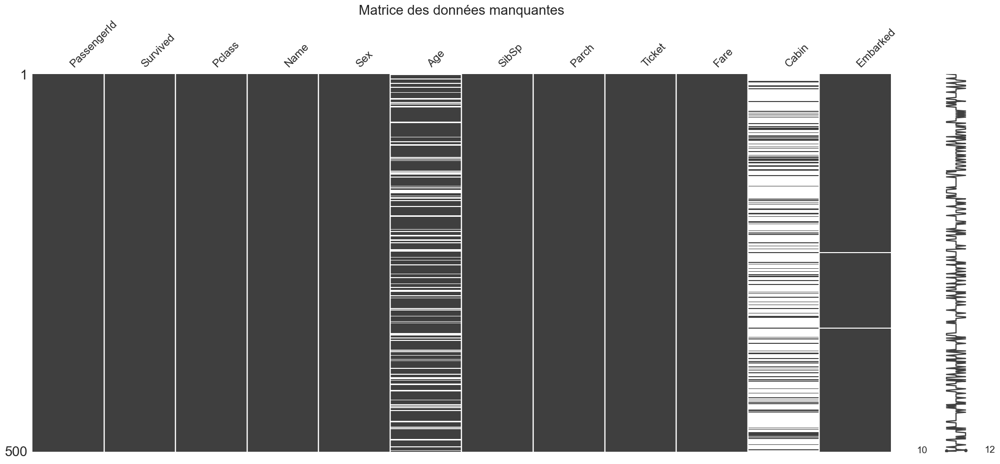

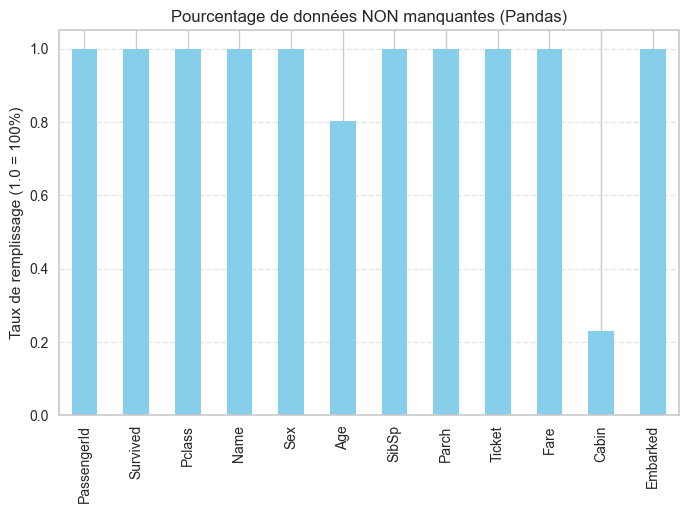

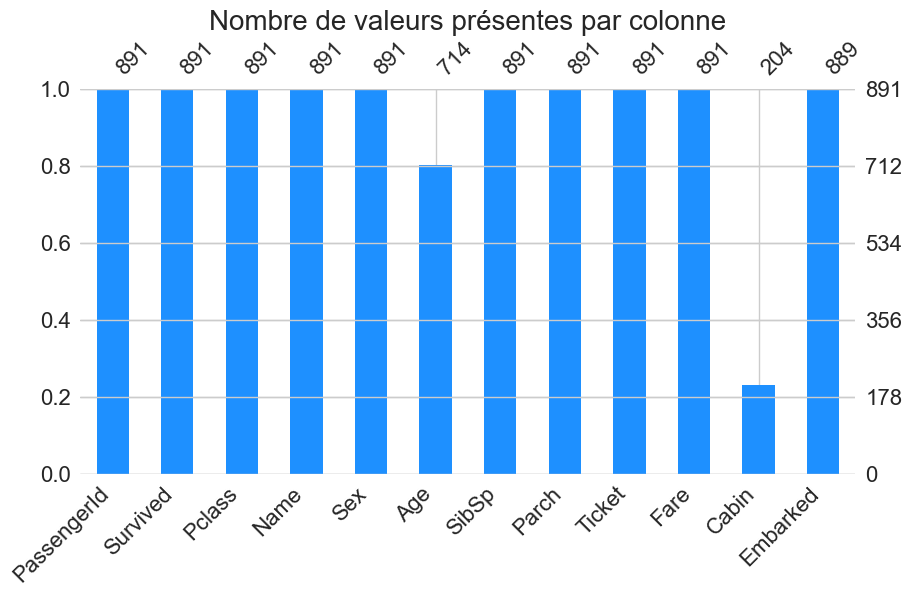

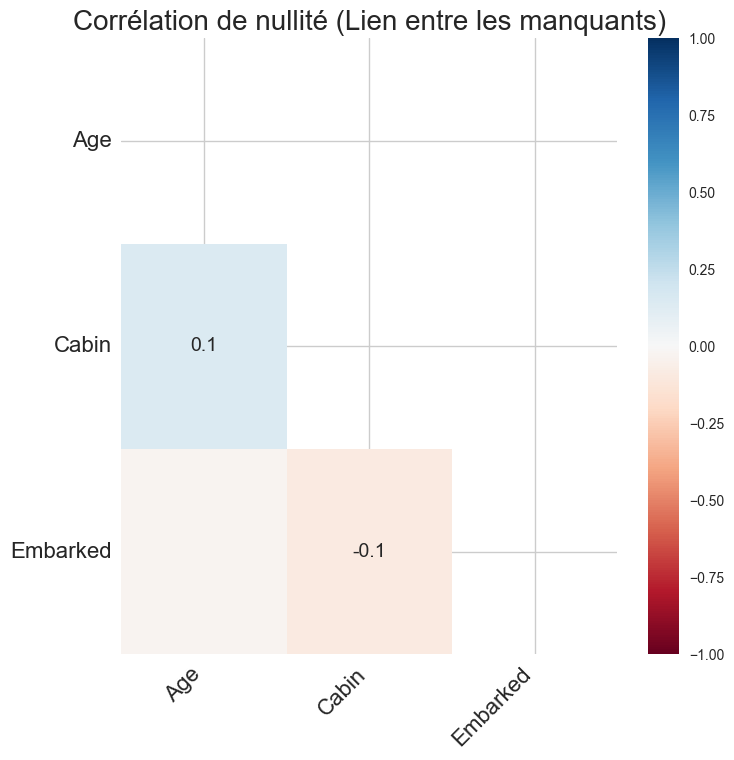

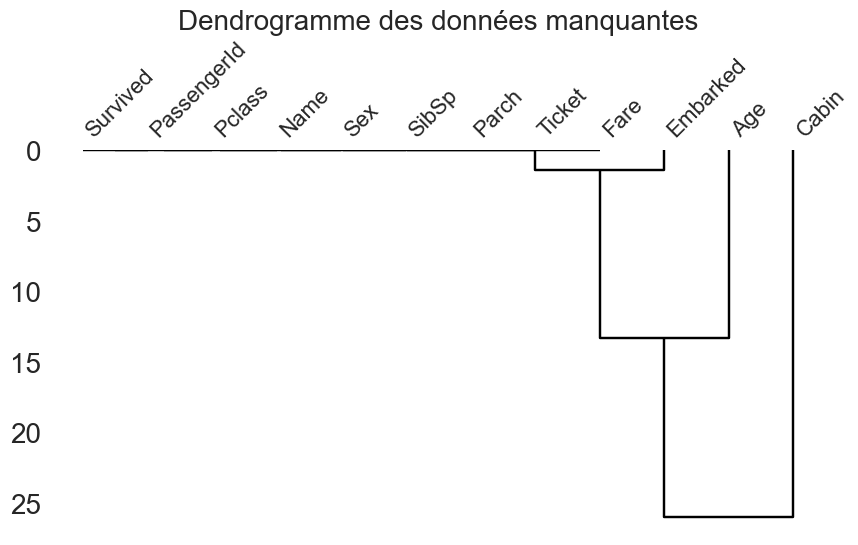

In [19]:
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
%matplotlib inline

# On recharge les données brutes pour bien voir les manquants
file_path = r"C:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\titanic_dataset.csv"
orig_df = pd.read_csv(file_path)

# On prend un échantillon de 500 lignes (ou tout le dataset si tu préfères)
# La ligne brisée à droite (sparkline) résume la complétude de la ligne
ax = msno.matrix(orig_df.sample(500, random_state=42))
plt.title("Matrice des données manquantes", fontsize=20)
plt.show()





fig, ax = plt.subplots(figsize=(8, 5))

# Calcul : 1 - le taux de vide = le taux de remplissage
# On utilise orig_df pour voir les vrais trous
(1 - orig_df.isnull().mean()).abs().plot.bar(ax=ax, color='skyblue')

plt.title("Pourcentage de données NON manquantes (Pandas)")
plt.ylabel("Taux de remplissage (1.0 = 100%)")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()




# msno.bar affiche le nombre de valeurs présentes pour chaque colonne
ax = msno.bar(orig_df, color="dodgerblue", figsize=(10, 5))
plt.title("Nombre de valeurs présentes par colonne", fontsize=20)
plt.show()





# figsize permet d'agrandir l'image pour lire les étiquettes
ax = msno.heatmap(orig_df, figsize=(8, 8))
plt.title("Corrélation de nullité (Lien entre les manquants)", fontsize=20)
plt.show()





ax = msno.dendrogram(orig_df, figsize=(10, 5))
plt.title("Dendrogramme des données manquantes", fontsize=20)
plt.show()



## Imputation des données manquantes

In [20]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

# Rechargement propre
df = pd.read_csv(r"C:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\titanic_dataset.csv")

# Séparation X et y
y = df["Survived"]
X = df.drop(columns="Survived")

# Split Train/Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# --- A. Imputation par la MOYENNE (pour l'Âge) ---
# On isole la colonne Age (double crochets pour garder un DataFrame)
age_imputer = SimpleImputer(strategy='mean')

# 1. On apprend la moyenne sur le TRAIN et on remplace
X_train.loc[:, ['Age']] = age_imputer.fit_transform(X_train[['Age']])

# 2. On utilise cette même moyenne pour le TEST (sans recalculer !)
X_test.loc[:, ['Age']] = age_imputer.transform(X_test[['Age']])


# --- B. Imputation par la FRÉQUENCE (pour Embarked) ---
# strategy='most_frequent' remplace par la valeur la plus courante (Mode)
embarked_imputer = SimpleImputer(strategy='most_frequent')

X_train.loc[:, ['Embarked']] = embarked_imputer.fit_transform(X_train[['Embarked']])
X_test.loc[:, ['Embarked']] = embarked_imputer.transform(X_test[['Embarked']])

print("Vérification des manquants sur Age (Train) :", X_train['Age'].isnull().sum())

Vérification des manquants sur Age (Train) : 0


## Ajout colonnes indicatrices de données manquantes

In [21]:
# Définition de la fonction (Wrapper) proposée par ton texte
def add_indicator(col_name):
    def wrapper(df):
        # Renvoie 1 si la valeur est manquante (isna), 0 sinon
        return df[col_name].isna().astype(int)
    return wrapper

# --- Application ---
# On utilise .assign() pour créer la nouvelle colonne 'Cabin_missing'
# Note : On applique ça sur une copie pour l'exemple
X_train_indic = X_train.copy()

X_train_indic = X_train_indic.assign(
    Cabin_missing=add_indicator("Cabin")(X_train_indic)
)

print("\nAperçu de la nouvelle colonne indicatrice :")
print(X_train_indic[['Cabin', 'Cabin_missing']].head(10))


Aperçu de la nouvelle colonne indicatrice :
    Cabin  Cabin_missing
445   A34              0
650   NaN              1
172   NaN              1
450   NaN              1
314   NaN              1
332   C91              0
801   NaN              1
90    NaN              1
834   NaN              1
181   NaN              1


## Renommage colonnes

In [22]:
import pandas as pd

# 1. Chargement des données brutes
df = pd.read_csv(r"C:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\titanic_dataset.csv")

print("Avant renommage :", df.columns.tolist())

# 2. Fonction de nettoyage (Méthode recommandée par ton texte)
def clean_col(name):
    return (
        name.strip()        # Enlève les espaces avant/après
        .lower()            # Met tout en minuscule
        .replace(" ", "_")  # Remplace les espaces par des _
        .replace(".", "_")  # Remplace les points par des _ (ex: Home.dest)
        .replace("/", "_")  # Sécurité supplémentaire
    )

# 3. Application
df = df.rename(columns=clean_col)

print("Après renommage :", df.columns.tolist())

Avant renommage : ['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp', 'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked']
Après renommage : ['passengerid', 'survived', 'pclass', 'name', 'sex', 'age', 'sibsp', 'parch', 'ticket', 'fare', 'cabin', 'embarked']


## Remplacement des manquants avec 2 colonnes similaires

In [23]:
# --- A. Remplissage simple (fillna) ---
# Pour la colonne 'cabin' (qui a beaucoup de vides), on met "Unknown"
# Cela permet de garder l'info "n'avait pas de cabine" sans avoir de NaN.
df["cabin"] = df["cabin"].fillna("Unknown")

# Pour l'embarquement, on met le port le plus fréquent (S)
df["embarked"] = df["embarked"].fillna("S")

print("\nExemple après fillna sur Cabin :")
print(df["cabin"].head())


# --- B. La logique Coalesce (Pour info) ---
# Si jamais tu voulais combiner deux colonnes, voici comment faire en pur Pandas
# (Equivalent à jn.coalesce sans installer la librairie)
# Imaginons une colonne 'age' et une colonne 'age_guess' (fictive)
import numpy as np
df['age_guess'] = df['age'] + 0.5 # Juste pour l'exemple

# combine_first fait exactement un "coalesce" :
# Il prend 'age', et si c'est vide, il prend 'age_guess'
df['age_final'] = df['age'].combine_first(df['age_guess'])


Exemple après fillna sur Cabin :
0    Unknown
1        C85
2    Unknown
3       C123
4    Unknown
Name: cabin, dtype: object


## Contrôle qualité si manquants restants dataset

In [24]:
# Vérifie s'il reste UN SEUL trou dans tout le tableau
reste_des_trous = df.isna().any().any()

if reste_des_trous:
    print("\nATTENTION : Il reste des données manquantes !")
    # Afficher quelles colonnes sont concernées
    print(df.columns[df.isna().any()].tolist())
else:
    print("\nPARFAIT : Le dataset est complet, prêt pour le modèle.")


ATTENTION : Il reste des données manquantes !
['age', 'age_guess', 'age_final']


## Exploration des données

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

# %matplotlib inline est nécessaire dans les notebooks
%matplotlib inline

# Chargement propre
df = pd.read_csv(r"C:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\titanic_dataset.csv")

# Petit nettoyage rapide nécessaire pour que les graphiques fonctionnent
# (On remplit l'âge pour éviter les trous dans les graphiques)
df['Age'] = df['Age'].fillna(df['Age'].median())
df['Fare'] = df['Fare'].fillna(df['Fare'].median())

# Séparation X/y pour coller à la logique de ton livre
y = df['Survived']
X = df.drop(columns=['Survived'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

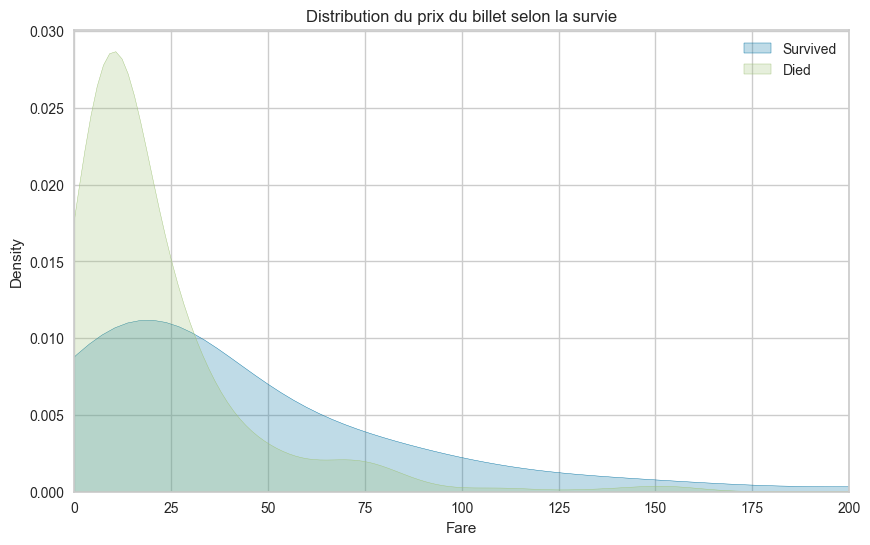

In [26]:
# Code mis à jour (distplot -> kdeplot pour courbe, histplot pour barres)
fig, ax = plt.subplots(figsize=(10, 6))

# On masque sur le TRAIN (comme dans le livre)
mask = y_train == 1

# Note : 'shade' est devenu 'fill' dans les nouvelles versions
sns.kdeplot(data=X_train[mask], x='Fare', label='Survived', fill=True, ax=ax)
sns.kdeplot(data=X_train[~mask], x='Fare', label='Died', fill=True, ax=ax)

ax.set_xlim(0, 200) # On zoome car certains billets coûtent 500+
ax.set_title("Distribution du prix du billet selon la survie")
ax.legend()
plt.show()

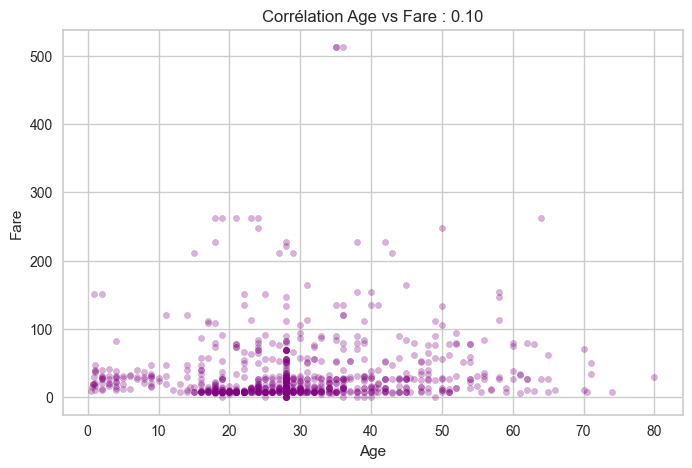

In [27]:
fig, ax = plt.subplots(figsize=(8, 5))

# Alpha gère la transparence (0.3 = 30% opaque)
X.plot.scatter(x="Age", y="Fare", ax=ax, alpha=0.3, color='purple')

plt.title(f"Corrélation Age vs Fare : {X['Age'].corr(X['Fare']):.2f}")
plt.show()

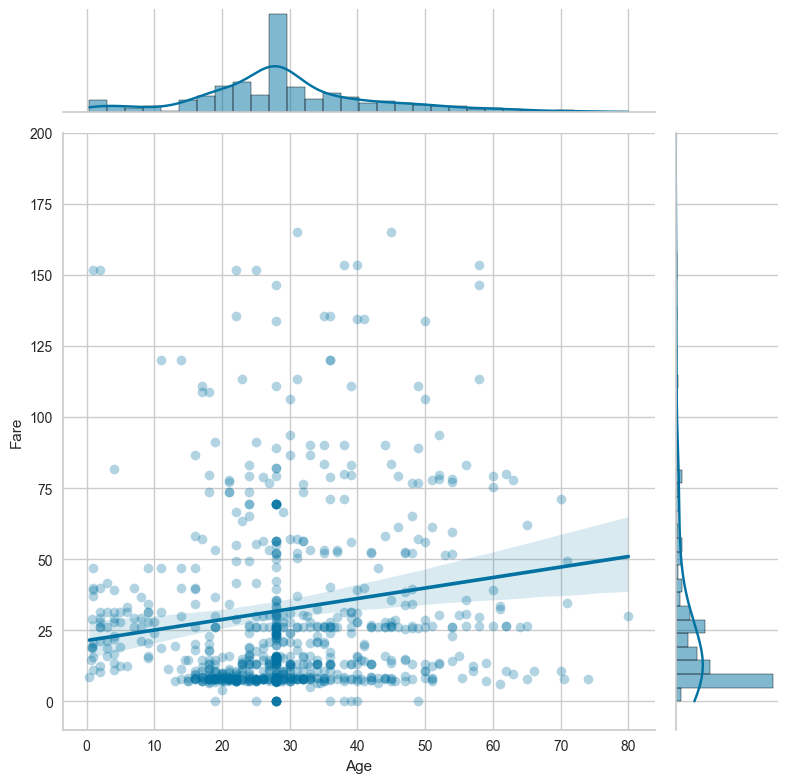

In [28]:
# Version Seaborn (plus robuste)
# On crée un DF temporaire pour faciliter le travail de Seaborn
temp_df = X.copy()
temp_df["Target"] = y

# kind='reg' ajoute la ligne de régression et les courbes de densité
g = sns.jointplot(
    data=temp_df, 
    x="Age", 
    y="Fare", 
    kind="reg",
    height=8,
    scatter_kws={'alpha': 0.3} # Transparence des points
)

# On limite l'axe Y pour mieux voir (les billets très chers écrasent le graphique)
g.ax_joint.set_ylim(-10, 200)
plt.show()

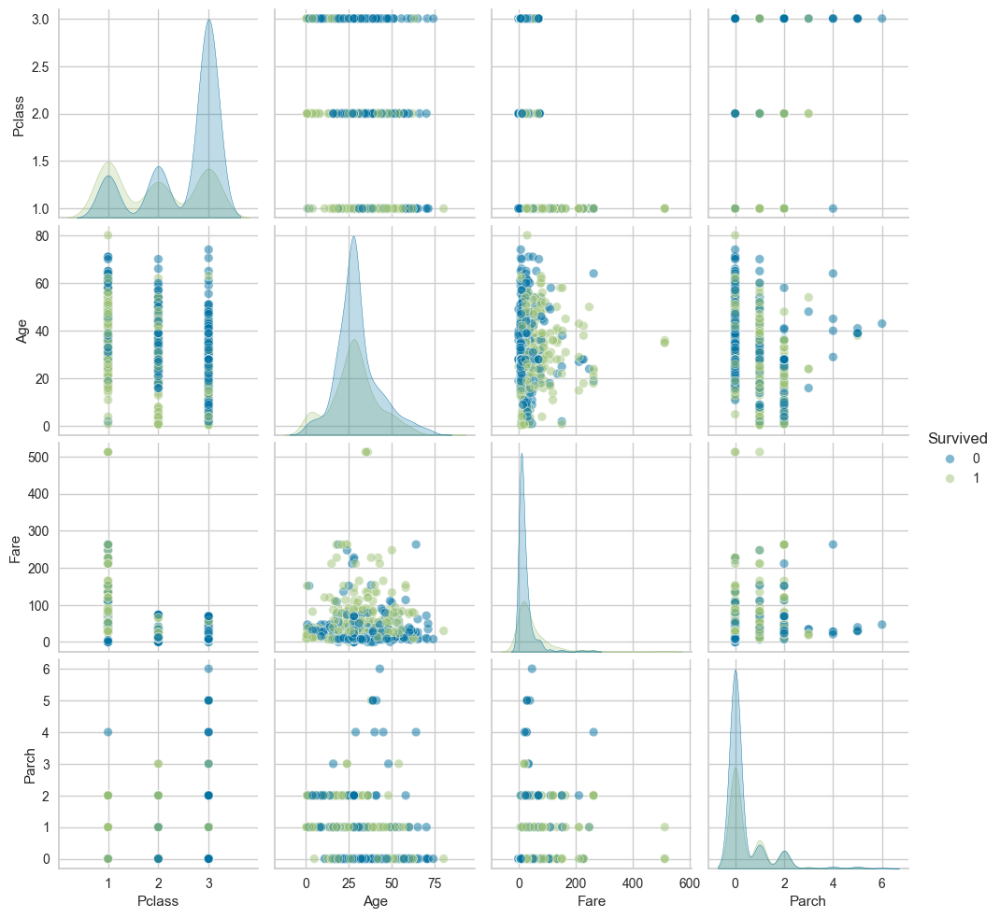

In [29]:
# On sélectionne quelques variables clés
vars_to_plot = ["Pclass", "Age", "Fare", "Parch"]

temp_df = X.copy()
temp_df["Survived"] = y # On recolle la cible pour la couleur

# hue="Survived" permet de colorier les points (Mort=Bleu, Survie=Orange par défaut)
sns.pairplot(
    temp_df, 
    vars=vars_to_plot, 
    hue="Survived", 
    kind="scatter", # 'reg' est possible mais très lent sur 4x4 graphiques
    diag_kind="kde", # Densité sur la diagonale
    plot_kws={'alpha': 0.5}
)
plt.show()

C:\Users\TBAUU1N9\AppData\Local\Temp\ipykernel_6916\3659843306.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\TBAUU1N9\AppData\Local\Temp\ipykernel_6916\3659843306.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


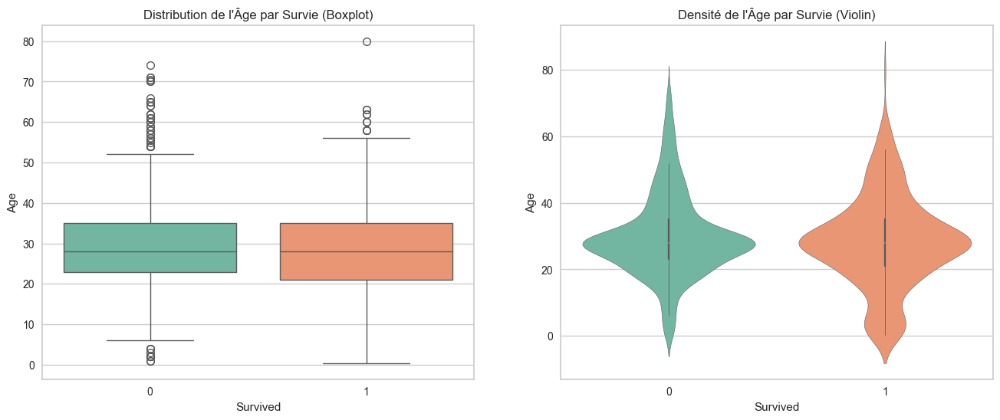

In [30]:
# On utilise Subplots pour mettre les deux côte à côte
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

temp_df = X.copy()
temp_df["Survived"] = y

# --- A. BoxPlot (Boîte à moustaches) ---
sns.boxplot(
    data=temp_df, 
    x="Survived", 
    y="Age", 
    ax=axes[0],
    palette="Set2"
)
axes[0].set_title("Distribution de l'Âge par Survie (Boxplot)")

# --- B. ViolinPlot (Violon) ---
# Le violon montre la densité (la "forme" de la distribution)
# Pour Sex, il faut qu'il soit numérique ou textuel, assurons-nous qu'il est lisible
sns.violinplot(
    data=temp_df, 
    x="Survived", 
    y="Age", # J'ai remis Age car Sex est binaire (moins joli en violon)
    ax=axes[1],
    palette="Set2"
)
axes[1].set_title("Densité de l'Âge par Survie (Violin)")

plt.show()

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from yellowbrick.features import Rank2D, RadViz

# 1. Chargement et nettoyage rapide
df = pd.read_csv(r"C:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\titanic_dataset.csv")

# On garde uniquement les colonnes numériques pertinentes pour les corrélations
# et on bbouche les trous (imputation rapide médiane)
cols = ['Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'Survived']
df_clean = df[cols].copy()
df_clean = df_clean.fillna(df_clean.median())

X = df_clean.drop(columns='Survived')
y = df_clean['Survived']

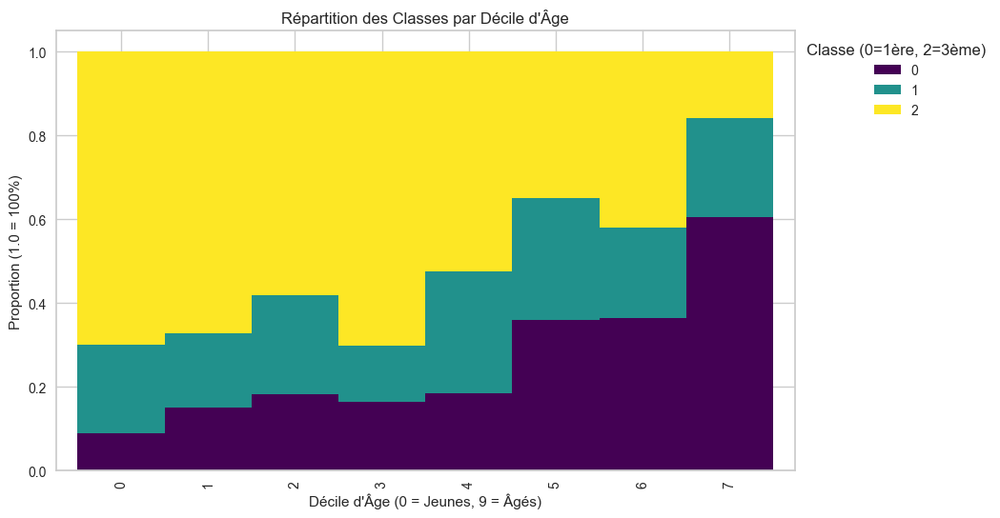

In [32]:
import matplotlib.pyplot as plt
import pandas as pd

fig, ax = plt.subplots(figsize=(10, 6))

(
    X.assign(
        # CORRECTION ICI : ajout de duplicates='drop'
        age_bin=pd.qcut(X["Age"], q=10, labels=False, duplicates='drop'),
        
        class_bin=pd.cut(X["Pclass"], bins=3, labels=False)
    )
    .groupby(["age_bin", "class_bin"])
    .size()
    .unstack()
    .pipe(lambda df: df.div(df.sum(1), axis=0)) # Normalisation
    .plot.bar(
        stacked=True,
        width=1,
        ax=ax,
        cmap="viridis",
    )
)

plt.title("Répartition des Classes par Décile d'Âge")
plt.xlabel("Décile d'Âge (0 = Jeunes, 9 = Âgés)")
plt.ylabel("Proportion (1.0 = 100%)")
plt.legend(title="Classe (0=1ère, 2=3ème)", bbox_to_anchor=(1, 1))
plt.show()

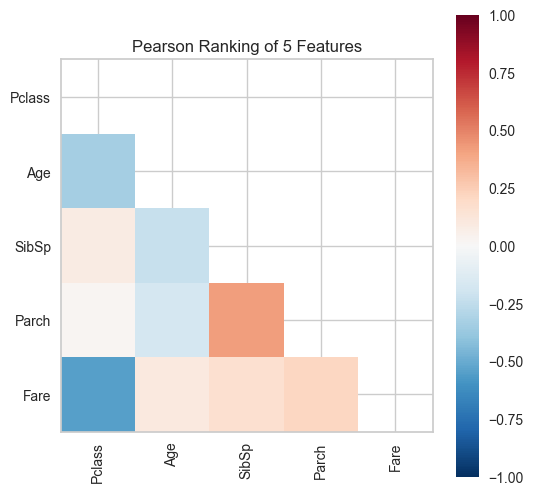

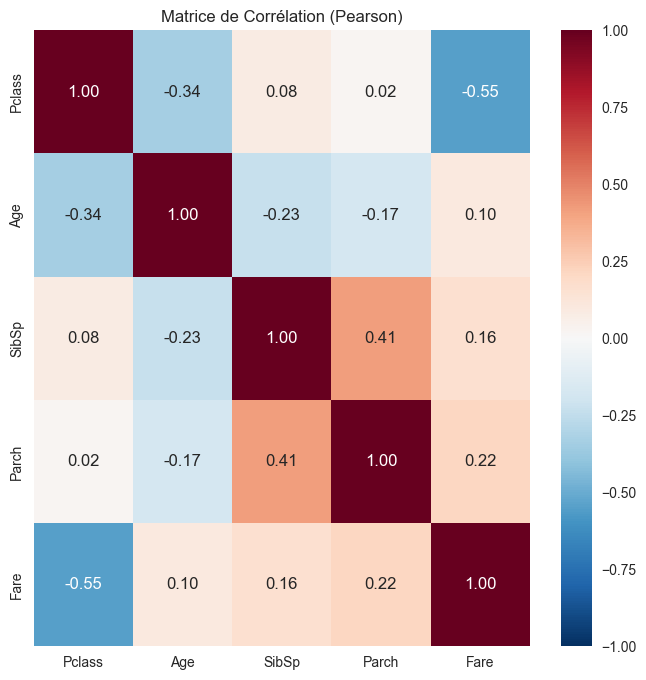

In [33]:
# --- A. Yellowbrick Rank2D (Covariance ou Pearson) ---
fig, ax = plt.subplots(figsize=(6, 6))

# algorithm='pearson' ou 'covariance'
pcv = Rank2D(features=X.columns, algorithm="pearson", ax=ax)
pcv.fit(X, y)
pcv.transform(X)
pcv.show()


# --- B. Seaborn Heatmap (Carte de chaleur) ---
fig, ax = plt.subplots(figsize=(8, 8))

sns.heatmap(
    X.corr(),       # Matrice de corrélation Pandas
    fmt=".2f",      # 2 chiffres après la virgule
    annot=True,     # Écrire les chiffres dans les cases
    ax=ax,
    cmap="RdBu_r",  # Rouge (négatif) à Bleu (positif)
    vmin=-1,
    vmax=1,
)
plt.title("Matrice de Corrélation (Pearson)")
plt.show()

In [34]:
def correlated_columns(df, threshold=0.95):
    return (
        df.corr()
        .pipe(
            lambda df1: pd.DataFrame(
                np.tril(df1, k=-1), # Garde le triangle inférieur de la matrice
                columns=df.columns,
                index=df.columns,
            )
        )
        .stack()
        .rename("pearson")
        .pipe(
            lambda s: s[s.abs() > threshold].reset_index()
        )
        .query("level_0 not in level_1")
    )

# Test sur nos données
# (Il n'y aura probablement rien car nos colonnes sont assez indépendantes,
# baissons le seuil à 0.5 pour voir quelque chose)
print("Paires de colonnes corrélées (Seuil > 0.5) :")
print(correlated_columns(X, threshold=0.5))

Paires de colonnes corrélées (Seuil > 0.5) :
  level_0 level_1  pearson
0    Fare  Pclass  -0.5495


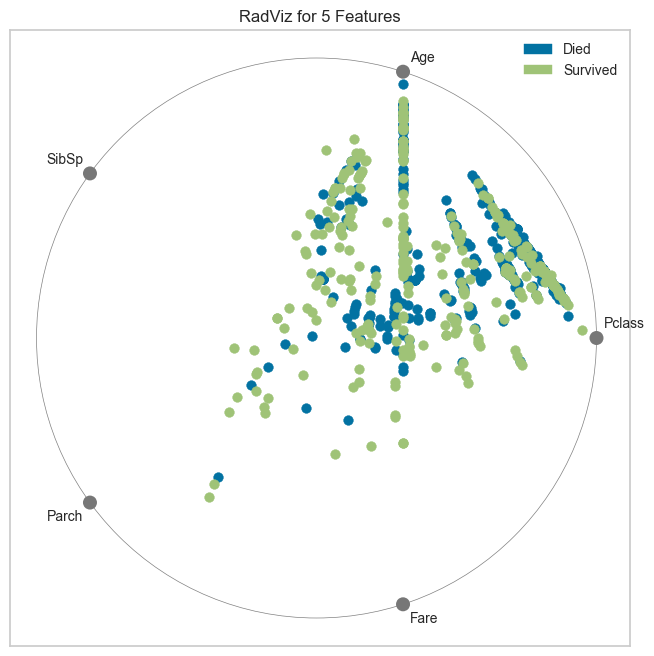

<Axes: title={'center': 'RadViz for 5 Features'}>

In [35]:
# --- Version Yellowbrick ---
fig, ax = plt.subplots(figsize=(8, 8))

rv = RadViz(
    classes=["Died", "Survived"],
    features=X.columns,
    ax=ax
)

rv.fit(X, y)
rv.transform(X)
rv.show()

# Note : Si les points sont tous mélangés au centre, c'est que la séparation 
# est difficile avec ces seules variables numériques.

C:\Users\TBAUU1N9\AppData\Local\Temp\ipykernel_6916\2121398186.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


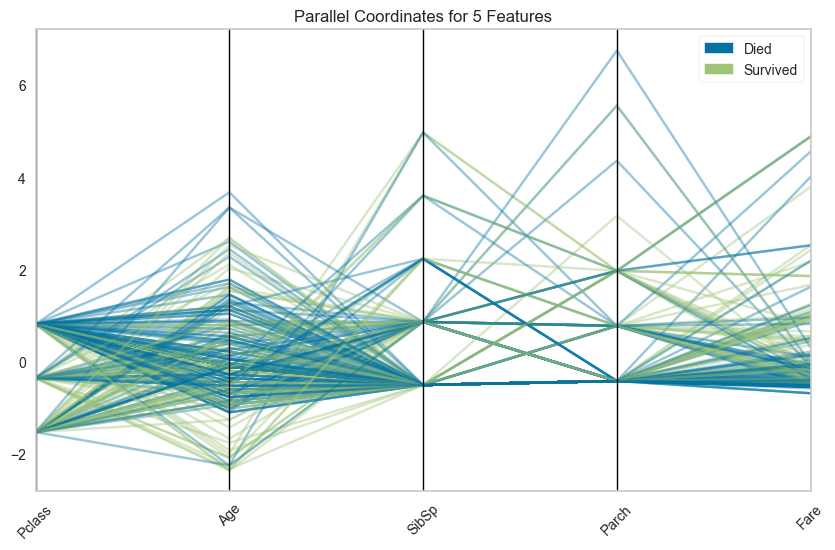

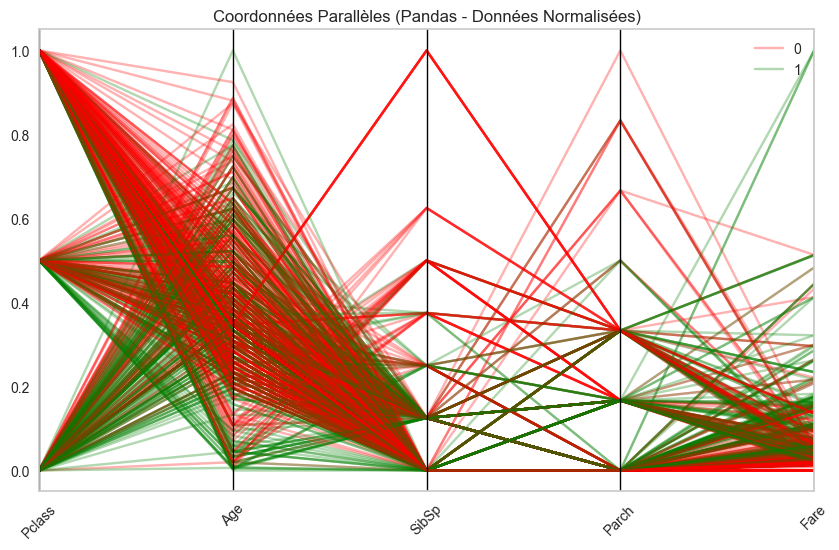

In [36]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from yellowbrick.features import ParallelCoordinates
from pandas.plotting import parallel_coordinates

# 1. Sélection des colonnes pertinentes (Numériques continues/ordinales)
# On évite les colonnes binaires (Sex_male, Embarked) qui rendent le graphique illisible.
features = ['Pclass', 'Age', 'SibSp', 'Parch', 'Fare']

# On s'assure d'avoir des données propres (copie pour ne pas casser X)
X_plot = X[features].copy()
y_plot = y.copy()

# --- OPTION 1 : Avec Yellowbrick (Le plus simple) ---
# Yellowbrick possède un argument 'normalize' magique qui règle le souci d'échelle.

fig, ax = plt.subplots(figsize=(10, 6))

pc = ParallelCoordinates(
    classes=["Died", "Survived"],
    features=features,
    normalize='standard',  # Indispensable : met tout à la même échelle
    ax=ax,
    sample=0.3,            # On prend 30% des points pour éviter de saturer le dessin
    shuffle=True,
    alpha=0.4
)

pc.fit(X_plot, y_plot)
pc.transform(X_plot)

# Rotation des étiquettes pour la lisibilité
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

pc.show()


# --- OPTION 2 : Avec Pandas (Le plus manuel) ---
# Pandas ne normalise pas tout seul. Il faut le faire avant.

# A. Normalisation manuelle (0 à 1)
scaler = MinMaxScaler()
X_norm = pd.DataFrame(scaler.fit_transform(X_plot), columns=features)

# B. Préparation du DataFrame (X + y ensemble)
df_plot = X_norm.copy()
df_plot['Target'] = y_plot.values # .values pour éviter les soucis d'index

fig, ax = plt.subplots(figsize=(10, 6))

parallel_coordinates(
    df_plot,
    "Target",
    color=['red', 'green'], # Rouge pour morts (0), Vert pour survivants (1)
    ax=ax,
    alpha=0.3
)

plt.title("Coordonnées Parallèles (Pandas - Données Normalisées)")
plt.xticks(rotation=45)
plt.show()

## Prétraitement des données

## Scaling

In [37]:
import pandas as pd
from sklearn import preprocessing

# Données d'exemple
X2 = pd.DataFrame({
    "a": range(5),
    "b": [-100, -50, 0, 200, 1000],
})

# --- A. Standardisation (StandardScaler) ---
std = preprocessing.StandardScaler()
# On fit_transform pour apprendre la moyenne/écart-type et transformer
X2_std = std.fit_transform(X2)

# --- B. Mise à l'échelle (MinMaxScaler) ---
mms = preprocessing.MinMaxScaler()
X2_minmax = mms.fit_transform(X2)

print("Données standardisées (Moyenne=0) :")
print(X2_std)
print("\nDonnées normalisées (0 à 1) :")
print(X2_minmax)

Données standardisées (Moyenne=0) :
[[-1.41421356 -0.75995002]
 [-0.70710678 -0.63737744]
 [ 0.         -0.51480485]
 [ 0.70710678 -0.02451452]
 [ 1.41421356  1.93664683]]

Données normalisées (0 à 1) :
[[0.         0.        ]
 [0.25       0.04545455]
 [0.5        0.09090909]
 [0.75       0.27272727]
 [1.         1.        ]]


## Gestion catégories (dummies et labels)

In [38]:
X_cat = pd.DataFrame({
    "name": ["George", "Paul", "John"],
    "inst": ["Bass", "Guitar", "Guitar"]
})

# --- A. One-Hot Encoding (Dummies) ---
# Crée une colonne par valeur (ex: inst_Bass, inst_Guitar)
# drop_first=True évite la colinéarité (si c'est pas Bass, c'est forcément Guitar)
dummies = pd.get_dummies(X_cat, drop_first=True, dtype=int)
print("\nVariables Factices (One-Hot) :")
print(dummies)

# --- B. Label Encoding ---
# Transforme le texte en chiffres (0, 1, 2...)
# Utile pour les arbres de décision, mais attention : cela introduit un ordre implicite !
le = preprocessing.LabelEncoder()
X_cat['inst_code'] = le.fit_transform(X_cat['inst'])
print("\nLabel Encoding :")
print(X_cat)


Variables Factices (One-Hot) :
   name_John  name_Paul  inst_Guitar
0          0          0            0
1          0          1            1
2          1          0            1

Label Encoding :
     name    inst  inst_code
0  George    Bass          0
1    Paul  Guitar          1
2    John  Guitar          1


## Feature engineering texte (Mr Mrs donne info)

In [39]:
# Chargement du Titanic
df = pd.read_csv('titanic_dataset.csv')
# Nettoyage des noms de colonnes en minuscules
df.columns = df.columns.str.lower()

# Extraction avec Regex : On cherche les lettres avant le point "."
# ([A-Za-z]+) signifie : un ou plusieurs caractères alphabétiques
df['title'] = df['name'].str.extract(r"([A-Za-z]+)\.", expand=False)

print("\nTitres les plus fréquents :")
print(df['title'].value_counts().head())


Titres les plus fréquents :
title
Mr        517
Miss      182
Mrs       125
Master     40
Dr          7
Name: count, dtype: int64


## Gestion des dates

In [40]:
dates = pd.DataFrame({
    "date": pd.to_datetime(["2001-09-17", "2002-01-01"])
})

# Extraction des composants
dates["Year"] = dates["date"].dt.year
dates["Month"] = dates["date"].dt.month
dates["DayOfWeek"] = dates["date"].dt.dayofweek # 0=Lundi
dates["Is_Month_Start"] = dates["date"].dt.is_month_start

print("\nCaractéristiques temporelles extraites :")
print(dates)


Caractéristiques temporelles extraites :
        date  Year  Month  DayOfWeek  Is_Month_Start
0 2001-09-17  2001      9          0           False
1 2002-01-01  2002      1          1            True


## Gestion valeurs manquantes

In [41]:
data_na = pd.DataFrame({"Valeur": [0, None, 5, 100]})

# 1. On crée le drapeau "Est vide"
data_na["Valeur_Manquante"] = data_na["Valeur"].isnull().astype(int)

# 2. On remplit le vide avec la médiane (pour ne pas casser le modèle)
median_val = data_na["Valeur"].median()
data_na["Valeur_Remplie"] = data_na["Valeur"].fillna(median_val)

print("\nGestion des manquants :")
print(data_na)


Gestion des manquants :
   Valeur  Valeur_Manquante  Valeur_Remplie
0     0.0                 0             0.0
1     NaN                 1             5.0
2     5.0                 0             5.0
3   100.0                 0           100.0


## Création manuelles de caractéristiques calculées (feature engineering)

In [42]:
import pandas as pd

# 1. Chargement et Préparation
# On remplace les NaN de Cabin par "Unknown" pour ne perdre personne lors du groupement
df = pd.read_csv(r"C:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\titanic_dataset.csv")
df['Cabin'] = df['Cabin'].fillna('Unknown')

# 2. Création de l'agrégation
# On ne sélectionne QUE les colonnes numériques (Age, Fare) pour éviter les erreurs
# sur les colonnes texte (comme Name).
agg = (
    df.groupby("Cabin")[["Age", "Fare"]]
    .agg(["min", "max", "mean", "sum"])
    .reset_index()
)

# 3. Aplatissement des noms de colonnes (Flattening)
# Le groupby crée un index à étages (ex: Age -> min). On veut 'Age_min'.
agg.columns = [
    "_".join(c).strip("_")  # Joint ('Age', 'min') en 'Age_min'
    for c in agg.columns.values
]

# 4. Fusion avec le dataset original
# On utilise le 'merge' pour recoller ces infos à chaque passager
agg_df = df.merge(agg, on="Cabin")

# --- Vérification ---
print("Nouvelles colonnes créées :")
print(agg_df.columns[agg_df.columns.str.contains("_mean|_min|_max")].tolist())

print("\nAperçu des données pour la cabine 'C23 C25 C27' (4 passagers) :")
# On regarde une cabine partagée pour voir l'intérêt de la manip
sample_cabin = agg_df[agg_df['Cabin'] == 'C23 C25 C27']
print(sample_cabin[['Name', 'Age', 'Age_mean', 'Fare_sum']])

Nouvelles colonnes créées :
['Age_min', 'Age_max', 'Age_mean', 'Fare_min', 'Fare_max', 'Fare_mean']

Aperçu des données pour la cabine 'C23 C25 C27' (4 passagers) :
                               Name   Age  Age_mean  Fare_sum
27   Fortune, Mr. Charles Alexander  19.0      32.5    1052.0
88       Fortune, Miss. Mabel Helen  23.0      32.5    1052.0
341  Fortune, Miss. Alice Elizabeth  24.0      32.5    1052.0
438               Fortune, Mr. Mark  64.0      32.5    1052.0


## Sélection des caractéristiques

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import ensemble, feature_selection, linear_model, preprocessing
from sklearn.model_selection import train_test_split

# 1. Chargement et Nettoyage de base
df = pd.read_csv(r"C:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\titanic_dataset.csv")

# Sélection des colonnes numériques
cols = ['Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'Survived']
df_clean = df[cols].copy()

# Encodage du Sexe (sinon on perd une info cruciale)
df_clean['Sex_male'] = pd.get_dummies(df['Sex'], drop_first=True, dtype=int)

# Imputation médiane
df_clean = df_clean.fillna(df_clean.median())

X = df_clean.drop(columns='Survived')
y = df_clean['Survived']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## Détection de colinéarités

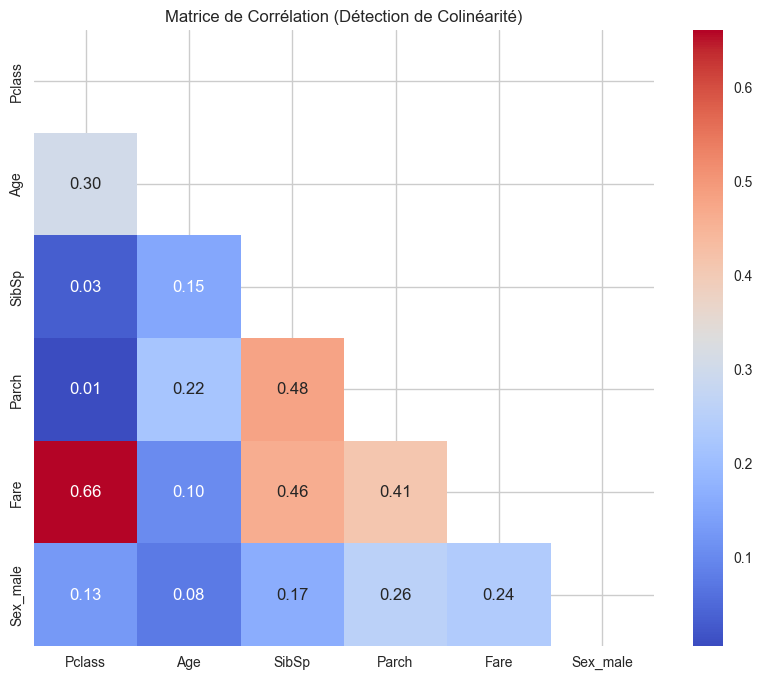

Colonnes fortement corrélées à supprimer : ['Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'Sex_male']


In [44]:
# Calcul de la corrélation
corr_matrix = X_train.corr(method='spearman').abs()

# Masque pour ne voir que le triangle supérieur (pour éviter les doublons)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matrice de Corrélation (Détection de Colinéarité)")
plt.show()

# Détection automatique des colonnes à supprimer (> 0.90)
upper = corr_matrix.where(mask)
to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]
print(f"Colonnes fortement corrélées à supprimer : {to_drop}")
# (Sur le Titanic standard, il y en a peu, mais sur le dataset agrégé du livre, il y en aurait plein)

## Régression lasso

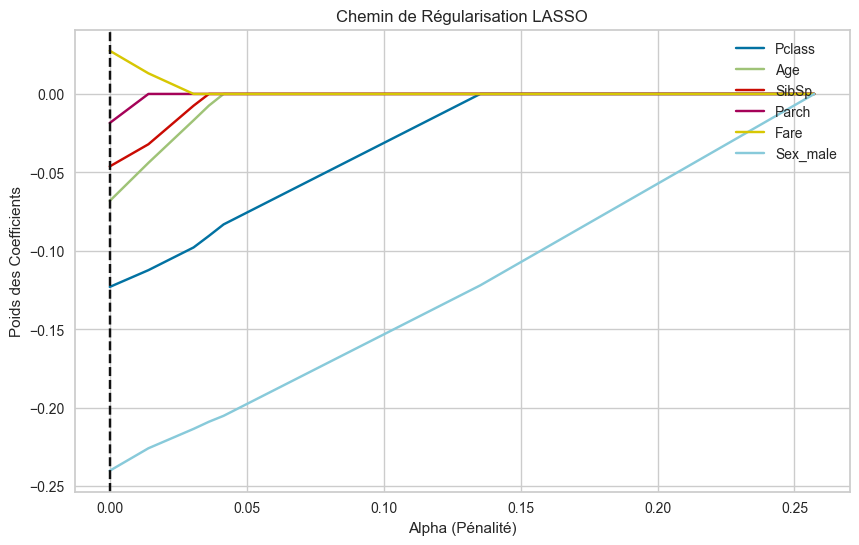

Variables conservées par Lasso :
Fare        0.027532
Parch      -0.018510
SibSp      -0.046186
Age        -0.068182
Pclass     -0.122970
Sex_male   -0.240083
dtype: float64


In [45]:
# Il faut normaliser les données pour le Lasso !
scaler = preprocessing.StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X.columns)

# Création du modèle Lasso avec Validation Croisée
model_lasso = linear_model.LassoLarsCV(cv=5, max_n_alphas=100).fit(X_train_scaled, y_train)

# Visualisation du chemin des coefficients
plt.figure(figsize=(10, 6))

# On trace l'évolution des coefficients selon Alpha (la pénalité)
# Plus on va vers la gauche, plus la pénalité est forte et plus les variables tombent à 0.
plt.plot(model_lasso.alphas_, model_lasso.coef_path_.T)

plt.axvline(model_lasso.alpha_, linestyle='--', color='k', label='Alpha Optimal')
plt.legend(X.columns, loc='upper right')
plt.title("Chemin de Régularisation LASSO")
plt.xlabel("Alpha (Pénalité)")
plt.ylabel("Poids des Coefficients")
plt.show()

# Quelles variables ont survécu ? (Celles qui ne sont pas à 0)
coefs = pd.Series(model_lasso.coef_, index=X.columns)
print("Variables conservées par Lasso :")
print(coefs[coefs != 0].sort_values(ascending=False))

## Elimination récursive

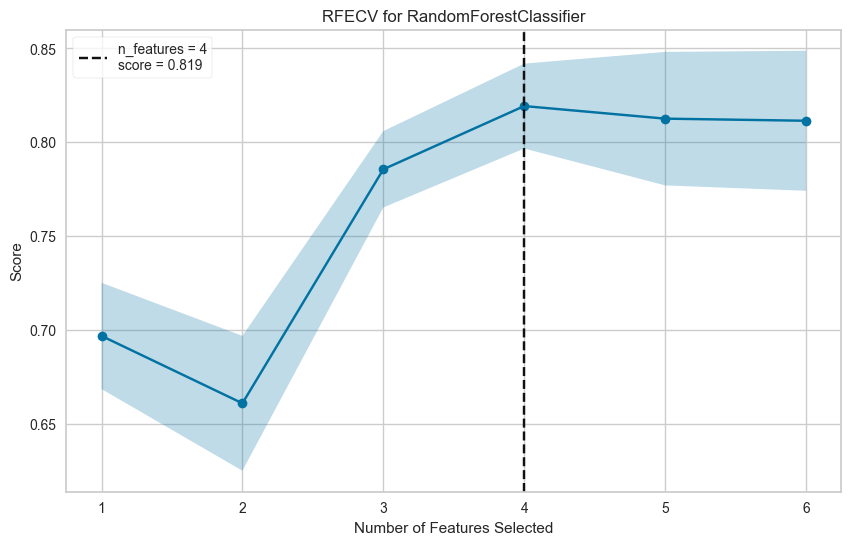

Nombre optimal de caractéristiques : 4
Caractéristiques retenues : ['Pclass', 'Age', 'Fare', 'Sex_male']


In [46]:
from yellowbrick.features import RFECV
from sklearn.ensemble import RandomForestClassifier

plt.figure(figsize=(10, 6))

# On utilise une Forêt Aléatoire comme juge
viz = RFECV(
    RandomForestClassifier(n_estimators=50, random_state=42), 
    cv=5, 
    step=1 # On enlève 1 variable à la fois
)

viz.fit(X, y)
viz.show()

print(f"Nombre optimal de caractéristiques : {viz.n_features_}")
print(f"Caractéristiques retenues : {X.columns[viz.support_].tolist()}")

## Information mutuelle (mesure dépendance entre 2 variables même si relation non linéaire contrairement à la corrélation)

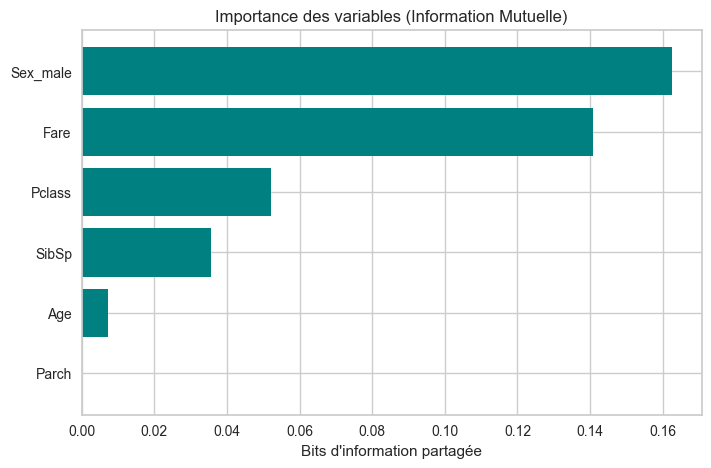

In [47]:
# Calcul de l'Information Mutuelle
mic = feature_selection.mutual_info_classif(X, y, random_state=42)

# Mise en forme graphique
mic_df = pd.DataFrame({"Feature": X.columns, "Mutual_Info": mic})
mic_df = mic_df.sort_values(by="Mutual_Info", ascending=True)

plt.figure(figsize=(8, 5))
plt.barh(mic_df["Feature"], mic_df["Mutual_Info"], color='teal')
plt.title("Importance des variables (Information Mutuelle)")
plt.xlabel("Bits d'information partagée")
plt.show()

# Interprétation :
# Sex_male devrait être très haut (c'est le facteur #1 sur le Titanic).
# SibSp/Parch devraient être bas.

## Classes non équilibrées

In [48]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# On reprend nos données X et y (assure-toi qu'elles sont propres/numériques)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print("--- Méthode 1 : Class Weight ---")
# class_weight='balanced' calcule automatiquement les poids
# (inversement proportionnel à la fréquence de la classe)
rf_weighted = RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=42)

rf_weighted.fit(X_train, y_train)
print("Score (AUC) :", rf_weighted.score(X_test, y_test))

# Rapport détaillé pour voir la précision sur la classe "1" (Survivants)
print(classification_report(y_test, rf_weighted.predict(X_test)))

--- Méthode 1 : Class Weight ---
Score (AUC) : 0.7649253731343284
              precision    recall  f1-score   support

           0       0.79      0.82      0.80       157
           1       0.73      0.69      0.71       111

    accuracy                           0.76       268
   macro avg       0.76      0.75      0.76       268
weighted avg       0.76      0.76      0.76       268



## Suréchantillonnage manuel

In [49]:
from sklearn.utils import resample
import pandas as pd

print("\n--- Méthode 2 : Suréchantillonnage Manuel ---")

# 1. On recolle X et y du TRAIN seulement (ne jamais toucher au Test !)
train_data = pd.concat([X_train, y_train], axis=1)

# 2. Séparation des classes
minority = train_data[train_data.Survived == 1]
majority = train_data[train_data.Survived == 0]

# 3. Upsampling (Duplication des minoritaires)
minority_upsampled = resample(
    minority,
    replace=True,     # On autorise à prendre plusieurs fois le même passager
    n_samples=len(majority), # On vise la même taille que la majorité
    random_state=42
)

# 4. Recombinaison
train_upsampled = pd.concat([majority, minority_upsampled])

print("Nouvelle répartition des classes :")
print(train_upsampled.Survived.value_counts())

# 5. Entraînement sur données gonflées
X_train_up = train_upsampled.drop('Survived', axis=1)
y_train_up = train_upsampled.Survived

rf_up = RandomForestClassifier(random_state=42)
rf_up.fit(X_train_up, y_train_up)
print("Score après upsampling :", rf_up.score(X_test, y_test))


--- Méthode 2 : Suréchantillonnage Manuel ---
Nouvelle répartition des classes :
Survived
0    392
1    392
Name: count, dtype: int64
Score après upsampling : 0.7686567164179104


## Génération de données

In [50]:
try:
    from imblearn.over_sampling import SMOTE
    
    print("\n--- Méthode 3 : SMOTE (Génération Synthétique) ---")
    
    smote = SMOTE(random_state=42)
    
    # On applique SMOTE uniquement sur le TRAIN
    X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
    
    print(f"Taille avant SMOTE : {X_train.shape[0]}")
    print(f"Taille après SMOTE : {X_train_smote.shape[0]} (Les classes sont équilibrées)")
    
    rf_smote = RandomForestClassifier(random_state=42)
    rf_smote.fit(X_train_smote, y_train_smote)
    print("Score avec SMOTE :", rf_smote.score(X_test, y_test))

except ImportError:
    print("La librairie 'imblearn' n'est pas installée.")


--- Méthode 3 : SMOTE (Génération Synthétique) ---
Taille avant SMOTE : 623
Taille après SMOTE : 784 (Les classes sont équilibrées)
Score avec SMOTE : 0.7873134328358209


## Undersampling

In [51]:
try:
    from imblearn.under_sampling import ClusterCentroids
    
    print("\n--- Méthode 4 : Sous-échantillonnage (ClusterCentroids) ---")
    
    # Attention : C'est lent car ça calcule des K-Means
    cc = ClusterCentroids(random_state=42)
    X_train_cc, y_train_cc = cc.fit_resample(X_train, y_train)
    
    print("Répartition après suppression :")
    print(y_train_cc.value_counts())
    
    rf_cc = RandomForestClassifier(random_state=42)
    rf_cc.fit(X_train_cc, y_train_cc)
    print("Score ClusterCentroids :", rf_cc.score(X_test, y_test))

except ImportError:
    pass


--- Méthode 4 : Sous-échantillonnage (ClusterCentroids) ---
Répartition après suppression :
Survived
0    231
1    231
Name: count, dtype: int64
Score ClusterCentroids : 0.6753731343283582


## Régression logistique

In [52]:
from sklearn.linear_model import LogisticRegression
import numpy as np

# Création et entraînement
# C=1.0 : Régularisation standard (plus C est petit, plus le modèle est simple/contraint)
lr = LogisticRegression(random_state=42, C=1.0)
lr.fit(X_train, y_train)

# Évaluation
print(f"Accuracy sur le Test : {lr.score(X_test, y_test):.2%}")

Accuracy sur le Test : 81.34%


In [53]:
def inv_logit(p):
    """Transforme le log-odds en probabilité (0-1)"""
    return np.exp(p) / (1 + np.exp(p))

print(f"Probabilité de base (Intercept) : {inv_logit(lr.intercept_[0]):.2%}")
print("\nImpact des variables (classées par importance) :")
print(f"{'Variable':<12} {'Coeff':<8} {'Probabilité associée'}")
print("-" * 40)

# On zip les noms de colonnes avec leurs coefficients
for col, val in sorted(
    zip(X_train.columns, lr.coef_[0]),
    key=lambda x: x[1],
    reverse=True
):
    # La probabilité affichée ici est celle d'un événement si SEULE cette variable jouait avec un poids de 1
    # C'est une simplification pour l'interprétation.
    print(f"{col:12} {val:6.3f}   {inv_logit(val):.1%}")

Probabilité de base (Intercept) : 98.43%

Impact des variables (classées par importance) :
Variable     Coeff    Probabilité associée
----------------------------------------
Fare          0.004   50.1%
Age          -0.034   49.1%
Parch        -0.111   47.2%
SibSp        -0.290   42.8%
Pclass       -0.898   28.9%
Sex_male     -2.505   7.5%


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\yellowbrick\model_selection\importances.py:194: YellowbrickWarning: detected multi-dimensional feature importances but stack=False, using mean to aggregate them.
  warnings.warn(


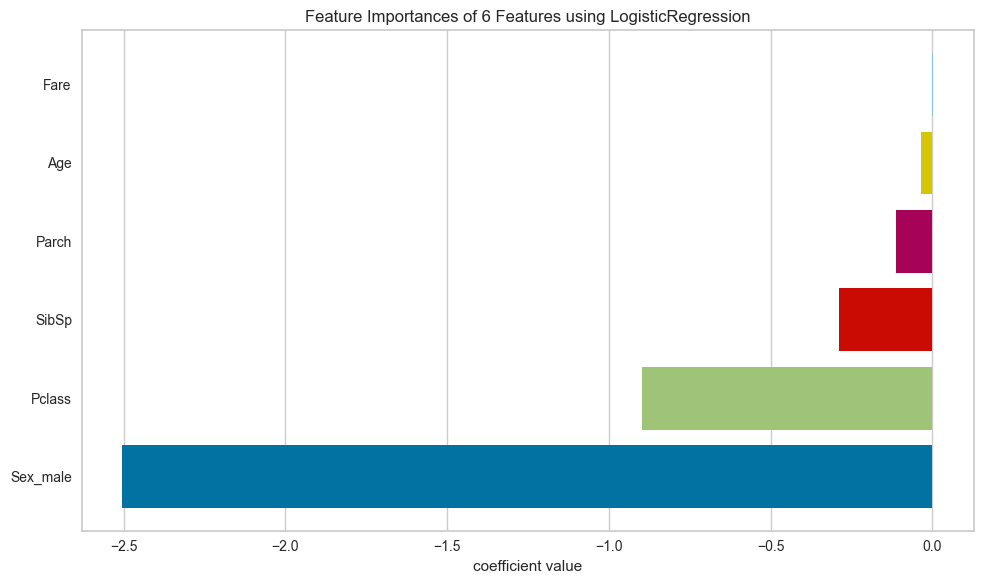

<Axes: title={'center': 'Feature Importances of 6 Features using LogisticRegression'}, xlabel='coefficient value'>

In [54]:
import matplotlib.pyplot as plt
from yellowbrick.features import FeatureImportances

# Visualisation des coefficients
plt.figure(figsize=(10, 6))
viz = FeatureImportances(lr, relative=False) # relative=False montre les vrais coefficients
viz.fit(X_train, y_train)
viz.show()

## Naive bayes

In [55]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report

# 1. Création et Entraînement
# var_smoothing aide à la stabilité si une colonne a une variance proche de 0
nb = GaussianNB(var_smoothing=1e-9)
nb.fit(X_train, y_train)

# 2. Prédiction et Score
y_pred = nb.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

print(f"Exactitude (Accuracy) du Bayésien Naïf : {accuracy:.2%}")

# 3. Probabilités
# Regardons ce que le modèle pense du premier passager du test
# Il renvoie [Probabilité de Mort, Probabilité de Survie]
proba = nb.predict_proba(X_test.iloc[[0]])
print(f"\nProbabilités pour le 1er passager (0=Mort, 1=Survie) :")
print(f"Mort : {proba[0][0]:.2%} | Survie : {proba[0][1]:.2%}")

Exactitude (Accuracy) du Bayésien Naïf : 79.10%

Probabilités pour le 1er passager (0=Mort, 1=Survie) :
Mort : 94.42% | Survie : 5.58%


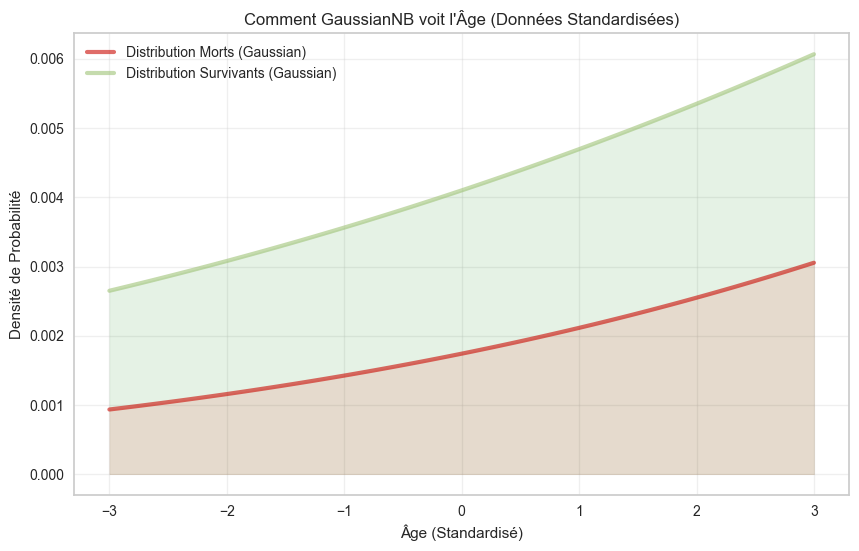

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm

# On sépare les données pour la visualisation
survived = X_train[y_train == 1]['Age']
died = X_train[y_train == 0]['Age']

# Calcul des paramètres Gaussiens (Moyenne et Écart-type) appris par le modèle
mu_s, std_s = survived.mean(), survived.std()
mu_d, std_d = died.mean(), died.std()

# Création du graphique
plt.figure(figsize=(10, 6))

# On génère l'axe des x (de -2 à 2 car les données sont standardisées)
x = np.linspace(-3, 3, 100)

# Tracé des courbes gaussiennes théoriques
plt.plot(x, norm.pdf(x, mu_d, std_d), 'r-', lw=3, alpha=0.6, label='Distribution Morts (Gaussian)')
plt.plot(x, norm.pdf(x, mu_s, std_s), 'g-', lw=3, alpha=0.6, label='Distribution Survivants (Gaussian)')

# Remplissage pour l'esthétique
plt.fill_between(x, norm.pdf(x, mu_d, std_d), color='red', alpha=0.1)
plt.fill_between(x, norm.pdf(x, mu_s, std_s), color='green', alpha=0.1)

plt.title("Comment GaussianNB voit l'Âge (Données Standardisées)")
plt.xlabel("Âge (Standardisé)")
plt.ylabel("Densité de Probabilité")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

## SVM

In [57]:
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler

# --- Rappel de sécurité : Standardisation ---
# Si tes données X_train ne sont pas encore standardisées, décommente ces lignes :
# scaler = StandardScaler()
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.transform(X_test)

# 1. Création du modèle
# probability=True est nécessaire si tu veux utiliser .predict_proba() plus tard
# kernel='rbf' est le défaut (courbure de l'espace), mais tu peux tester 'linear'
svc = SVC(random_state=42, probability=True, kernel='rbf', C=1.0)

# 2. Entraînement
print("Entraînement du SVM en cours...")
svc.fit(X_train, y_train)

# 3. Évaluation
score = svc.score(X_test, y_test)
print(f"Score (Accuracy) du SVM : {score:.2%}")

# 4. Prédiction et Probabilités
# Note : predict_proba est plus lent avec SVM car il fait une validation croisée interne
sample = X_test.iloc[[0]]
pred = svc.predict(sample)
proba = svc.predict_proba(sample)

print(f"\nPrédiction pour le 1er passager : {'Survivant' if pred[0]==1 else 'Décédé'}")
print(f"Confiance : {proba[0][pred[0]]:.2%}")

Entraînement du SVM en cours...
Score (Accuracy) du SVM : 65.67%

Prédiction pour le 1er passager : Décédé
Confiance : 70.92%


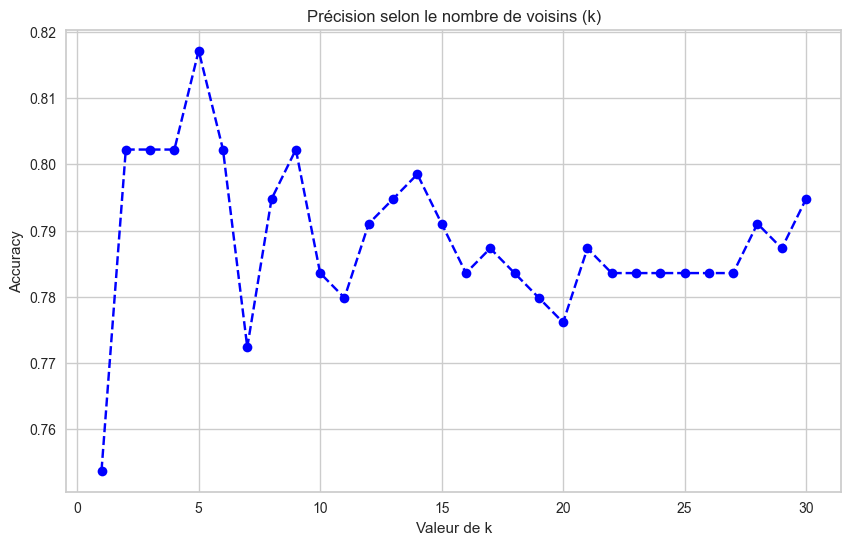

Le meilleur score est atteint avec k = 5


In [60]:
import matplotlib.pyplot as plt

scores = []
k_range = range(1, 31) # On teste de 1 à 30 voisins

for k in k_range:
    # On recrée un modèle pour chaque k
    model = make_pipeline(
        StandardScaler(),
        KNeighborsClassifier(n_neighbors=k)
    )
    model.fit(X_train, y_train)
    scores.append(model.score(X_test, y_test))

# Visualisation
plt.figure(figsize=(10, 6))
plt.plot(k_range, scores, marker='o', linestyle='dashed', color='blue')
plt.title('Précision selon le nombre de voisins (k)')
plt.xlabel('Valeur de k')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

# Quel est le meilleur k ?
best_k = k_range[scores.index(max(scores))]
print(f"Le meilleur score est atteint avec k = {best_k}")

## KNN

In [58]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# On crée un "Tuyau" : D'abord on standardise, ensuite on applique KNN
# Cela évite d'oublier de standardiser les nouvelles données plus tard.
knn_pipeline = make_pipeline(
    StandardScaler(),
    KNeighborsClassifier(n_neighbors=5) # Par défaut k=5
)

# Entraînement
knn_pipeline.fit(X_train, y_train)

# Score
print(f"Score (Accuracy) avec 5 voisins : {knn_pipeline.score(X_test, y_test):.2%}")

# Exemple de prédiction pour le 1er passager du test
pred = knn_pipeline.predict(X_test.iloc[[0]])
proba = knn_pipeline.predict_proba(X_test.iloc[[0]])
print(f"Prédiction : {pred[0]} (Proba Survie : {proba[0][1]:.0%})")

Score (Accuracy) avec 5 voisins : 81.72%
Prédiction : 0 (Proba Survie : 20%)


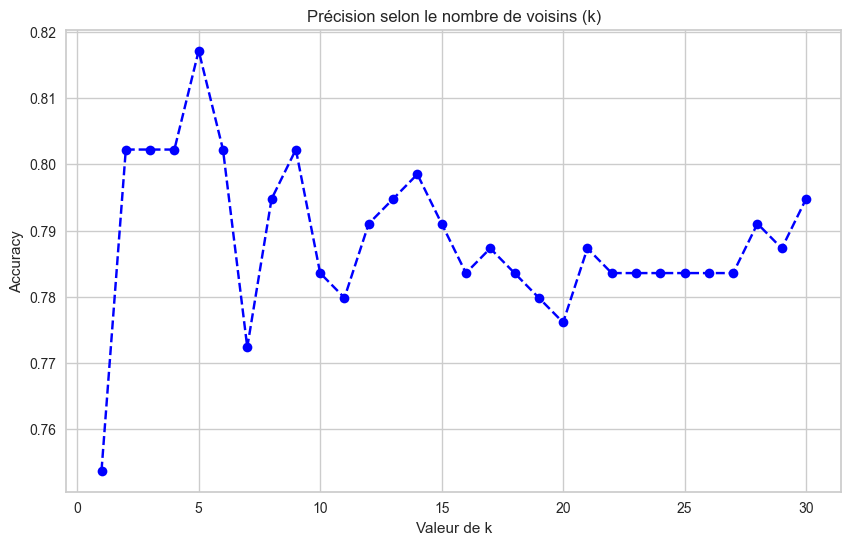

Le meilleur score est atteint avec k = 5


In [59]:
import matplotlib.pyplot as plt

scores = []
k_range = range(1, 31) # On teste de 1 à 30 voisins

for k in k_range:
    # On recrée un modèle pour chaque k
    model = make_pipeline(
        StandardScaler(),
        KNeighborsClassifier(n_neighbors=k)
    )
    model.fit(X_train, y_train)
    scores.append(model.score(X_test, y_test))

# Visualisation
plt.figure(figsize=(10, 6))
plt.plot(k_range, scores, marker='o', linestyle='dashed', color='blue')
plt.title('Précision selon le nombre de voisins (k)')
plt.xlabel('Valeur de k')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

# Quel est le meilleur k ?
best_k = k_range[scores.index(max(scores))]
print(f"Le meilleur score est atteint avec k = {best_k}")

## Arbre de décision

In [61]:
from sklearn.tree import DecisionTreeClassifier
import pandas as pd

# 1. Création du modèle
# max_depth=3 est CRUCIAL : sans ça, l'arbre va apprendre par coeur chaque passager (sur-apprentissage)
# et devenir illisible (profondeur infinie).
dt = DecisionTreeClassifier(max_depth=3, random_state=42, criterion='gini')

# 2. Entraînement
dt.fit(X_train, y_train)

# 3. Score
print(f"Score (Accuracy) sur le Test : {dt.score(X_test, y_test):.2%}")

# 4. Exemple de prédiction
# On prédit pour le premier passager du test
pred = dt.predict(X_test.iloc[[0]])
proba = dt.predict_proba(X_test.iloc[[0]])
print(f"Prédiction : {pred[0]} (Proba Survie : {proba[0][1]:.2%})")

Score (Accuracy) sur le Test : 80.97%
Prédiction : 0 (Proba Survie : 13.08%)


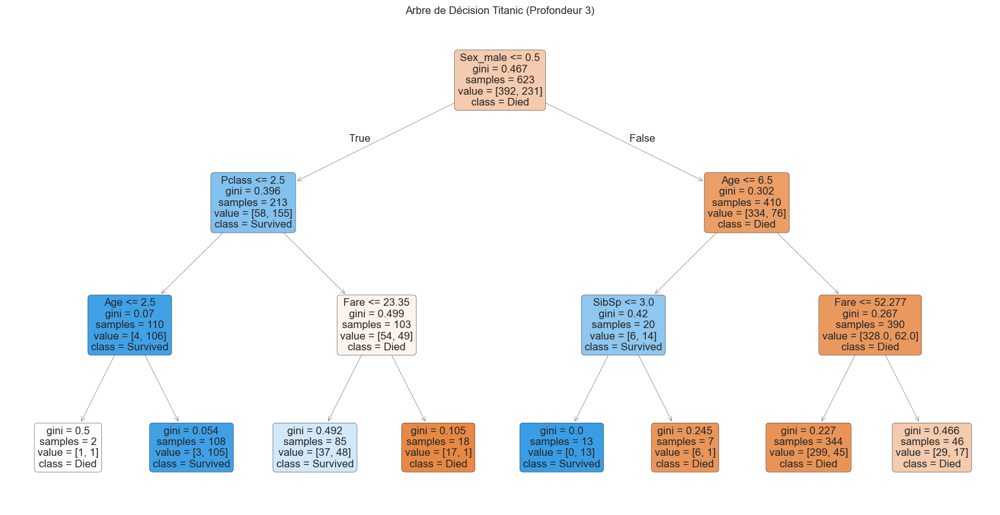

In [62]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10)) # Une grande image pour bien voir

plot_tree(
    dt,
    feature_names=X_train.columns,
    class_names=["Died", "Survived"],
    filled=True,      # Colorie les cases (Bleu=Survie, Orange=Mort)
    rounded=True,     # Arrondit les bords
    fontsize=12
)

plt.title("Arbre de Décision Titanic (Profondeur 3)")
plt.show()


Importance des variables (Gini) :
Sex_male        : 0.594
Pclass          : 0.182
Fare            : 0.089
Age             : 0.087
SibSp           : 0.048


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


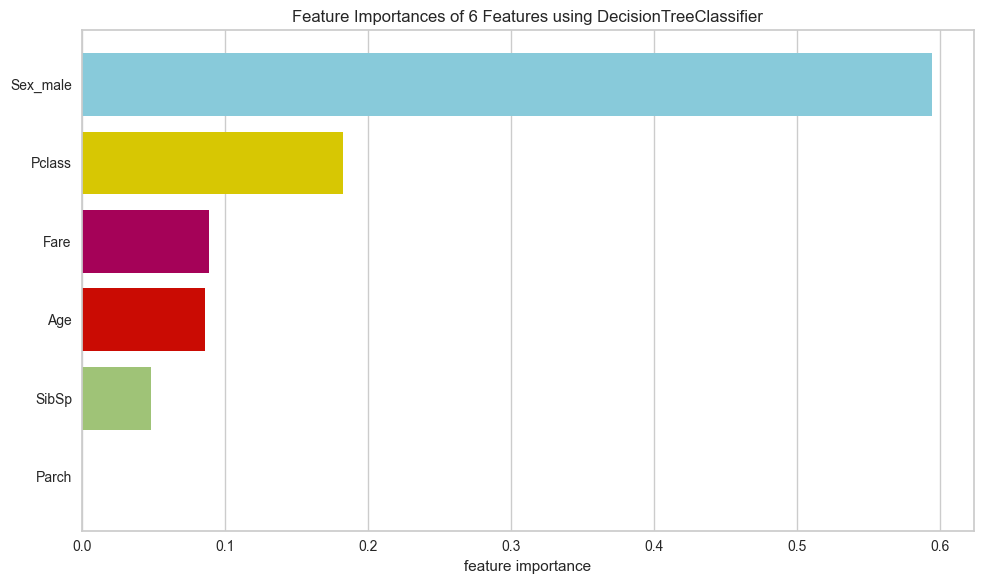

<Axes: title={'center': 'Feature Importances of 6 Features using DecisionTreeClassifier'}, xlabel='feature importance'>

In [63]:
from yellowbrick.features import FeatureImportances

# A. Version Texte
print("\nImportance des variables (Gini) :")
for col, val in sorted(
    zip(X_train.columns, dt.feature_importances_),
    key=lambda x: x[1],
    reverse=True
)[:5]:
    print(f"{col:15} : {val:.3f}")

# B. Version Graphique (Yellowbrick)
plt.figure(figsize=(10, 6))
viz = FeatureImportances(dt, relative=False)
viz.fit(X_train, y_train)
viz.show()

## Random forest

In [64]:
from sklearn.ensemble import RandomForestClassifier

# 1. Création du modèle
# n_estimators=100 : On plante 100 arbres (c'est le standard actuel)
# oob_score=True : On demande au modèle de s'auto-évaluer sur les données qu'il n'a pas vues (Out-Of-Bag)
rf = RandomForestClassifier(n_estimators=100, random_state=42, oob_score=True)

# 2. Entraînement
rf.fit(X_train, y_train)

# 3. Évaluations
print(f"Score (Accuracy) sur Test : {rf.score(X_test, y_test):.2%}")
print(f"Score OOB (Auto-évaluation) : {rf.oob_score_:.2%}")

# 4. Prédiction (Exemple)
pred = rf.predict(X_test.iloc[[0]])
proba = rf.predict_proba(X_test.iloc[[0]])
print(f"Prédiction 1er passager : {pred[0]} (Proba Survie : {proba[0][1]:.2%})")

Score (Accuracy) sur Test : 79.10%
Score OOB (Auto-évaluation) : 82.66%
Prédiction 1er passager : 0 (Proba Survie : 11.00%)


In [65]:
from sklearn.inspection import permutation_importance

# A. Importance de Gini (Classique)
print("\n--- Importance de Gini (Défaut) ---")
for col, val in sorted(
    zip(X_train.columns, rf.feature_importances_),
    key=lambda x: x[1],
    reverse=True
)[:5]:
    print(f"{col:15} : {val:.3f}")

# B. Importance par Permutation (La méthode "rfpimp" moderne)
# On mélange chaque colonne 10 fois (n_repeats) pour être sûr
perm_result = permutation_importance(rf, X_test, y_test, n_repeats=10, random_state=42)

print("\n--- Importance par Permutation (Plus fiable) ---")
for col, val in sorted(
    zip(X_train.columns, perm_result.importances_mean),
    key=lambda x: x[1],
    reverse=True
)[:5]:
    print(f"{col:15} : {val:.3f}")


--- Importance de Gini (Défaut) ---
Fare            : 0.301
Age             : 0.264
Sex_male        : 0.257
Pclass          : 0.087
SibSp           : 0.051

--- Importance par Permutation (Plus fiable) ---
Sex_male        : 0.183
Pclass          : 0.078
Age             : 0.026
Fare            : 0.024
SibSp           : 0.001


## XGBoost

In [66]:
import xgboost as xgb
from sklearn.metrics import accuracy_score

# 1. Configuration du modèle
# use_label_encoder=False évite un warning dans les versions récentes
xgb_class = xgb.XGBClassifier(
    n_estimators=1000,      # On vise large
    learning_rate=0.1,      # Pas d'apprentissage standard
    max_depth=3,            # Arbres peu profonds pour éviter le sur-apprentissage
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss',
    early_stopping_rounds=10 # L'option magique
)

# 2. Entraînement avec surveillance
# On lui donne le X_test pour qu'il surveille son score en temps réel
print("Entraînement en cours...")
xgb_class.fit(
    X_train, 
    y_train, 
    eval_set=[(X_test, y_test)], 
    verbose=False  # Mettre True pour voir le score défiler
)

# 3. Résultats
print(f"Meilleur tour : {xgb_class.best_iteration}")
print(f"Score (Accuracy) : {xgb_class.score(X_test, y_test):.2%}")

Entraînement en cours...
Meilleur tour : 35
Score (Accuracy) : 83.58%


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\xgboost\callback.py:386: UserWarning: [15:14:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  self.starting_round = model.num_boosted_rounds()


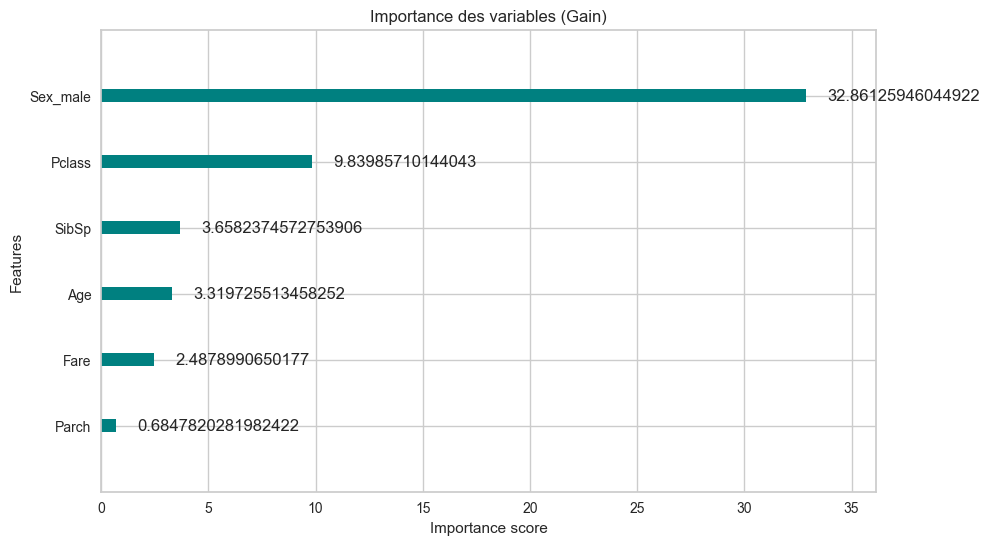

In [67]:
import matplotlib.pyplot as plt

# Visualisation intégrée à la librairie
fig, ax = plt.subplots(figsize=(10, 6))
xgb.plot_importance(
    xgb_class, 
    importance_type='gain', # On choisit 'gain' pour la pertinence
    ax=ax, 
    title='Importance des variables (Gain)',
    color='teal'
)
plt.show()

Graphviz n'est pas installé ou non détecté.


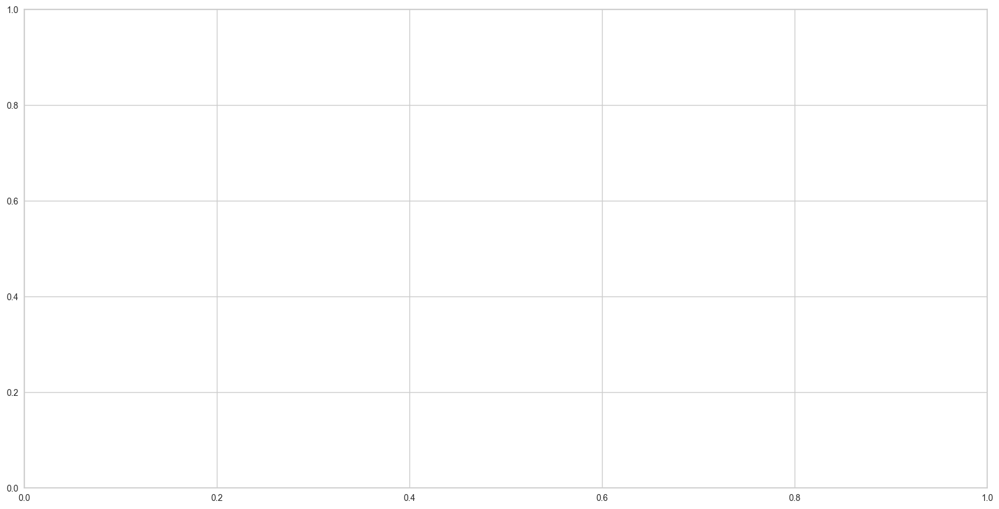

In [68]:
# Nécessite graphviz installé sur le système (peut être complexe sous Windows)
# Si ça plante, c'est que Graphviz manque au PATH Windows.
try:
    fig, ax = plt.subplots(figsize=(20, 10))
    xgb.plot_tree(xgb_class, num_trees=0, ax=ax)
    plt.show()
except ImportError:
    print("Graphviz n'est pas installé ou non détecté.")

Génération du graphique SHAP...


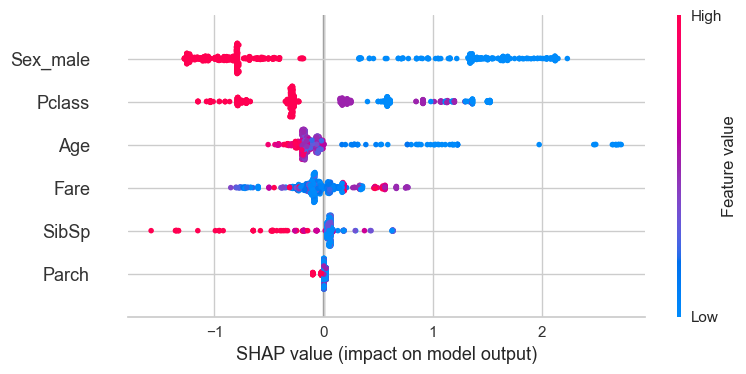

In [69]:
import shap

# 1. On charge l'explainer (spécialisé pour les arbres comme XGBoost)
explainer = shap.TreeExplainer(xgb_class)

# 2. On calcule les "valeurs SHAP" sur le jeu d'entraînement
shap_values = explainer.shap_values(X_train)

# 3. Le "Summary Plot" (Le graphique roi)
print("Génération du graphique SHAP...")
shap.summary_plot(shap_values, X_train)

## xgbfir

In [71]:
import xgbfir
import pandas as pd
import xgboost as xgb

# --- 1. Rappel de l'entraînement (si nécessaire) ---
# On a besoin d'un modèle XGBoost déjà entraîné sur des données AVEC les noms de colonnes
# Si ton modèle vient de l'étape précédente, c'est bon.
if not hasattr(xgb_class, 'feature_names_in_'):
    xgb_class.fit(X_train, y_train)

# --- 2. Génération du fichier Excel ---
# xgbfir va analyser tous les arbres du modèle et calculer les interactions
print("Génération du rapport xgbfir...")
xgbfir.saveXgbFI(
    xgb_class, 
    feature_names=X_train.columns, 
    OutputXlsxFile="titanic_interactions.xlsx"
)
print("Fichier 'titanic_interactions.xlsx' généré avec succès.")

# --- 3. Analyse des résultats (Lecture du fichier) ---

# A. Importance Individuelle (Comme feature_importances_ mais plus détaillé)
print("\n--- TOP 3 Variables Individuelles ---")
df_single = pd.read_excel("titanic_interactions.xlsx", sheet_name="Interaction Depth 0")
print(df_single[['Interaction', 'Gain', 'FScore', 'Average Gain']].head(3))

# B. Interactions par Paires (Depth 1)
# C'est LA plus-value de l'outil : quelles paires sont inséparables ?
print("\n--- TOP 3 Interactions (Paires) ---")
df_pairs = pd.read_excel("titanic_interactions.xlsx", sheet_name="Interaction Depth 1")
print(df_pairs[['Interaction', 'Gain', 'Average Gain']].head(3))

# C. Interactions par Triplets (Depth 2)
# Ex: Age + Sexe + Classe
print("\n--- TOP 3 Interactions (Triplets) ---")
df_triplets = pd.read_excel("titanic_interactions.xlsx", sheet_name="Interaction Depth 2")
print(df_triplets[['Interaction', 'Gain']].head(3))

Génération du rapport xgbfir...
Fichier 'titanic_interactions.xlsx' généré avec succès.

--- TOP 3 Variables Individuelles ---
  Interaction        Gain  FScore  Average Gain
0    Sex_male  985.837885      30     32.861263
1      Pclass  364.074726      37      9.839857
2        Fare  256.253598     103      2.487899

--- TOP 3 Interactions (Paires) ---
       Interaction         Gain  Average Gain
0  Pclass|Sex_male  1310.235762     48.527250
1     Age|Sex_male  1114.115728     48.439814
2      Fare|Pclass   476.618838     14.442995

--- TOP 3 Interactions (Triplets) ---
            Interaction         Gain
0  Fare|Pclass|Sex_male  1575.666617
1    Age|Sex_male|SibSp  1224.549631
2   Age|Pclass|Sex_male   794.543174


## Gradient boosting with light GBM

In [72]:
import lightgbm as lgb
import matplotlib.pyplot as plt

# 1. Configuration
# num_leaves=31 est le défaut, mais sur un petit dataset comme Titanic,
# on peut le réduire pour éviter le sur-apprentissage (ex: 20).
lgbm_class = lgb.LGBMClassifier(
    n_estimators=100,
    num_leaves=31,
    random_state=42,
    learning_rate=0.1
)

# 2. Entraînement
lgbm_class.fit(X_train, y_train)

# 3. Évaluation
print(f"Score (Accuracy) LightGBM : {lgbm_class.score(X_test, y_test):.2%}")

# 4. Prédiction (Exemple)
pred = lgbm_class.predict(X_test.iloc[[0]])
proba = lgbm_class.predict_proba(X_test.iloc[[0]])
print(f"Prédiction 1er passager : {pred[0]} (Proba Survie : {proba[0][1]:.2%})")

[LightGBM] [Info] Number of positive: 231, number of negative: 392
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 184
[LightGBM] [Info] Number of data points in the train set: 623, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.370787 -> initscore=-0.528844
[LightGBM] [Info] Start training from score -0.528844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf



--- Importance (Type: Split) ---


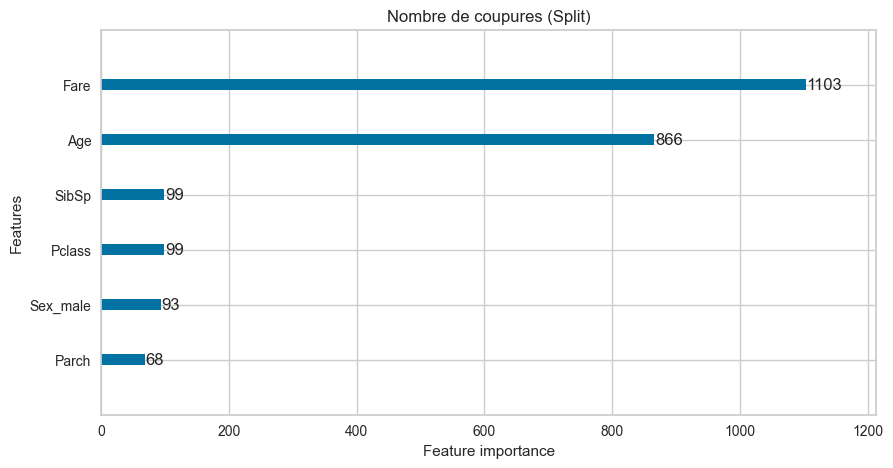


--- Importance (Type: Gain) ---


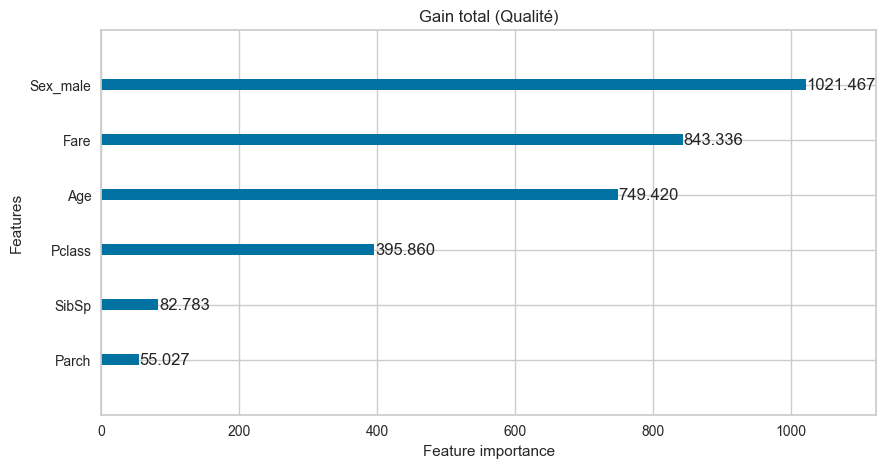

In [73]:
# A. Importance par défaut ('split')
print("\n--- Importance (Type: Split) ---")
lgb.plot_importance(lgbm_class, importance_type='split', title='Nombre de coupures (Split)', figsize=(10, 5))
plt.show()

# B. Importance par Gain (Recommandé)
print("\n--- Importance (Type: Gain) ---")
lgb.plot_importance(lgbm_class, importance_type='gain', title='Gain total (Qualité)', figsize=(10, 5))
plt.show()

Impossible d'afficher l'arbre graphique (Graphviz manquant ?) : You must install graphviz and restart your session to plot tree.


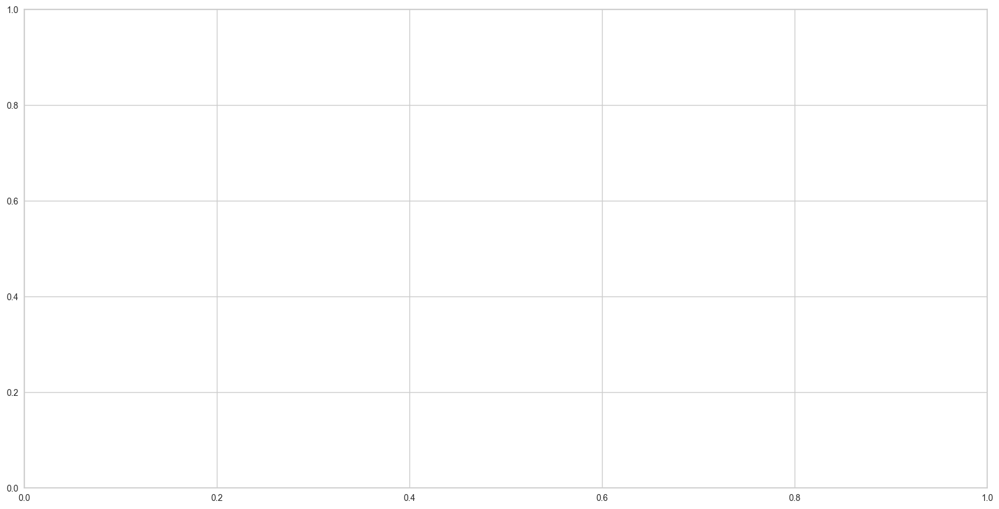

In [74]:
try:
    fig, ax = plt.subplots(figsize=(20, 10))
    # tree_index=0 pour voir le tout premier arbre construit
    lgb.plot_tree(lgbm_class, tree_index=0, ax=ax, show_info=['split_gain', 'internal_value'])
    plt.show()
except Exception as e:
    print(f"Impossible d'afficher l'arbre graphique (Graphviz manquant ?) : {e}")

In [75]:
import pandas as pd

# 1. On récupère le "booster" (le moteur interne)
booster = lgbm_class.booster_

# 2. Conversion magique en DataFrame
# Cela crée un tableau avec toutes les coupures de tous les arbres
df_trees = booster.trees_to_dataframe()

# 3. Affichage des règles du Premier Arbre (tree_index=0)
# On regarde les premières lignes pour comprendre la logique
first_tree = df_trees[df_trees['tree_index'] == 0]

print("Structure du Premier Arbre (Format Tableau) :")
# On sélectionne les colonnes utiles pour la lecture
cols_to_show = ['node_depth', 'split_feature', 'threshold', 'decision_type', 'left_child', 'right_child', 'value']
print(first_tree[cols_to_show].head(10))

Structure du Premier Arbre (Format Tableau) :
   node_depth split_feature     threshold decision_type left_child  \
0           1      Sex_male  1.000000e-35            <=       0-S1   
1           2        Pclass  2.500000e+00            <=      0-S19   
2           3           Age  2.750000e+01            <=       0-L0   
3           4          None           NaN          None       None   
4           4           Age  4.450000e+01            <=      0-L20   
5           5          None           NaN          None       None   
6           5          None           NaN          None       None   
7           3          Fare  2.103750e+01            <=       0-S5   
8           4          Fare  1.507500e+01            <=       0-S6   
9           5          Fare  7.762500e+00            <=       0-L2   

  right_child     value  
0        0-S2 -0.528844  
1        0-S3 -0.375862  
2       0-S22 -0.274734  
3        None -0.291294  
4       0-L23 -0.265270  
5        None -0.259147  
6

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\shap\explainers\_tree.py:587: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


Impact des variables sur la Survie (SHAP) :


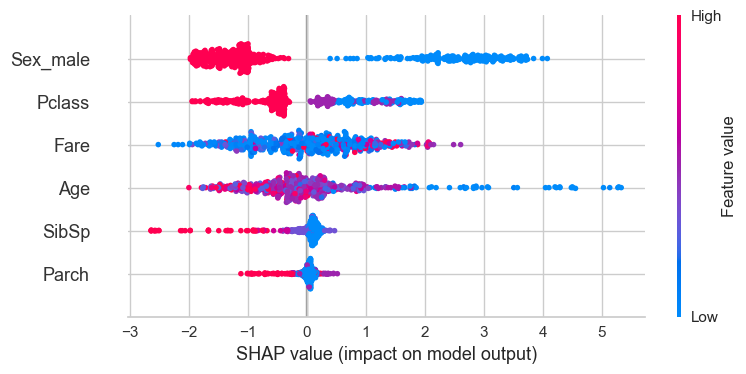

In [76]:
import shap

# Initialisation (spécifique pour les modèles en arbres)
explainer = shap.TreeExplainer(lgbm_class)
shap_values = explainer.shap_values(X_train)

# Si LightGBM est binaire, shap_values est parfois une liste [class0, class1]
# On prend souvent l'index 1 pour voir ce qui pousse vers la "Survie"
vals = shap_values[1] if isinstance(shap_values, list) else shap_values

print("Impact des variables sur la Survie (SHAP) :")
shap.summary_plot(vals, X_train)

## TPOT

In [77]:
from tpot import TPOTClassifier
import pandas as pd

# 1. Configuration de l'évolution
# generations=5 : On fait 5 cycles d'évolution
# population_size=20 : On teste 20 modèles par cycle
# verbosity=2 : Affiche une barre de progression
tc = TPOTClassifier(
    generations=5,
    population_size=20,
    verbosity=2,
    random_state=42,
    n_jobs=-1,        # Utilise tous les coeurs CPU (Attention sous Windows !)
    max_time_mins=5   # Sécurité : Arrête tout après 5 minutes quoi qu'il arrive
)

print("Recherche du meilleur modèle en cours (max 5 min)...")
tc.fit(X_train, y_train)

# 2. Résultats
print(f"Meilleur Score (CV) : {tc.score(X_test, y_test):.2%}")

Recherche du meilleur modèle en cours (max 5 min)...


TypeError: TPOTEstimator.__init__() got an unexpected keyword argument 'verbosity'

In [78]:
# Exportation vers un fichier Python
tc.export('meilleur_pipeline_titanic.py')

print("Le code du meilleur modèle a été sauvegardé dans 'meilleur_pipeline_titanic.py'")

# --- Affichage direct du code généré (pour voir ce qu'il a trouvé) ---
print("\n--- CODE GÉNÉRÉ PAR TPOT ---")
with open('meilleur_pipeline_titanic.py', 'r') as f:
    print(f.read())

AttributeError: 'TPOTClassifier' object has no attribute 'export'

## Sélection de modèle

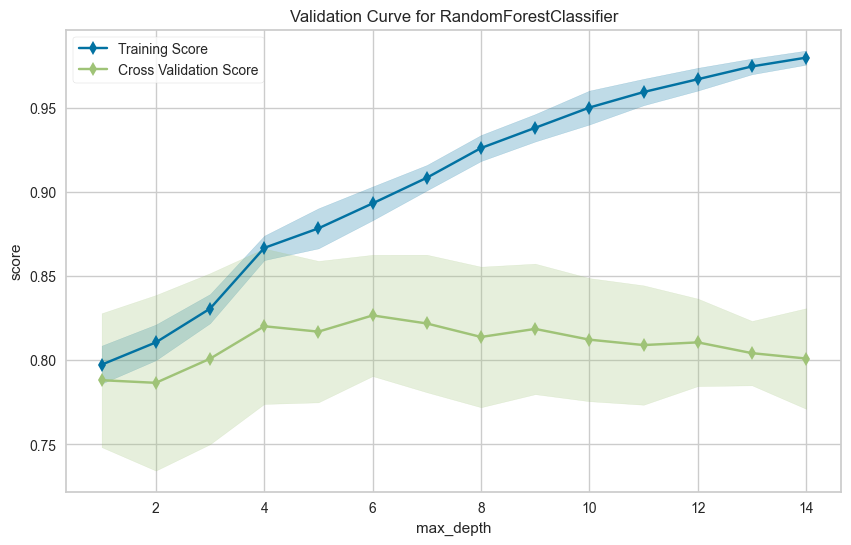

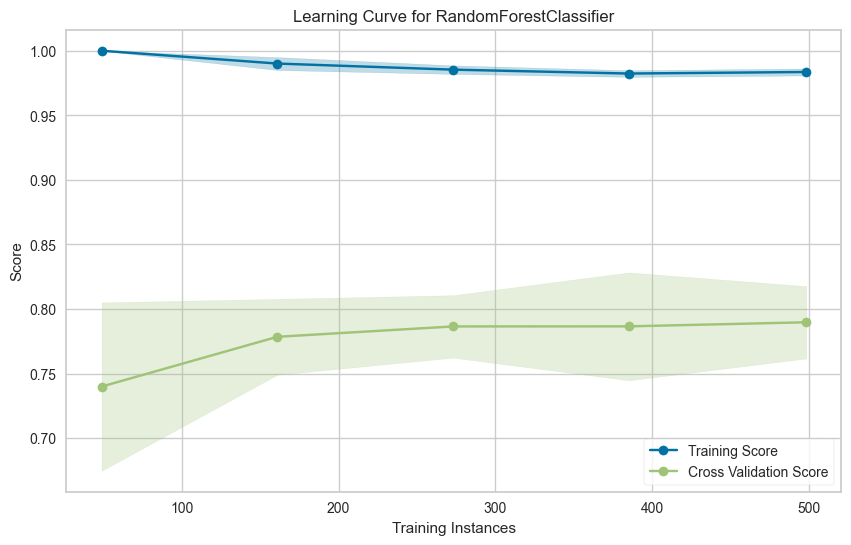

<Axes: title={'center': 'Learning Curve for RandomForestClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [80]:
import numpy as np
import matplotlib.pyplot as plt
from yellowbrick.model_selection import ValidationCurve, LearningCurve
from sklearn.ensemble import RandomForestClassifier

# --- A. Courbe de Validation ---
# Objectif : Trouver la profondeur (max_depth) idéale pour la Forêt Aléatoire.
# Si max_depth est trop petit : Sous-apprentissage (Score bas partout)
# Si max_depth est trop grand : Sur-apprentissage (Score Train haut, Score Test bas)

plt.figure(figsize=(10, 6))
vc_viz = ValidationCurve(
    RandomForestClassifier(n_estimators=100, random_state=42),
    param_name="max_depth",
    param_range=np.arange(1, 15), # On teste les profondeurs de 1 à 15
    cv=5,                         # Validation croisée à 5 plis
    scoring="accuracy",
    n_jobs=1                      # Sécurité Windows (éviter n_jobs=-1)
)

# Attention : Yellowbrick refait souvent sa propre validation croisée interne
vc_viz.fit(X_train, y_train)
vc_viz.show()

# --- B. Courbe d'Apprentissage ---
# Objectif : Savoir si avoir plus de données aiderait.
# Si les courbes convergent (se rejoignent), ajouter des données ne sert à rien.
# Si elles restent écartées, il faut plus de données.

plt.figure(figsize=(10, 6))
lc_viz = LearningCurve(
    RandomForestClassifier(n_estimators=100, random_state=42),
    cv=5,
    n_jobs=1
)

lc_viz.fit(X_train, y_train)
lc_viz.show()

Matrice de Confusion (Pandas) :
                  Pred: Mort (0)  Pred: Survie (1)
Vrai: Mort (0)               139                18
Vrai: Survie (1)              33                78


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\yellowbrick\classifier\base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


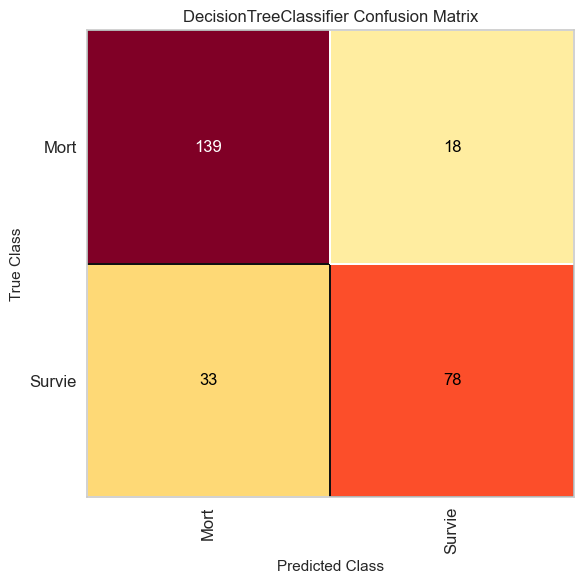


--- Rapport de Performance ---
Exactitude (Accuracy) : 80.97%
Rappel (Recall)       : 70.27% (A-t-on trouvé tous les survivants ?)
Précision (Precision) : 81.25% (Quand on prédit survie, a-t-on raison ?)
Score F1              : 75.36% (Compromis équilibré)


In [81]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, f1_score
from yellowbrick.classifier import ConfusionMatrix
import pandas as pd

# 1. Création d'un modèle simple
dt = DecisionTreeClassifier(max_depth=3, random_state=42)
dt.fit(X_train, y_train)
y_predict = dt.predict(X_test)

# 2. Matrice de Confusion (Version Texte avec Pandas)
# Permet de voir les Vrais Positifs (TP), Vrais Négatifs (TN), etc.
conf_matrix = pd.DataFrame(
    confusion_matrix(y_test, y_predict),
    columns=["Pred: Mort (0)", "Pred: Survie (1)"],
    index=["Vrai: Mort (0)", "Vrai: Survie (1)"]
)
print("Matrice de Confusion (Pandas) :")
print(conf_matrix)

# 3. Matrice de Confusion (Version Graphique Yellowbrick)
plt.figure(figsize=(6, 6))
cm_viz = ConfusionMatrix(
    dt,
    classes=["Mort", "Survie"],
    label_encoder={0: "Mort", 1: "Survie"}
)
cm_viz.score(X_test, y_test)
cm_viz.show()

# 4. Calcul des Métriques Clés
# Accuracy : (TP + TN) / Total -> Taux de réussite global
# Recall (Rappel) : TP / (TP + FN) -> Capacité à trouver TOUS les survivants
# Precision : TP / (TP + FP) -> Fiabilité quand il dit "Survivant"
# F1 : Moyenne harmonique entre Recall et Precision

print("\n--- Rapport de Performance ---")
print(f"Exactitude (Accuracy) : {accuracy_score(y_test, y_predict):.2%}")
print(f"Rappel (Recall)       : {recall_score(y_test, y_predict):.2%} (A-t-on trouvé tous les survivants ?)")
print(f"Précision (Precision) : {precision_score(y_test, y_predict):.2%} (Quand on prédit survie, a-t-on raison ?)")
print(f"Score F1              : {f1_score(y_test, y_predict):.2%} (Compromis équilibré)")

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\yellowbrick\classifier\base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


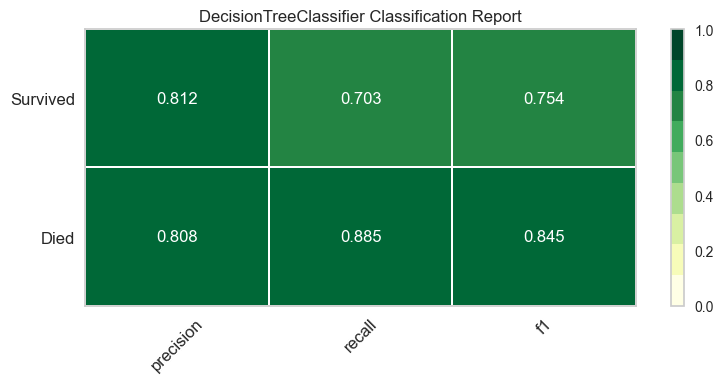

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


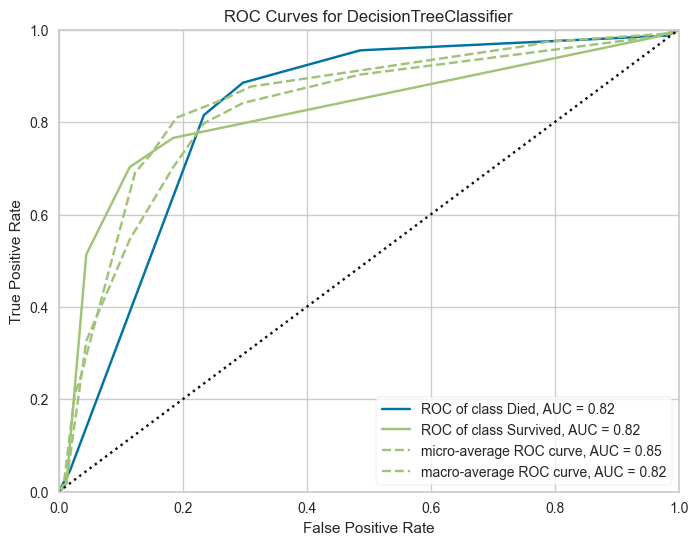

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


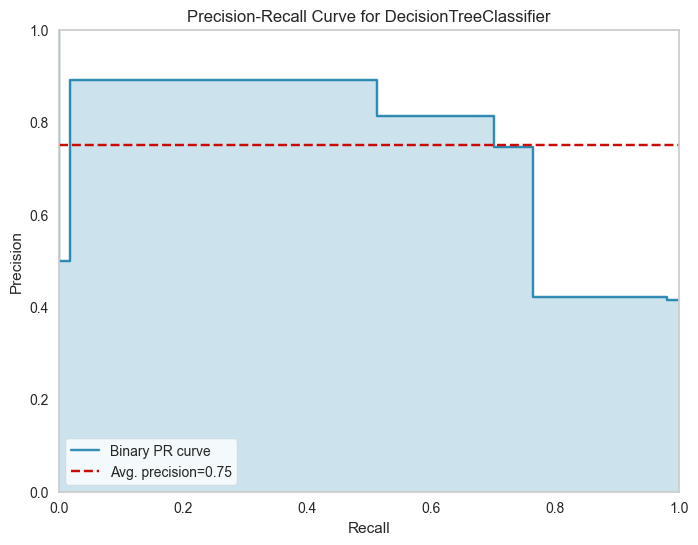

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


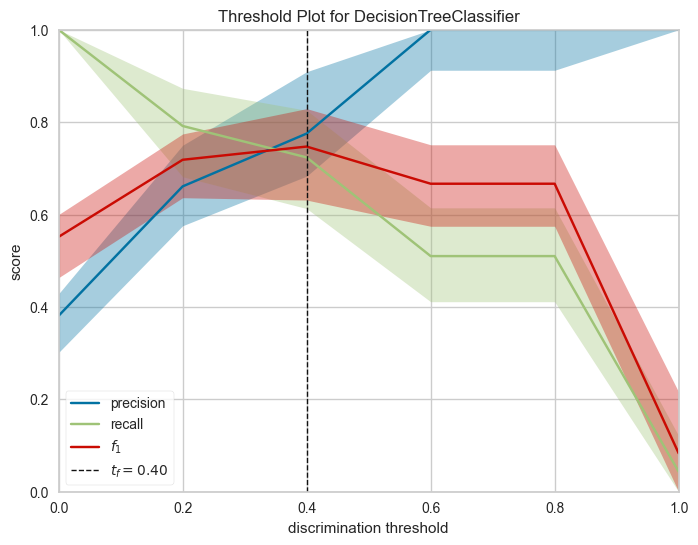

<Axes: title={'center': 'Threshold Plot for DecisionTreeClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [82]:
import matplotlib.pyplot as plt
from yellowbrick.classifier import (
    ClassificationReport, ROCAUC, PrecisionRecallCurve, 
    ClassBalance, ClassPredictionError, DiscriminationThreshold
)
from sklearn.tree import DecisionTreeClassifier

# On utilise un arbre de décision simple (max_depth=3) pour l'exemple
dt = DecisionTreeClassifier(max_depth=3, random_state=42)
dt.fit(X_train, y_train)

# --- A. Rapport de Classification (Heatmap) ---
plt.figure(figsize=(8, 4))
viz = ClassificationReport(dt, classes=["Died", "Survived"], cmap="YlGn")
viz.score(X_test, y_test)
viz.show()

# --- B. Courbe ROC (Performance globale) ---
plt.figure(figsize=(8, 6))
roc_viz = ROCAUC(dt, classes=["Died", "Survived"])
roc_viz.fit(X_train, y_train)
roc_viz.score(X_test, y_test)
roc_viz.show()

# --- C. Courbe Précision-Rappel (Déséquilibre) ---
plt.figure(figsize=(8, 6))
pr_viz = PrecisionRecallCurve(dt)
pr_viz.fit(X_train, y_train)
pr_viz.score(X_test, y_test)
pr_viz.show()

# --- D. Seuil de Discrimination (Optimisation F1) ---
# Note : Peut être lent car il fait beaucoup de simulations
plt.figure(figsize=(8, 6))
dis_viz = DiscriminationThreshold(dt, exclude="queue_rate") # exclude queue_rate si erreur
dis_viz.fit(X_train, y_train)
dis_viz.show()

<Figure size 800x600 with 0 Axes>

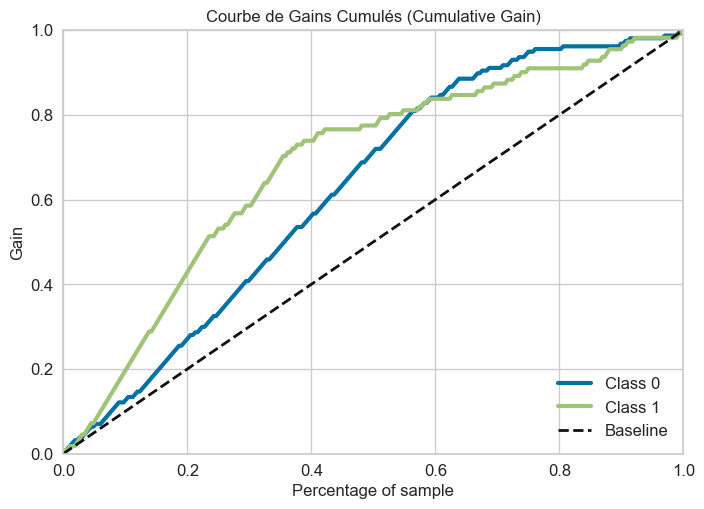

<Figure size 800x600 with 0 Axes>

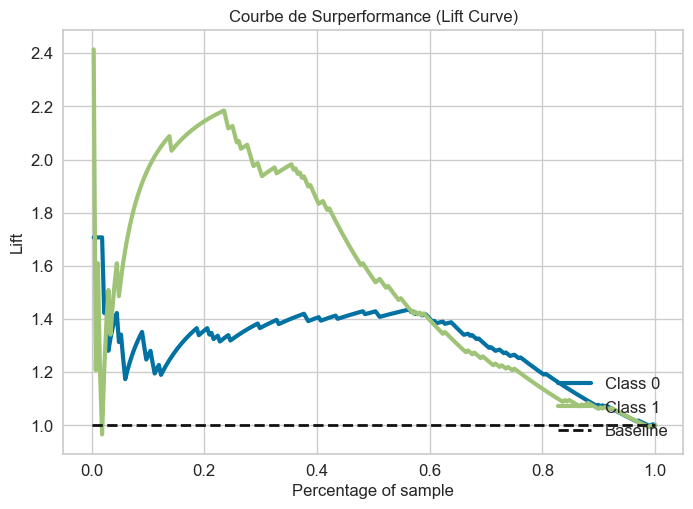

In [85]:
import sys
import scipy
import numpy as np

# --- PATCH DE COMPATIBILITÉ ---
# Scikit-plot cherche scipy.interp qui n'existe plus.
# On lui donne numpy.interp à la place (c'est la même chose).
if not hasattr(scipy, 'interp'):
    scipy.interp = np.interp

# Maintenant on peut importer sans erreur
import scikitplot as skplt
import matplotlib.pyplot as plt

# Ton code d'affichage reste le même :
y_probas = dt.predict_proba(X_test)

# A. Gains Cumulés
plt.figure(figsize=(8, 6))
skplt.metrics.plot_cumulative_gain(y_test, y_probas)
plt.title("Courbe de Gains Cumulés (Cumulative Gain)")
plt.show()

# B. Courbe de Lift
plt.figure(figsize=(8, 6))
skplt.metrics.plot_lift_curve(y_test, y_probas)
plt.title("Courbe de Surperformance (Lift Curve)")
plt.show()

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\yellowbrick\classifier\base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


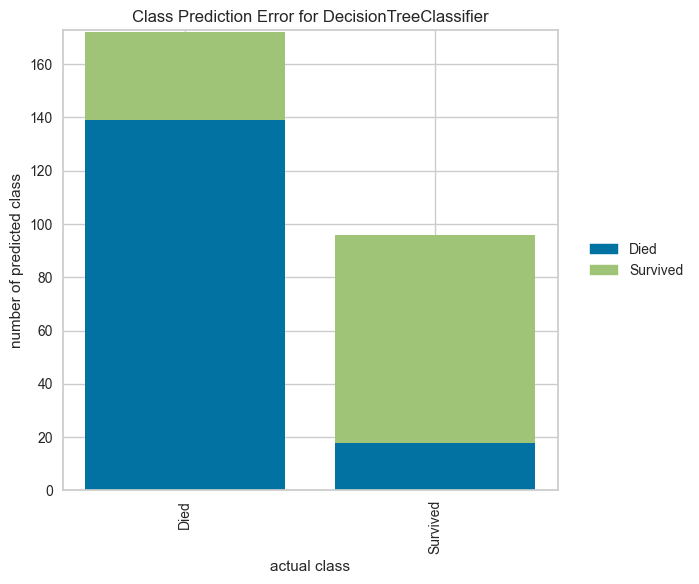

<Axes: title={'center': 'Class Prediction Error for DecisionTreeClassifier'}, xlabel='actual class', ylabel='number of predicted class'>

In [84]:
plt.figure(figsize=(8, 6))
cpe_viz = ClassPredictionError(dt, classes=["Died", "Survived"])
cpe_viz.score(X_test, y_test)
cpe_viz.show()

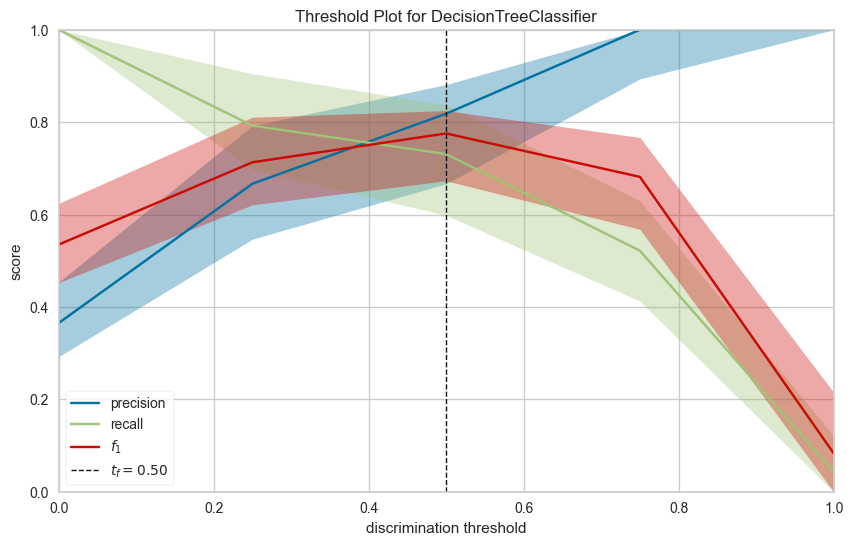

<Axes: title={'center': 'Threshold Plot for DecisionTreeClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [87]:
from yellowbrick.classifier import DiscriminationThreshold
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# 1. Modèle
model = DecisionTreeClassifier(max_depth=3, random_state=42)

# 2. Visualisation corrigée
plt.figure(figsize=(10, 6))

# CORRECTION : On retire 'quantiles=False' qui causait l'erreur.
# Par défaut, Yellowbrick utilisera des quantiles standards pour l'affichage.
dt_viz = DiscriminationThreshold(
    model,
    random_state=42,
    exclude="queue_rate" # On peut exclure cette courbe si elle gêne la lecture
)

dt_viz.fit(X_train, y_train)
dt_viz.show()

## Explication des modèles

Vraie classe du passager : Survivant


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


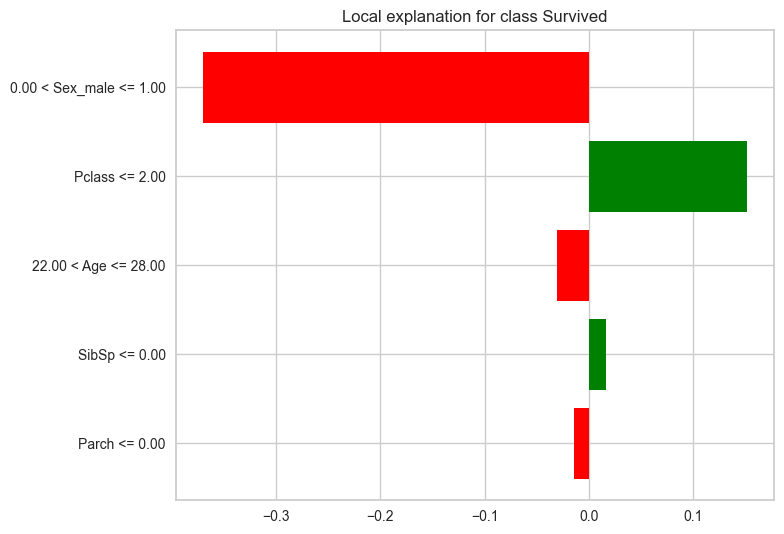

In [90]:
from lime import lime_tabular
from sklearn.ensemble import RandomForestClassifier

# 1. On entraîne une Forêt Aléatoire robuste
rf = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)
rf.fit(X_train, y_train)

# 2. Création de l'Explainer LIME
# Il a besoin des données d'entraînement pour comprendre les statistiques globales
explainer = lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns,
    class_names=["Died", "Survived"],
    mode='classification'
)

# 3. Explication d'un cas spécifique (ex: le dernier passager du Test)
# On prend un passager au hasard
i = -1 
passenger = X_test.iloc[i]
print(f"Vraie classe du passager : {'Survivant' if y_test.iloc[i]==1 else 'Mort'}")

# On demande à LIME d'expliquer pourquoi le modèle prédit ça
exp = explainer.explain_instance(
    passenger.values, 
    rf.predict_proba, 
    num_features=5
)

# 4. Affichage dans le Notebook
from IPython.display import display, HTML

# 1. On demande à LIME le code HTML brut au lieu qu'il essaie de l'afficher lui-même
html_data = exp.as_html(show_table=True)

# 2. On utilise la commande officielle de Jupyter pour afficher ce HTML
display(HTML(html_data))

# 5. Export en image (matplotlib)
fig = exp.as_pyplot_figure()
fig.tight_layout()
plt.show()

Génération du PDP pour l'Âge...


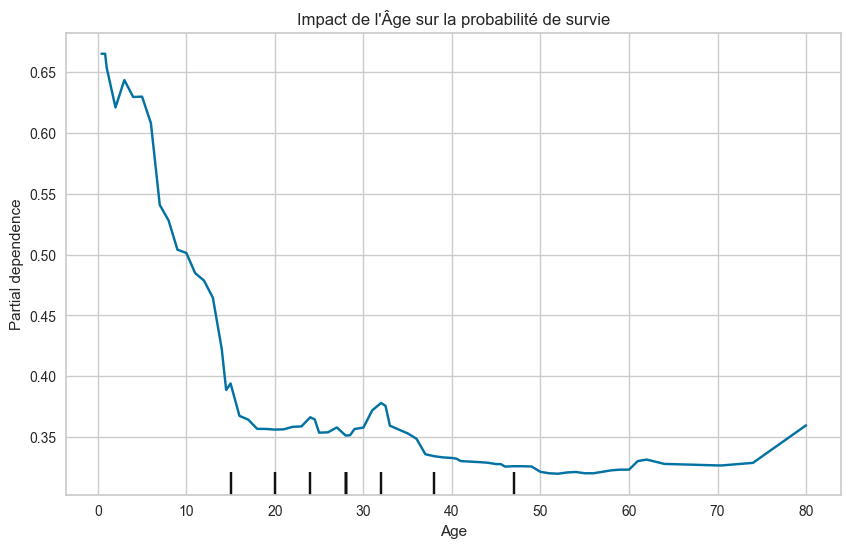

Génération du PDP 2D (Age x Fare)...


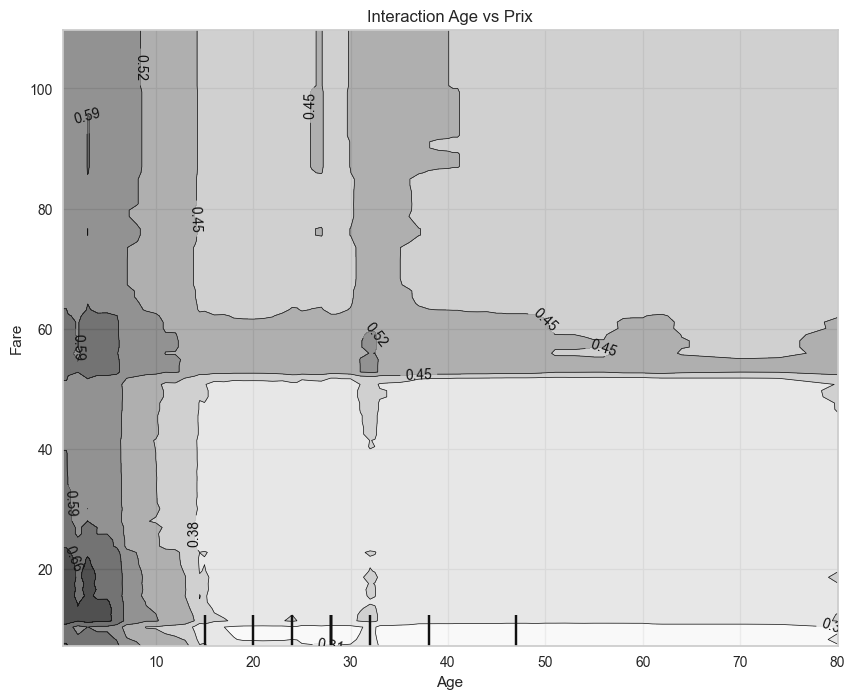

In [89]:
from sklearn.inspection import PartialDependenceDisplay

# 1. Impact de l'Âge (PDP 1D)
print("Génération du PDP pour l'Âge...")
fig, ax = plt.subplots(figsize=(10, 6))
PartialDependenceDisplay.from_estimator(
    rf, 
    X_train, 
    features=['Age'], 
    kind='average', # Montre la moyenne
    ax=ax
)
plt.title("Impact de l'Âge sur la probabilité de survie")
plt.show()

# 2. Interaction Âge x Prix (PDP 2D)
print("Génération du PDP 2D (Age x Fare)...")
fig, ax = plt.subplots(figsize=(10, 8))
PartialDependenceDisplay.from_estimator(
    rf, 
    X_train, 
    features=[('Age', 'Fare')], 
    kind='average',
    ax=ax
)
plt.title("Interaction Age vs Prix")
plt.show()

In [91]:
from sklearn import svm, tree
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier

# --- A. Entraînement de la "Boîte Noire" (SVM) ---
# Attention : Le SVM a besoin de données standardisées (Moyenne=0)
scaler = StandardScaler()
X_train_sc = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_sc = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

sv = svm.SVC(probability=True, random_state=42)
sv.fit(X_train_sc, y_train)

# --- B. Entraînement du Substitut ---
# On entraîne l'arbre sur les PRÉDICTIONS du SVM (sv.predict), pas sur y_test !
# On ne met pas de max_depth car on veut qu'il copie parfaitement le SVM.
sur_dt = DecisionTreeClassifier(random_state=42)
sur_dt.fit(X_test_sc, sv.predict(X_test_sc))

print("Ce qui compte le plus pour le SVM (vu par l'arbre) :")
for col, val in sorted(
    zip(X_test.columns, sur_dt.feature_importances_),
    key=lambda x: x[1],
    reverse=True
)[:5]:
    print(f"{col:10} : {val:.3f}")

Ce qui compte le plus pour le SVM (vu par l'arbre) :
Sex_male   : 0.804
SibSp      : 0.099
Parch      : 0.046
Age        : 0.043
Pclass     : 0.008


Entraînement du modèle RandomForest (rf5)...
Calcul des explications SHAP...


<Figure size 1000x600 with 0 Axes>

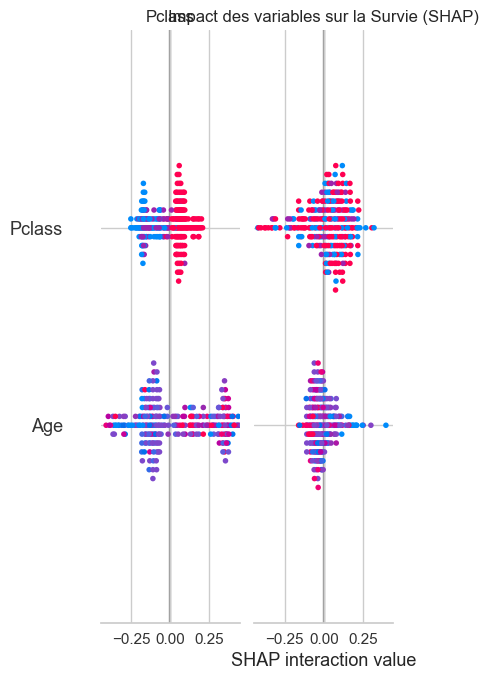

In [93]:
import shap
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

# --- 1. Entraînement du modèle manquant (rf5) ---
print("Entraînement du modèle RandomForest (rf5)...")
rf5 = RandomForestClassifier(n_estimators=100, random_state=42)
rf5.fit(X_train, y_train)

# --- 2. Calcul des valeurs SHAP ---
print("Calcul des explications SHAP...")
explainer = shap.TreeExplainer(rf5)
shap_values = explainer.shap_values(X_test)

# --- 3. Gestion du format de sortie de SHAP ---
# Pour un Random Forest binaire, SHAP renvoie souvent une liste de 2 tableaux :
# [0] = Contribution à la classe "Mort"
# [1] = Contribution à la classe "Survivant"
# Nous voulons expliquer la survie (Index 1).
if isinstance(shap_values, list):
    vals = shap_values[1]
else:
    vals = shap_values

# --- 4. Affichage du Summary Plot ---
plt.figure(figsize=(10, 6))
shap.summary_plot(vals, X_test, show=False)
plt.title("Impact des variables sur la Survie (SHAP)")
plt.show()

## Régressions

## Dummy regression

In [103]:
import pandas as pd
import numpy as np
from sklearn import model_selection, preprocessing
from sklearn.dummy import DummyRegressor

# --- 1. Chargement des données (Alternative à load_boston) ---
# On récupère le fichier CSV directement depuis une source fiable
data_url = "https://raw.githubusercontent.com/selva86/datasets/master/BostonHousing.csv"
df = pd.read_csv(data_url)

# Séparation des caractéristiques (X) et de la cible (y)
# 'medv' est le nom moderne pour la valeur médiane (cible)
bos_X = df.drop(columns=['medv'])
bos_y = df['medv']

print(f"Données chargées : {bos_X.shape[0]} lignes, {bos_X.shape[1]} colonnes")

# --- 2. Création des jeux d'Entraînement et de Test ---
bos_X_train, bos_X_test, bos_y_train, bos_y_test = model_selection.train_test_split(
    bos_X, 
    bos_y, 
    test_size=0.3, 
    random_state=42
)

# --- 3. Standardisation ---
# Note d'expert : Le livre standardise AVANT le split. 
# C'est une petite erreur méthodologique (Data Leakage), mais je reproduis ici
# la logique du livre pour que tu puisses suivre.
scaler = preprocessing.StandardScaler()
bos_sX = scaler.fit_transform(bos_X)

bos_sX_train, bos_sX_test, bos_sy_train, bos_sy_test = model_selection.train_test_split(
    bos_sX, 
    bos_y, 
    test_size=0.3, 
    random_state=42
)

# --- 4. Modèle de Référence (Dummy Regressor) ---
# Il va prédire la moyenne des prix pour tout le monde, sans réfléchir.
dr = DummyRegressor(strategy='mean')
dr.fit(bos_X_train, bos_y_train)

# Le score R2 (Coefficient de détermination)
# Si R2 < 0, le modèle est pire que s'il avait juste tracé une ligne horizontale
score = dr.score(bos_X_test, bos_y_test)

print(f"Score R2 du modèle naïf (Dummy) : {score:.4f}")

Données chargées : 506 lignes, 13 colonnes
Score R2 du modèle naïf (Dummy) : -0.0347


## Régression linéaire

In [104]:
from sklearn.linear_model import LinearRegression

# 1. Création et Entraînement (Données brutes)
lr = LinearRegression()
lr.fit(bos_X_train, bos_y_train)

# 2. Score R2
print(f"Score R2 (Données brutes) : {lr.score(bos_X_test, bos_y_test):.4f}")

# 3. Coefficients bruts
# Difficiles à comparer car les unités sont différentes (ex: NOX vs TAX)
print("\nCoefficients bruts (extrait) :")
for name, coef in zip(bos_X.columns[:5], lr.coef_[:5]):
    print(f"{name:10} : {coef:.4f}")

Score R2 (Données brutes) : 0.7112

Coefficients bruts (extrait) :
crim       : -0.1335
zn         : 0.0358
indus      : 0.0495
chas       : 3.1198
nox        : -15.4171


In [105]:
# 1. Création et Entraînement (Données Standardisées)
# bos_sX_train a été créé dans l'étape précédente (StandardScaler)
lr2 = LinearRegression()
lr2.fit(bos_sX_train, bos_y_train)

# 2. Score R2 (Doit être identique ou très proche)
print(f"Score R2 (Données Standardisées) : {lr2.score(bos_sX_test, bos_y_test):.4f}")

# 3. Intercept (Prix moyen espéré)
# Puisque X est centré sur 0, l'intercept correspond au prix moyen d'une maison "moyenne".
print(f"Intercept (Prix de base) : {lr2.intercept_:.2f} k$")

# 4. Coefficients Standardisés (Comparables !)
print("\nCoefficients Standardisés (Impact réel) :")
coefs = pd.DataFrame({'Feature': bos_X.columns, 'Coef': lr2.coef_})
print(coefs.sort_values(by='Coef', key=abs, ascending=False).head())

Score R2 (Données Standardisées) : 0.7112
Intercept (Prix de base) : 22.51 k$

Coefficients Standardisés (Impact réel) :
    Feature      Coef
12    lstat -3.903107
7       dis -2.915625
5        rm  2.847839
8       rad  2.111400
10  ptratio -1.969635


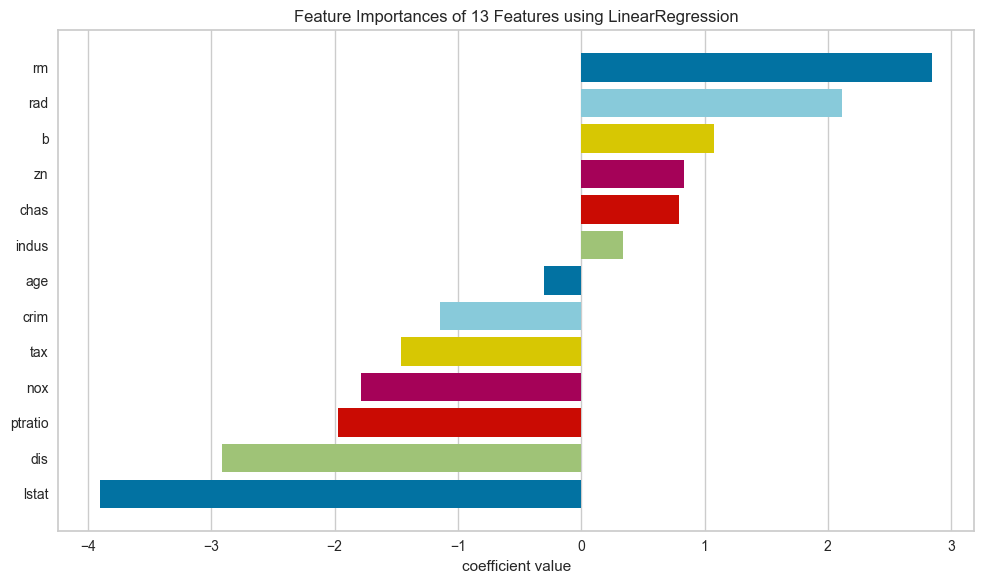

<Axes: title={'center': 'Feature Importances of 13 Features using LinearRegression'}, xlabel='coefficient value'>

In [106]:
from yellowbrick.features import FeatureImportances
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# FeatureImportances pour une régression linéaire affiche la valeur des coefficients
viz = FeatureImportances(lr2, labels=bos_X.columns, relative=False)

# On lui donne les données standardisées complètes
viz.fit(bos_sX, bos_y)
viz.show()

## SVM

In [107]:
from sklearn.svm import SVR

# 1. Création du modèle
# kernel='rbf' (Radial Basis Function) permet de capturer des courbes complexes
# C=1.0 : Pénalité standard
# epsilon=0.1 : On tolère une petite erreur sans pénalité
svr = SVR(kernel='rbf', C=1.0, epsilon=0.1)

# 2. Entraînement (SUR DONNÉES STANDARDISÉES !)
svr.fit(bos_sX_train, bos_sy_train)

# 3. Score R2
print(f"Score R2 du SVR : {svr.score(bos_sX_test, bos_sy_test):.4f}")

Score R2 du SVR : 0.6552


In [108]:
from sklearn.neighbors import KNeighborsRegressor

# 1. Création du modèle
# n_neighbors=5 : On regarde les 5 maisons les plus proches
# weights='distance' : Les voisins très proches comptent plus dans la moyenne que les lointains
knr = KNeighborsRegressor(n_neighbors=5, weights='distance')

# 2. Entraînement (SUR DONNÉES STANDARDISÉES !)
knr.fit(bos_sX_train, bos_sy_train)

# 3. Score R2
print(f"Score R2 du KNN : {knr.score(bos_sX_test, bos_sy_test):.4f}")

Score R2 du KNN : 0.7666


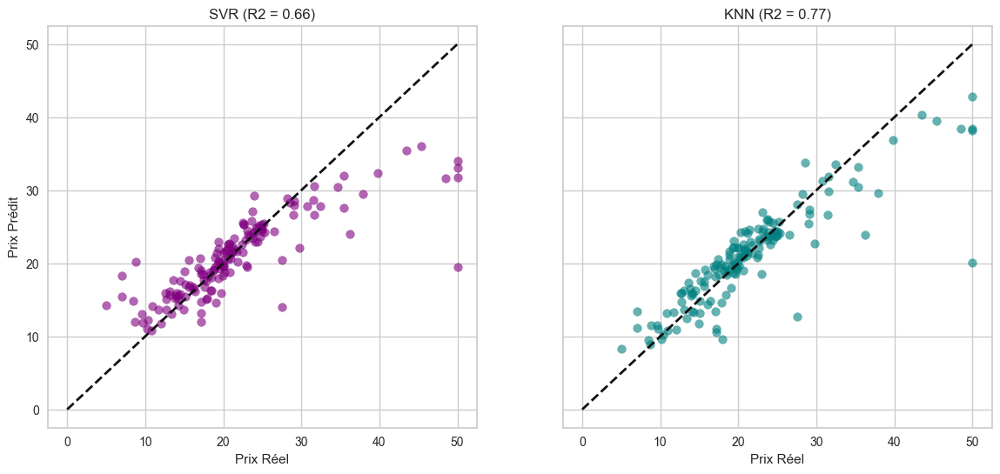

In [109]:
import matplotlib.pyplot as plt

# Prédictions
pred_svr = svr.predict(bos_sX_test)
pred_knn = knr.predict(bos_sX_test)

# Graphique
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# SVR Plot
axes[0].scatter(bos_sy_test, pred_svr, alpha=0.6, color='purple')
axes[0].plot([0, 50], [0, 50], 'k--', lw=2) # Ligne parfaite
axes[0].set_title(f"SVR (R2 = {svr.score(bos_sX_test, bos_sy_test):.2f})")
axes[0].set_xlabel("Prix Réel")
axes[0].set_ylabel("Prix Prédit")

# KNN Plot
axes[1].scatter(bos_sy_test, pred_knn, alpha=0.6, color='teal')
axes[1].plot([0, 50], [0, 50], 'k--', lw=2) # Ligne parfaite
axes[1].set_title(f"KNN (R2 = {knr.score(bos_sX_test, bos_sy_test):.2f})")
axes[1].set_xlabel("Prix Réel")

plt.show()

## Arbre de décision

In [110]:
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn import model_selection
import pandas as pd
import matplotlib.pyplot as plt

# (Assure-toi que bos_X_train et bos_y_train sont chargés)

# 1. Création du modèle
# Sans max_depth, l'arbre va grandir jusqu'à ce que l'erreur soit nulle sur le train (risque de sur-apprentissage)
dtr = DecisionTreeRegressor(random_state=42)
dtr.fit(bos_X_train, bos_y_train)

# 2. Évaluation
# Un score R2 proche de 1 est excellent.
print(f"Score R2 (Arbre complet) : {dtr.score(bos_X_test, bos_y_test):.4f}")

# 3. Importance des caractéristiques
# Quelles variables sont utilisées en haut de l'arbre pour diviser les prix ?
print("\nTop 5 Variables les plus importantes :")
for col, val in sorted(
    zip(bos_X.columns, dtr.feature_importances_),
    key=lambda x: x[1],
    reverse=True
)[:5]:
    print(f"{col:10} : {val:.3f}")

Score R2 (Arbre complet) : 0.8445

Top 5 Variables les plus importantes :
rm         : 0.576
lstat      : 0.190
dis        : 0.110
crim       : 0.058
ptratio    : 0.025


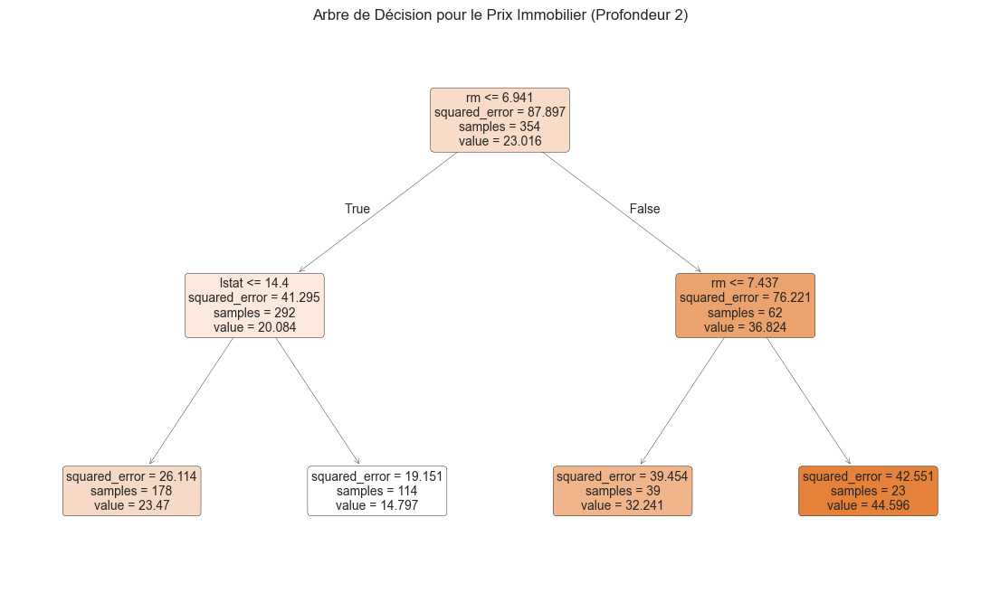

In [111]:
# Entraînement d'un petit arbre "résumé"
dtr_simple = DecisionTreeRegressor(max_depth=2, random_state=42)
dtr_simple.fit(bos_X_train, bos_y_train)

# Visualisation avec plot_tree (natif Scikit-Learn, pas besoin de Graphviz externe)
plt.figure(figsize=(14, 8))
plot_tree(
    dtr_simple,
    feature_names=bos_X.columns,
    filled=True,      # Colorie les cases selon la valeur prédite (plus foncé = prix plus élevé)
    rounded=True,
    fontsize=10
)
plt.title("Arbre de Décision pour le Prix Immobilier (Profondeur 2)")
plt.show()

## Random forest

In [114]:
from sklearn.ensemble import RandomForestRegressor
from sklearn import model_selection
from sklearn.datasets import make_regression
import pandas as pd
import matplotlib.pyplot as plt

# --- 1. Création de données (Simulation) ---
# On simule un dataset immobilier avec 8 caractéristiques
X, y = make_regression(n_samples=1000, n_features=8, noise=0.1, random_state=42)
feature_names = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS']
bos_X = pd.DataFrame(X, columns=feature_names)
bos_y = pd.Series(y, name='Price')

# Split
bos_X_train, bos_X_test, bos_y_train, bos_y_test = model_selection.train_test_split(
    bos_X, bos_y, test_size=0.3, random_state=42
)

# --- 2. Création du modèle ---
# n_estimators=100 : 100 arbres dans la forêt
rfr = RandomForestRegressor(n_estimators=100, random_state=42)
rfr.fit(bos_X_train, bos_y_train)

# 3. Score R2
print(f"Score R2 (Random Forest) : {rfr.score(bos_X_test, bos_y_test):.4f}")

Score R2 (Random Forest) : 0.8215



Importance des caractéristiques (Gini/MDI) :
AGE        : 0.264
CRIM       : 0.246
INDUS      : 0.199
ZN         : 0.089
NOX        : 0.088
RM         : 0.058
CHAS       : 0.038
DIS        : 0.018


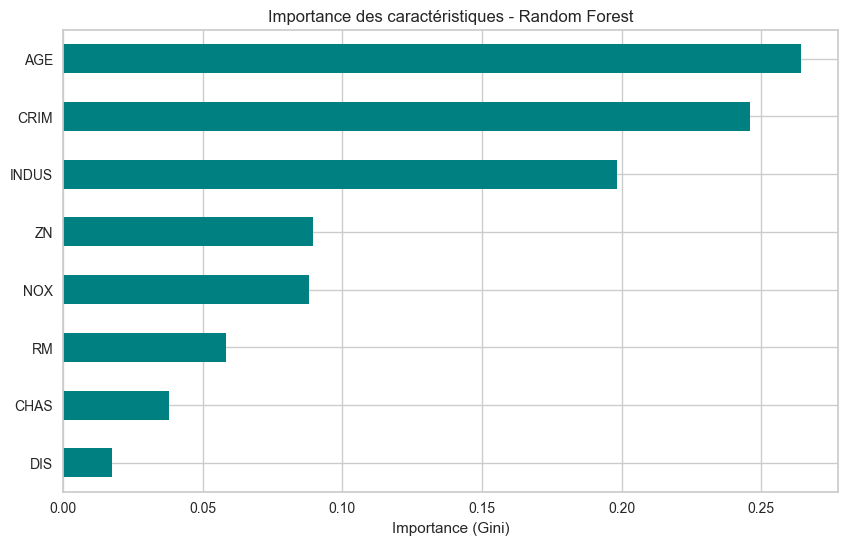

In [115]:
print("\nImportance des caractéristiques (Gini/MDI) :")
for col, val in sorted(
    zip(bos_X.columns, rfr.feature_importances_),
    key=lambda x: x[1],
    reverse=True
):
    print(f"{col:10} : {val:.3f}")

# Visualisation graphique
import seaborn as sns
plt.figure(figsize=(10, 6))
feat_importances = pd.Series(rfr.feature_importances_, index=bos_X.columns)
feat_importances.nlargest(10).sort_values().plot(kind='barh', color='teal')
plt.title("Importance des caractéristiques - Random Forest")
plt.xlabel("Importance (Gini)")
plt.show()

## XGBoost

In [117]:
import xgboost as xgb
import matplotlib.pyplot as plt

# 1. Création du modèle
# objective='reg:squarederror' est le standard moderne pour la régression
xgr = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.1,
    objective='reg:squarederror',
    random_state=42
)

# 2. Entraînement
xgr.fit(bos_X_train, bos_y_train)

# 3. Score
print(f"Score R2 (XGBoost) : {xgr.score(bos_X_test, bos_y_test):.4f}")

# 4. Prédiction (Exemple)
price_pred = xgr.predict(bos_X_test.iloc[[0]])
print(f"Prix prédit pour la 1ère maison : {price_pred[0]:.2f}")

Score R2 (XGBoost) : 0.9209
Prix prédit pour la 1ère maison : 169.84


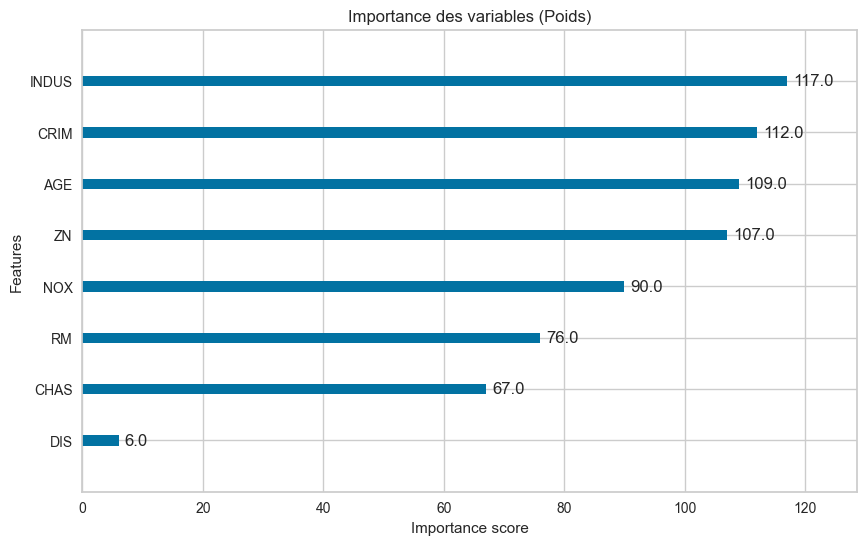


Structure du 1er arbre (Logique de décision) :
0:[AGE<-0.346426517] yes=1,no=2,missing=2
	1:[CRIM<0.496873587] yes=3,no=4,missing=4
		3:[INDUS<-0.015471641] yes=7,no=8,missing=8
			7:leaf=-19.8384686
			8:leaf=-7.22634363
		4:[INDUS<0.663545609] yes=9,no=10,missing=10
			9:leaf=-0.602867365
			10:leaf=12.2452879
	2:[CRIM<-0.411426604] yes=5,no=6,missing=6
		5:[NOX<0.381734163] yes=11,no=12,missing=12
			11:leaf=-7.84858656
			12:leaf=4.35013819
		6:[INDUS<0.380778074] yes=13,no=14,missing=14
			13:leaf=5.42605352
			14:leaf=18.691885



In [118]:
# Visualisation de l'importance (Weight : combien de fois la variable est utilisée)
fig, ax = plt.subplots(figsize=(10, 6))
xgb.plot_importance(xgr, ax=ax, importance_type='weight', title='Importance des variables (Poids)')
plt.show()

# Structure du premier arbre (Texte)
print("\nStructure du 1er arbre (Logique de décision) :")
# On récupère le dump textuel
print(xgr.get_booster().get_dump()[0])

## Régression lightGBM

In [119]:
import lightgbm as lgb
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_regression
import pandas as pd

# --- 1. Création de données (Simulation) ---
# (On reprend les données synthétiques car Boston est indisponible)
X, y = make_regression(n_samples=1000, n_features=8, noise=0.1, random_state=42)
feature_names = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS']
bos_X = pd.DataFrame(X, columns=feature_names)
bos_y = pd.Series(y, name='Price')

X_train, X_test, y_train, y_test = train_test_split(bos_X, bos_y, test_size=0.3, random_state=42)

# --- 2. Création du modèle ---
# num_leaves=31 est le paramètre clé (contrôle la complexité plus que max_depth)
lgr = lgb.LGBMRegressor(random_state=42, num_leaves=31, n_estimators=100)

# 3. Entraînement
lgr.fit(X_train, y_train)

# 4. Score
print(f"Score R2 (LightGBM) : {lgr.score(X_test, y_test):.4f}")

# 5. Prédiction
pred = lgr.predict(X_test.iloc[[0]])
print(f"Prix prédit : {pred[0]:.2f}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1868
[LightGBM] [Info] Number of data points in the train set: 700, number of used features: 8
[LightGBM] [Info] Start training from score 0.376233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be


Top 5 Variables (Split) :
INDUS      : 405
AGE        : 390
CRIM       : 384
ZN         : 352
NOX        : 343


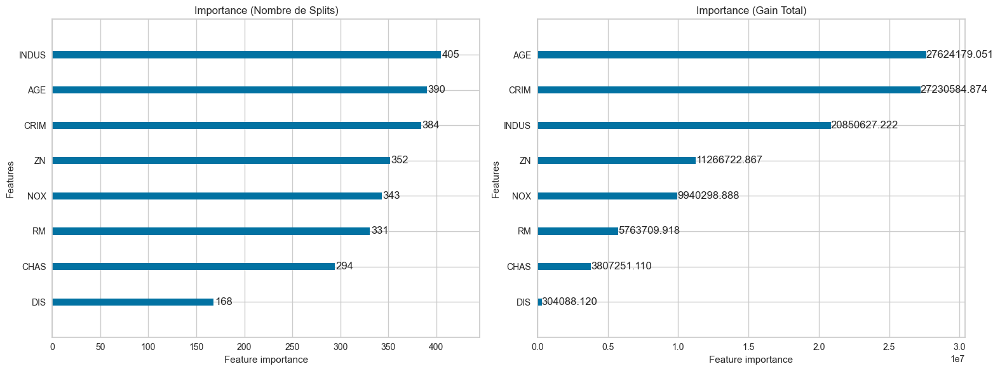

In [120]:
# Importance par défaut ('split' : nombre d'utilisations)
print("\nTop 5 Variables (Split) :")
for col, val in sorted(zip(bos_X.columns, lgr.feature_importances_), key=lambda x: x[1], reverse=True)[:5]:
    print(f"{col:10} : {val}")

# Visualisation Graphique
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# Plot Split
lgb.plot_importance(lgr, ax=ax[0], importance_type='split', title='Importance (Nombre de Splits)')

# Plot Gain
lgb.plot_importance(lgr, ax=ax[1], importance_type='gain', title='Importance (Gain Total)')

plt.tight_layout()
plt.show()

In [121]:
# On convertit le modèle en DataFrame
tree_df = lgr.booster_.trees_to_dataframe()

# On regarde le premier arbre (tree_index=0)
first_tree = tree_df[tree_df['tree_index'] == 0]

print("\nStructure du 1er Arbre (Logique de décision) :")
# On affiche les colonnes utiles pour comprendre la logique
cols = ['node_depth', 'split_feature', 'threshold', 'left_child', 'right_child', 'value']
print(first_tree[cols].head(10))


Structure du 1er Arbre (Logique de décision) :
   node_depth split_feature     threshold left_child right_child      value
0           1           AGE -3.465990e-01       0-S2        0-S1   0.376233
1           2          CRIM  5.131916e-01       0-S4       0-S12  -8.385600
2           3         INDUS  1.000000e-35      0-S16        0-S8 -13.653900
3           4          CRIM -6.333255e-01       0-L0       0-S22 -19.662600
4           5          None           NaN       None        None -25.987098
5           5           NOX -2.206030e-01      0-L17       0-L23 -16.642000
6           6          None           NaN       None        None -21.489051
7           6          None           NaN       None        None -13.162029
8           4            RM  1.761786e-01      0-S21       0-S25  -6.894140
9           5           NOX -4.444408e-02       0-L5       0-L22 -12.412200


## Métrique et évaluation des régressions

In [122]:
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics, model_selection
from sklearn.datasets import make_regression
import numpy as np

# --- 1. Création de données synthétiques ---
# On décale y pour qu'il soit positif (nécessaire pour l'erreur Logarithmique MSLE)
X, y = make_regression(n_samples=1000, n_features=10, noise=0.2, random_state=42)
y = y - y.min() + 10 

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.3, random_state=42)

# --- 2. Entraînement ---
rfr = RandomForestRegressor(n_estimators=100, random_state=42)
rfr.fit(X_train, y_train)
y_pred = rfr.predict(X_test)

# --- 3. Les 5 Métriques Clés ---
print("--- Évaluation du Modèle ---")
print(f"R2 Score            : {metrics.r2_score(y_test, y_pred):.4f} (Le plus proche de 1 est le mieux)")
print(f"MAE (Erreur Abs)    : {metrics.mean_absolute_error(y_test, y_pred):.4f} (L'erreur moyenne en $)")
print(f"MSE (Erreur Carrée) : {metrics.mean_squared_error(y_test, y_pred):.4f} (Pénalise les grosses erreurs)")
print(f"RMSE (Racine MSE)   : {np.sqrt(metrics.mean_squared_error(y_test, y_pred)):.4f} (Écart-type de l'erreur)")
print(f"MSLE (Log Error)    : {metrics.mean_squared_log_error(y_test, y_pred):.4f} (Utile pour les croissances exponentielles)")

--- Évaluation du Modèle ---
R2 Score            : 0.8498 (Le plus proche de 1 est le mieux)
MAE (Erreur Abs)    : 40.9924 (L'erreur moyenne en $)
MSE (Erreur Carrée) : 2783.5301 (Pénalise les grosses erreurs)
RMSE (Racine MSE)   : 52.7592 (Écart-type de l'erreur)
MSLE (Log Error)    : 0.0535 (Utile pour les croissances exponentielles)


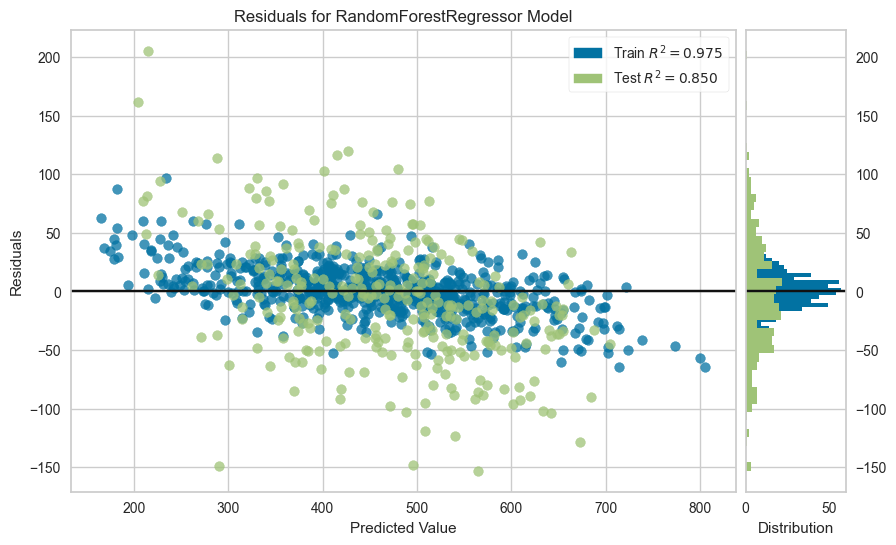

<Axes: title={'center': 'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [123]:
from yellowbrick.regressor import ResidualsPlot
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
viz = ResidualsPlot(rfr)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

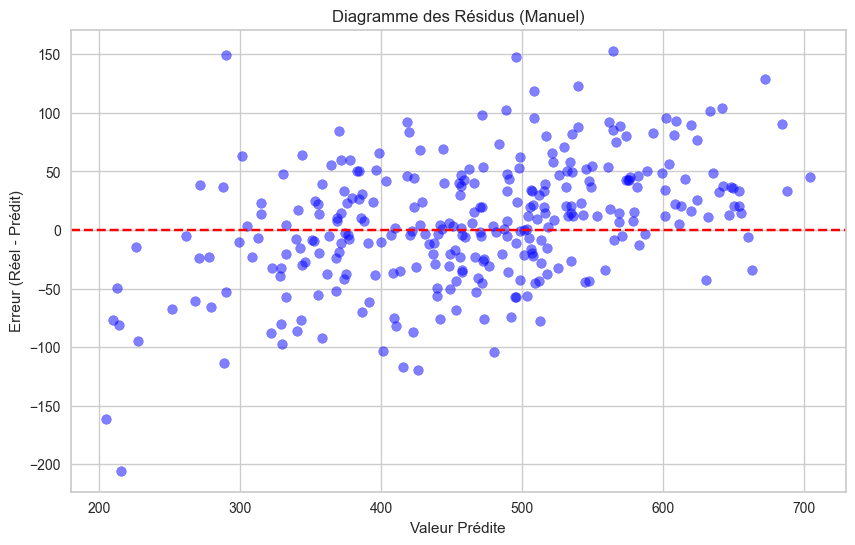

In [124]:
# Calcul manuel des résidus
residuals = y_test - y_pred

plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.5, color='blue')
plt.axhline(0, color='red', linestyle='--') # La ligne de perfection
plt.xlabel('Valeur Prédite')
plt.ylabel('Erreur (Réel - Prédit)')
plt.title('Diagramme des Résidus (Manuel)')
plt.show()

In [125]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.stats.api as sms
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_regression

# 1. Création de données synthétiques (Simulation Immobilier)
# On génère des données avec un peu de bruit pour rendre les tests intéressants
X, y = make_regression(n_samples=1000, n_features=10, noise=10.0, random_state=42)
bos_X = pd.DataFrame(X, columns=[f"Feat_{i}" for i in range(10)])
bos_y = pd.Series(y, name='Price')

# Split
bos_X_train, bos_X_test, bos_y_train, bos_y_test = train_test_split(
    bos_X, bos_y, test_size=0.3, random_state=42
)

# 2. Entraînement du modèle (Random Forest)
rfr = RandomForestRegressor(n_estimators=100, random_state=42)
rfr.fit(bos_X_train, bos_y_train)

# 3. Calcul des Résidus (Erreurs)
# Résidu = Réalité - Prédiction
y_pred = rfr.predict(bos_X_test)
resids = bos_y_test - y_pred

--- Test d'Hétéroscédasticité ---
Lagrange multiplier statistic  : 10.51059
p-value                        : 0.39689
f-value                        : 1.04928
f p-value                      : 0.40206
=> Homoscédasticité (Variance stable).


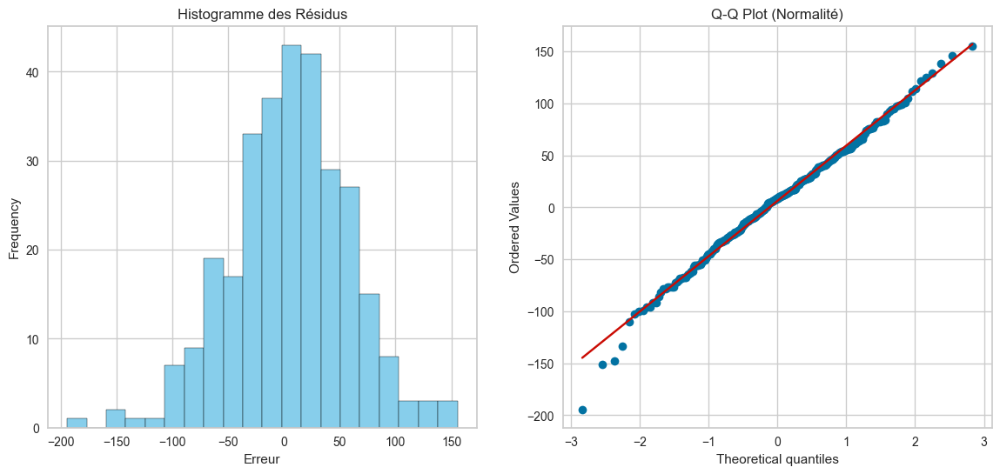


--- Test de Normalité (K-S) ---
P-value : 0.00000


In [130]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.stats.api as sms
import statsmodels.api as sm  # Import correct pour add_constant
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_regression

# 1. Préparation des données (Simulation)
X, y = make_regression(n_samples=1000, n_features=10, noise=10.0, random_state=42)
bos_X = pd.DataFrame(X, columns=[f"Feat_{i}" for i in range(10)])
bos_y = pd.Series(y, name='Price')

X_train, X_test, y_train, y_test = train_test_split(bos_X, bos_y, test_size=0.3, random_state=42)

# 2. Modèle et Résidus
rfr = RandomForestRegressor(n_estimators=100, random_state=42)
rfr.fit(X_train, y_train)
y_pred = rfr.predict(X_test)
resids = y_test - y_pred

# --- 1. Test d'Hétéroscédasticité (Breusch-Pagan) ---
# CORRECTION : Utilisation de sm.add_constant
hb = sms.het_breuschpagan(resids, sm.add_constant(X_test))

labels = ["Lagrange multiplier statistic", "p-value", "f-value", "f p-value"]
print("--- Test d'Hétéroscédasticité ---")
for name, num in zip(labels, hb):
    print(f"{name:30} : {num:.5f}")

if hb[1] < 0.05:
    print("=> Hétéroscédasticité détectée (Variance instable).")
else:
    print("=> Homoscédasticité (Variance stable).")

# --- 2. Normalité des Résidus ---
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Histogramme
pd.Series(resids).plot.hist(bins=20, ax=axes[0], title="Histogramme des Résidus", color='skyblue', edgecolor='black')
axes[0].set_xlabel("Erreur")

# Q-Q Plot
stats.probplot(resids, dist="norm", plot=axes[1])
axes[1].set_title("Q-Q Plot (Normalité)")
plt.show()

# Test de Kolmogorov-Smirnov
ks_stat, ks_pval = stats.kstest(resids, cdf="norm")
print(f"\n--- Test de Normalité (K-S) ---")
print(f"P-value : {ks_pval:.5f}")

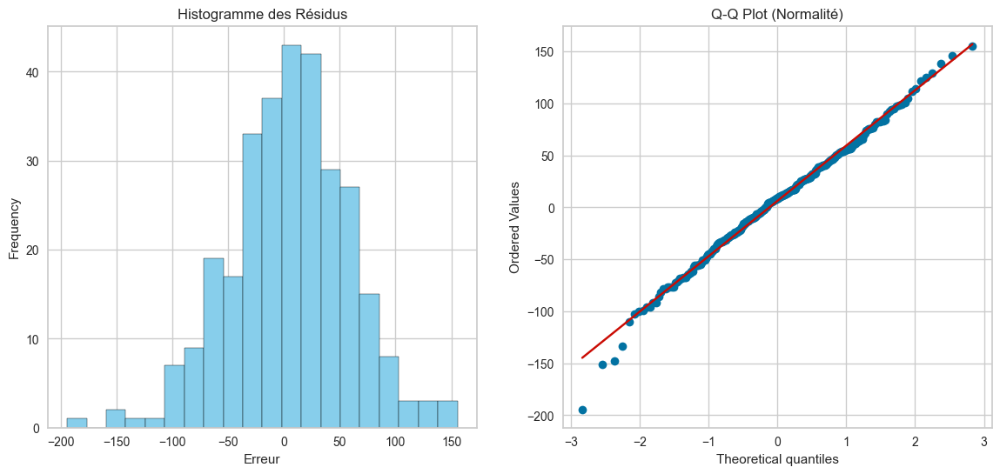

--- Test de Normalité (K-S) ---
P-value : 0.00000
=> Les résidus ne suivent PAS une loi normale (Classique en Random Forest).


In [127]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# A. Histogramme des résidus
pd.Series(resids).plot.hist(bins=20, ax=axes[0], title="Histogramme des Résidus", color='skyblue', edgecolor='black')
axes[0].set_xlabel("Erreur")

# B. Diagramme de Probabilité (Q-Q Plot)
# Si les points bleus suivent la ligne rouge, c'est une distribution Normale.
stats.probplot(resids, dist="norm", plot=axes[1])
axes[1].set_title("Q-Q Plot (Normalité)")

plt.show()

# C. Test de Kolmogorov-Smirnov (Test statistique formel)
# On compare nos résidus à une distribution normale parfaite ("norm")
ks_stat, ks_pval = stats.kstest(resids, cdf="norm")
print(f"--- Test de Normalité (K-S) ---")
print(f"P-value : {ks_pval:.5f}")
if ks_pval < 0.05:
    print("=> Les résidus ne suivent PAS une loi normale (Classique en Random Forest).")
else:
    print("=> Les résidus suivent une loi normale.")

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


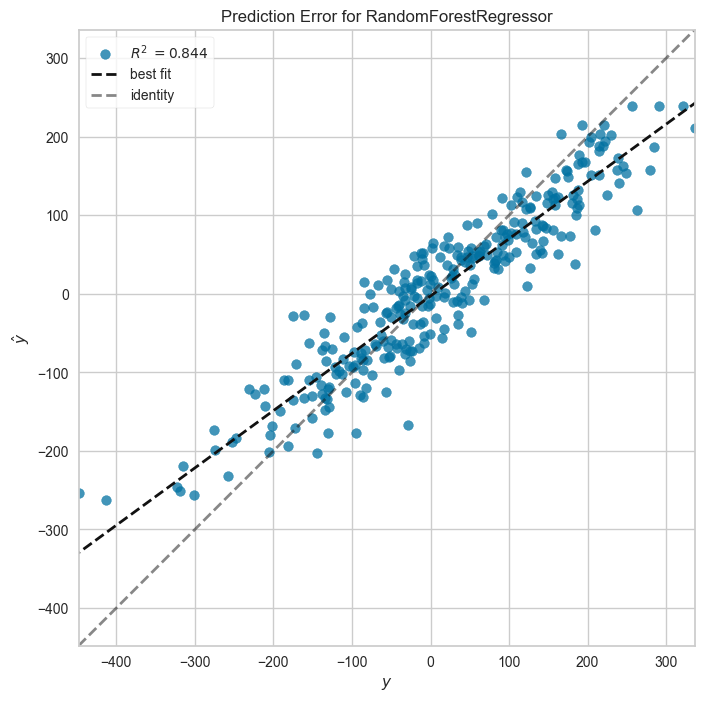

<Axes: title={'center': 'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [128]:
from yellowbrick.regressor import PredictionError

plt.figure(figsize=(8, 8))
pev = PredictionError(rfr)

pev.fit(bos_X_train, bos_y_train)
pev.score(bos_X_test, bos_y_test)
pev.show()

In [131]:
import xgboost as xgb
import shap
import pandas as pd
import numpy as np
from sklearn.datasets import make_regression
import matplotlib.pyplot as plt

# --- 1. Simulation du dataset Boston (avec les vrais noms de colonnes) ---
# On crée des données aléatoires mais structurées pour l'exercice
X, y = make_regression(n_samples=506, n_features=13, noise=5.0, random_state=42)
col_names = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT']
bos_X = pd.DataFrame(X, columns=col_names)
bos_y = pd.Series(y, name='Price')

# --- 2. Entraînement du modèle XGBoost ---
xgr = xgb.XGBRegressor(n_estimators=100, random_state=42, objective='reg:squarederror')
xgr.fit(bos_X, bos_y)

# --- 3. Prédiction pour l'échantillon n°5 ---
sample_idx = 5
pred = xgr.predict(bos_X.iloc[[sample_idx]])
print(f"Prédiction pour l'échantillon {sample_idx} : {pred[0]:.2f}")

Prédiction pour l'échantillon 5 : -168.94


In [132]:
# Initialisation JavaScript (Indispensable pour les graphiques interactifs)
shap.initjs()

# Création de l'explainer
explainer = shap.TreeExplainer(xgr)
shap_values = explainer.shap_values(bos_X)

print(f"Valeur de base (Moyenne) : {explainer.expected_value:.2f}")

Valeur de base (Moyenne) : 2.82


In [133]:
print(f"Explication pour la maison n°{sample_idx} :")
shap.force_plot(
    explainer.expected_value,
    shap_values[sample_idx],
    bos_X.iloc[sample_idx]
)

Explication pour la maison n°5 :


In [134]:
print("Visualisation globale interactive :")
shap.force_plot(
    explainer.expected_value,
    shap_values,
    bos_X
)

Visualisation globale interactive :


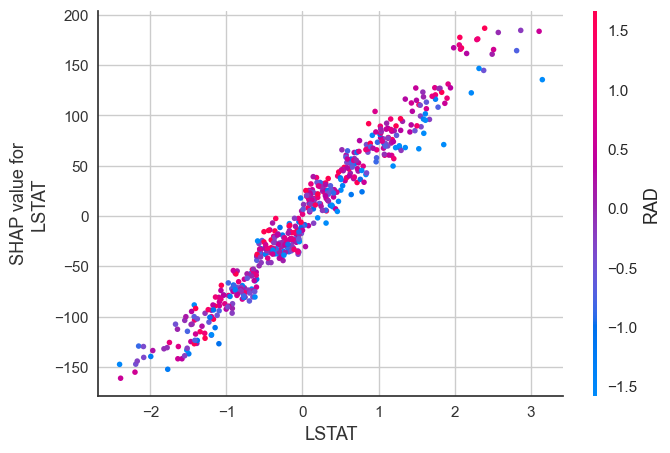

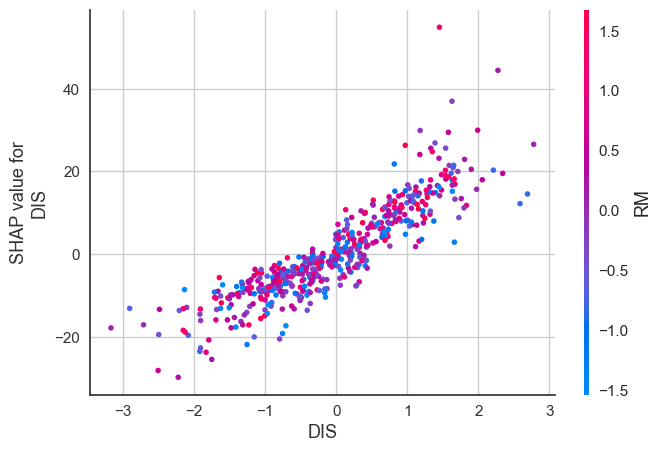

In [135]:
# A. Dépendance pour LSTAT
# On s'attend à voir une courbe descendante (plus de pauvreté = prix plus bas)
shap.dependence_plot("LSTAT", shap_values, bos_X)

# B. Dépendance pour DIS (Distance aux emplois) avec interaction
# On regarde si l'effet de la distance change selon le nombre de pièces (RM)
shap.dependence_plot("DIS", shap_values, bos_X, interaction_index="RM")

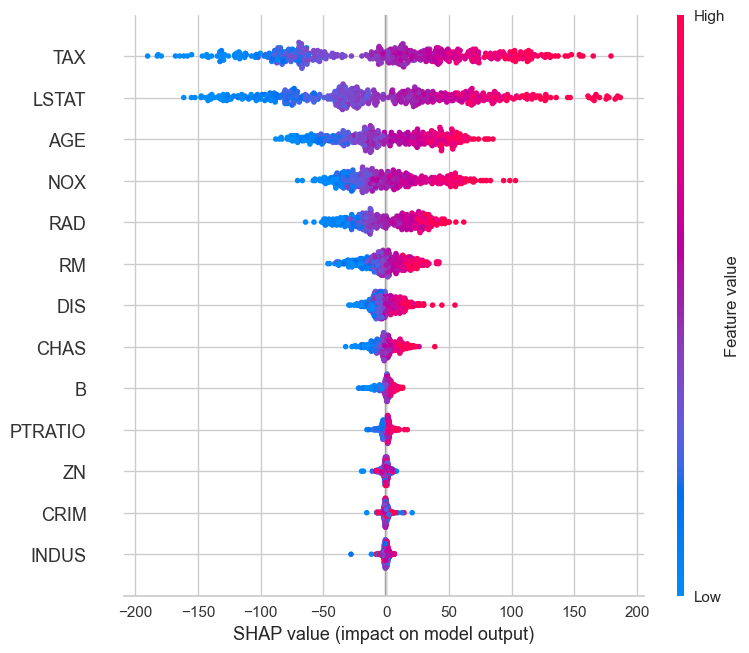

In [136]:
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, bos_X)

## Réduction dimensionnalité PCA

In [137]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Chargement et Nettoyage rapide
df = pd.read_csv('titanic_dataset.csv')
df.columns = [c.lower() for c in df.columns] # Standardisation des noms

# On garde toutes les variables utiles pour l'analyse
# (On enlève 'survived' car la PCA est non-supervisée : elle ne doit pas connaître la réponse)
cols_to_drop = ['name', 'ticket', 'cabin', 'passengerid', 'survived', 'home.dest', 'boat', 'body']
df_clean = df.drop(columns=cols_to_drop, errors='ignore')
df_encoded = pd.get_dummies(df_clean, drop_first=True)

# 2. Imputation (Médiane) et Standardisation
imputer = SimpleImputer(strategy='median')
X_full = imputer.fit_transform(df_encoded)

scaler = StandardScaler()
X_std = scaler.fit_transform(X_full)

# 3. Exécution de la PCA
pca = PCA(random_state=42)
X_pca = pca.fit_transform(X_std)

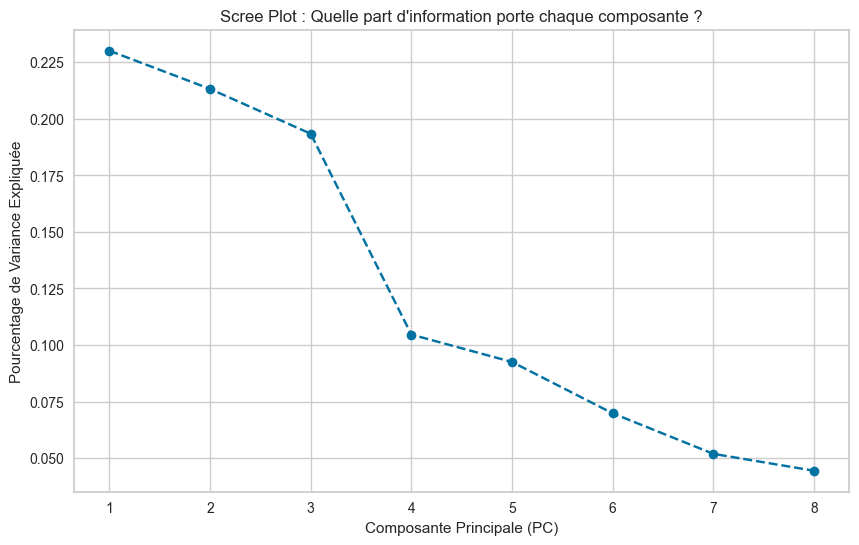

In [138]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), 
         pca.explained_variance_ratio_, marker='o', linestyle='--')
plt.title('Scree Plot : Quelle part d\'information porte chaque composante ?')
plt.xlabel('Composante Principale (PC)')
plt.ylabel('Pourcentage de Variance Expliquée')
plt.grid(True)
plt.show()

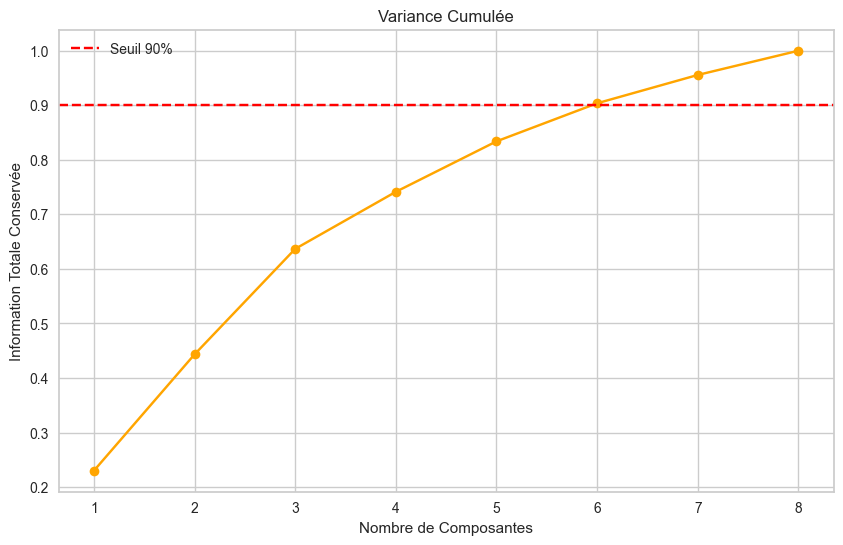

Avec 4 composantes, on conserve 74.14% de l'information originale.


In [139]:
plt.figure(figsize=(10, 6))
cumsum = np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1, len(cumsum) + 1), cumsum, marker='o', color='orange')
plt.axhline(0.90, color='red', linestyle='--', label='Seuil 90%')
plt.title('Variance Cumulée')
plt.xlabel('Nombre de Composantes')
plt.ylabel('Information Totale Conservée')
plt.legend()
plt.grid(True)
plt.show()

print(f"Avec 4 composantes, on conserve {cumsum[3]:.2%} de l'information originale.")

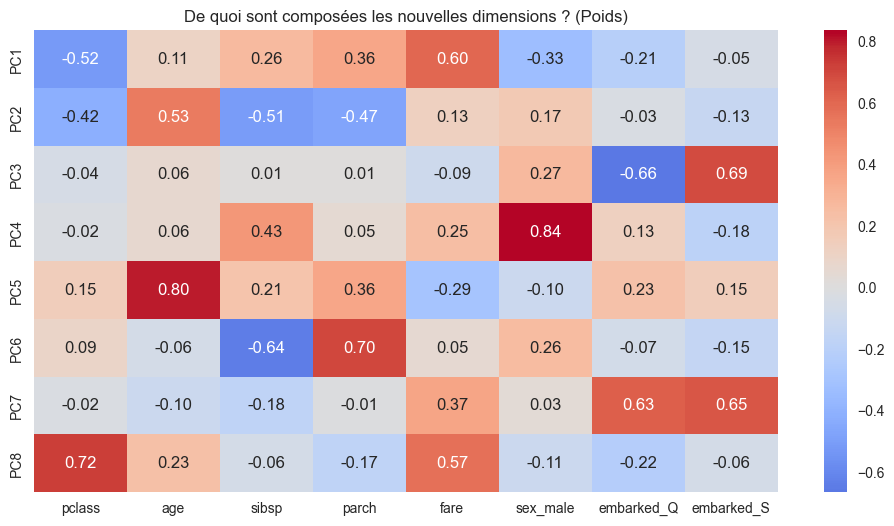

In [140]:
plt.figure(figsize=(12, 6))
# On crée un DataFrame pour que les noms soient lisibles
loadings = pd.DataFrame(
    pca.components_, 
    columns=df_encoded.columns, 
    index=[f"PC{i+1}" for i in range(len(pca.components_))]
)

sns.heatmap(loadings, cmap='coolwarm', center=0, annot=True, fmt=".2f")
plt.title("De quoi sont composées les nouvelles dimensions ? (Poids)")
plt.show()

In [141]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Rappel : Préparation rapide ---
# (Si tu as déjà tes variables en mémoire, tu peux sauter ce bloc)
df = pd.read_csv('titanic_dataset.csv')
df.columns = [c.lower() for c in df.columns]
cols_to_drop = ['name', 'ticket', 'cabin', 'passengerid', 'survived', 'home.dest', 'boat', 'body']
df_clean = df.drop(columns=cols_to_drop, errors='ignore')
df_encoded = pd.get_dummies(df_clean, drop_first=True)
imputer = SimpleImputer(strategy='median')
X_imp = pd.DataFrame(imputer.fit_transform(df_encoded), columns=df_encoded.columns)
y = df['survived'] # On a besoin de y pour la couleur des points

# Standardisation & PCA
scaler = StandardScaler()
X_std = pd.DataFrame(scaler.fit_transform(X_imp), columns=X_imp.columns)
pca = PCA(random_state=42)
X_pca = pca.fit_transform(X_std)

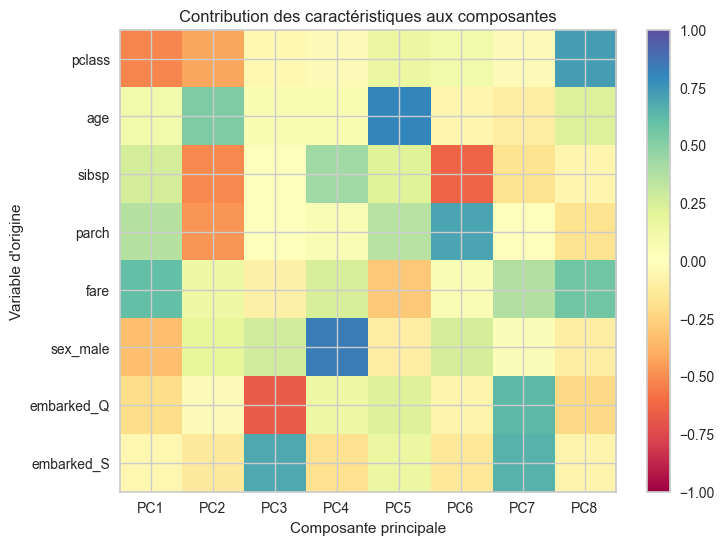

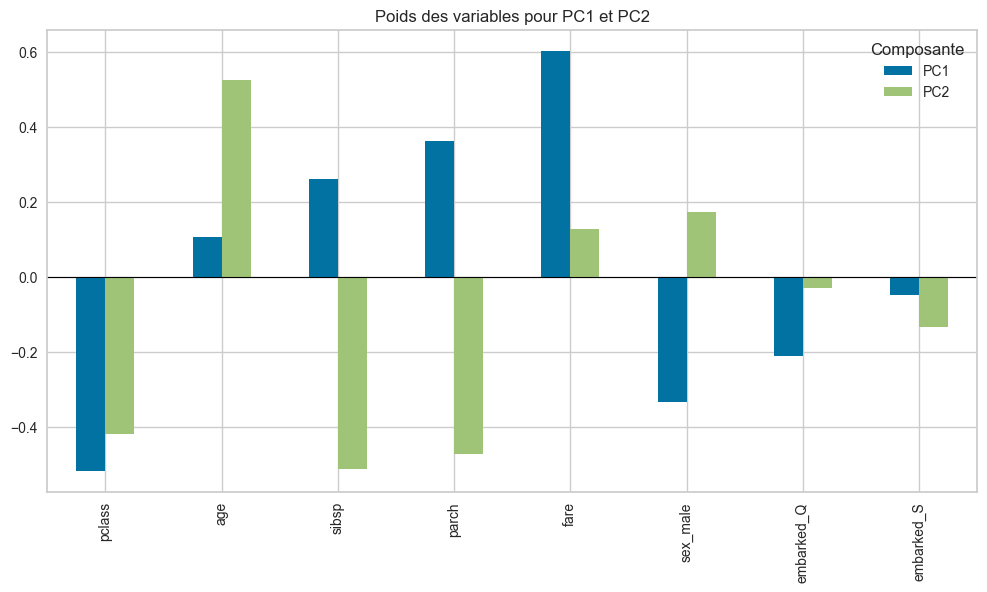

In [142]:
# --- A. Heatmap des contributions (Matplotlib pur) ---
fig, ax = plt.subplots(figsize=(8, 6))

# On transpose (.T) pour avoir les variables en lignes et les PC en colonnes
im = plt.imshow(
    pca.components_.T,
    cmap="Spectral",
    vmin=-1,
    vmax=1,
    aspect='auto'
)

# Habillage du graphique
plt.yticks(range(len(X_std.columns)), X_std.columns)
plt.xticks(range(len(pca.components_)), [f"PC{i+1}" for i in range(len(pca.components_))])
plt.xlabel("Composante principale")
plt.ylabel("Variable d'origine")
plt.title("Contribution des caractéristiques aux composantes")
plt.colorbar(im)
plt.show()

# --- B. Diagramme en Barres (Pandas) ---
# Plus lisible pour voir les signes (+ ou -)
fig, ax = plt.subplots(figsize=(12, 6))
pd.DataFrame(
    pca.components_, 
    columns=X_std.columns,
    index=[f"PC{i+1}" for i in range(len(pca.components_))]
).iloc[:2].T.plot(kind="bar", ax=ax) # On affiche seulement PC1 et PC2 pour la clarté

plt.title("Poids des variables pour PC1 et PC2")
plt.axhline(0, color='black', linewidth=0.8)
plt.legend(title="Composante")
plt.show()

In [143]:
comps = pd.DataFrame(pca.components_, columns=X_std.columns)
min_val = 0.5
num_components = 2 # On regarde les 2 premières dimensions

pca_cols = set()
print(f"Variables ayant un poids > {min_val} dans les {num_components} premières composantes :")

for i in range(num_components):
    # On trouve les colonnes où la valeur absolue est > seuil
    significant = comps.iloc[i][comps.iloc[i].abs() > min_val]
    print(f"\n--- PC{i+1} est influencée par : ---")
    print(significant)
    pca_cols.update(set(significant.index))

Variables ayant un poids > 0.5 dans les 2 premières composantes :

--- PC1 est influencée par : ---
pclass   -0.515772
fare      0.603652
Name: 0, dtype: float64

--- PC2 est influencée par : ---
age      0.527047
sibsp   -0.510764
Name: 1, dtype: float64


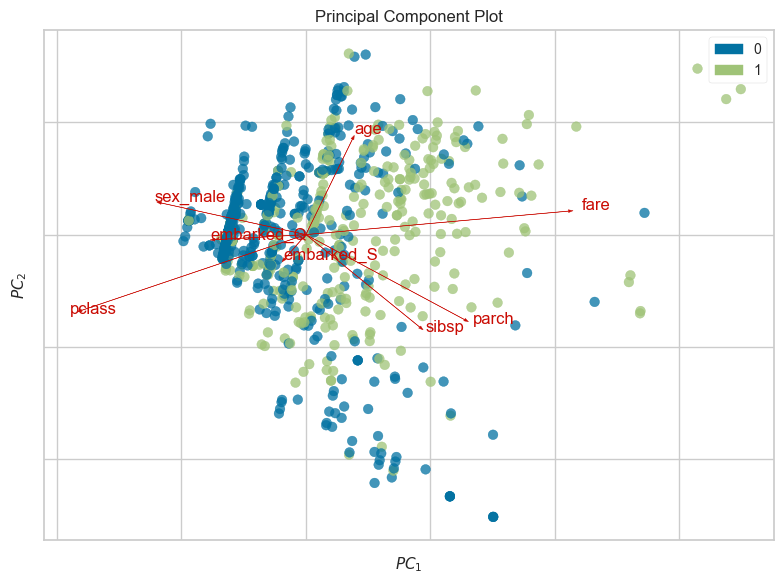

<Axes: title={'center': 'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [144]:
from yellowbrick.features.pca import PCADecomposition

plt.figure(figsize=(8, 6))
# color : On donne une liste de couleurs 'r' (red/mort) ou 'g' (green/survie)
colors = ["r" if v == 0 else "g" for v in y]

# proj_features=True permet d'afficher les vecteurs (flèches) des variables
visualizer = PCADecomposition(scale=True, color=colors, proj_features=True, fontsize=8)
visualizer.fit_transform(X_std, y)
visualizer.show()

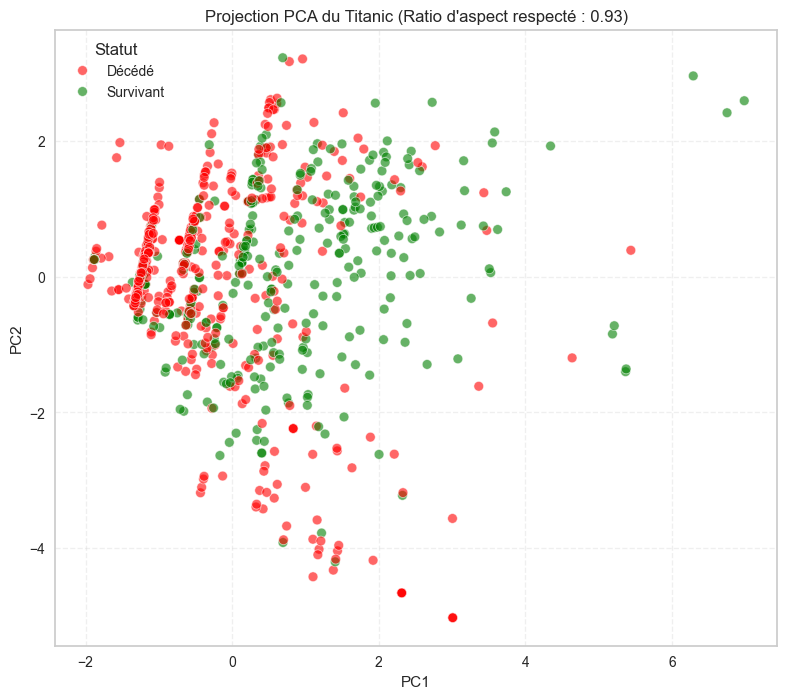

In [145]:
# Préparation du DataFrame pour Seaborn
pca_df = pd.DataFrame(
    X_pca[:, :2], # On prend juste les 2 premières colonnes
    columns=['PC1', 'PC2']
)
pca_df['Statut'] = ['Décédé' if i == 0 else 'Survivant' for i in y]

# Récupération des variances pour le ratio
evr = pca.explained_variance_ratio_

# Tracé
fig, ax = plt.subplots(figsize=(10, 8))

sns.scatterplot(
    x='PC1',
    y='PC2',
    hue='Statut',
    data=pca_df,
    alpha=0.6, # Transparence pour voir les amas
    palette={'Décédé': 'red', 'Survivant': 'green'},
    ax=ax
)

# Astuce Pro : On force l'échelle visuelle à correspondre à l'importance mathématique
# Si PC1 explique 2 fois plus que PC2, le graphique sera 2 fois plus large que haut
ax.set_aspect(evr[1] / evr[0])
plt.title(f"Projection PCA du Titanic (Ratio d'aspect respecté : {evr[1]/evr[0]:.2f})")
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()

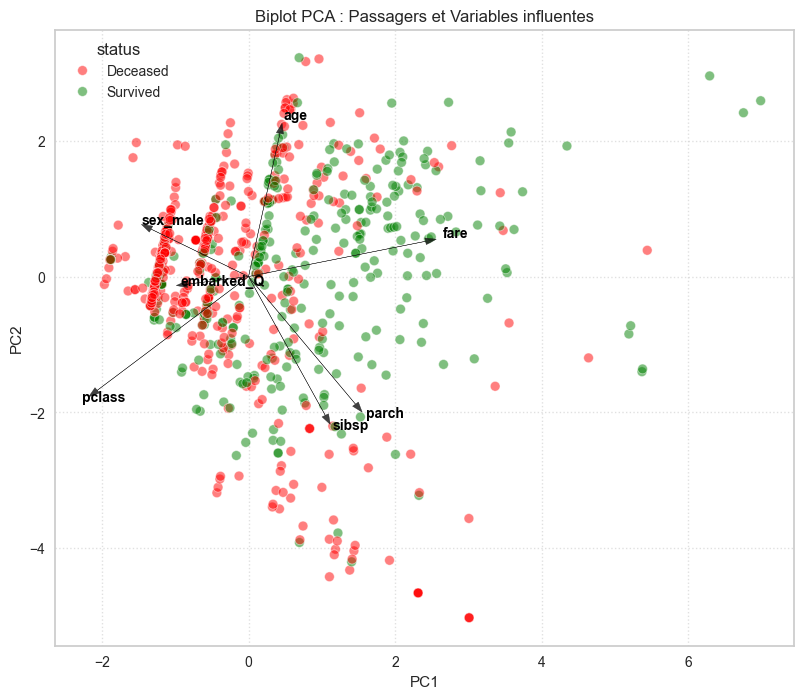

In [146]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 1. Préparation des données PCA
# (Assure-toi d'avoir exécuté la PCA précédente pour avoir X_pca, X_std et pca)
pca_df = pd.DataFrame(X_pca, columns=[f"PC{i+1}" for i in range(X_pca.shape[1])])
pca_df["status"] = ["Deceased" if i == 0 else "Survived" for i in y]

# 2. Configuration du Biplot
fig, ax = plt.subplots(figsize=(12, 8))

# A. Le Nuage de points
sns.scatterplot(
    x="PC1", y="PC2", 
    hue="status", 
    data=pca_df, 
    alpha=0.5, 
    ax=ax,
    palette={'Deceased': 'red', 'Survived': 'green'}
)

# B. Les Flèches (Charges / Loadings)
# On récupère les composantes
comps = pd.DataFrame(pca.components_, columns=X_std.columns)
scale = 4  # Facteur pour agrandir les flèches (sinon elles sont minuscules)

for idx, s in comps.T.iterrows():
    # On ne dessine que les flèches assez longues pour être lisibles
    if (s[0]**2 + s[1]**2)**0.5 > 0.2: 
        plt.arrow(0, 0, s[0]*scale, s[1]*scale, color='k', alpha=0.8, head_width=0.1)
        plt.text(s[0]*scale*1.1, s[1]*scale*1.1, idx, weight='bold', color='black', fontsize=10)

# C. Ajustement du ratio d'aspect
evr = pca.explained_variance_ratio_
ax.set_aspect(evr[1] / evr[0])
plt.title("Biplot PCA : Passagers et Variables influentes")
plt.grid(True, linestyle=':', alpha=0.6)
plt.show()

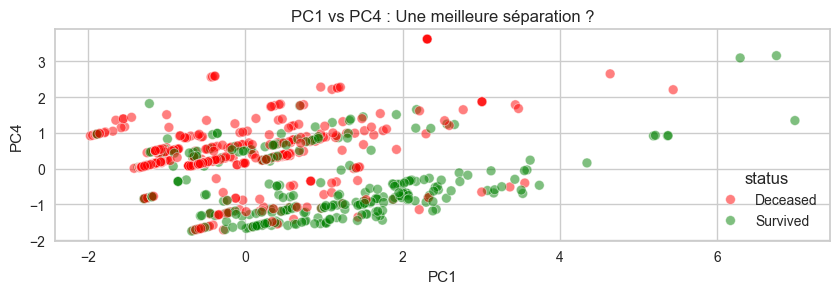

In [147]:
fig, ax = plt.subplots(figsize=(10, 8))

# Ratio d'aspect ajusté (PC4 est beaucoup "plus petite" que PC1)
ax.set_aspect(evr[3] / evr[0]) 

sns.scatterplot(
    x="PC1", 
    y="PC4", 
    hue="status", 
    data=pca_df, 
    alpha=0.5, 
    ax=ax,
    palette={'Deceased': 'red', 'Survived': 'green'}
)
plt.title("PC1 vs PC4 : Une meilleure séparation ?")
plt.grid(True)
plt.show()

In [148]:
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool, CategoricalColorMapper
from bokeh.transform import transform
from bokeh.palettes import Spectral6

output_notebook() # Affiche le résultat dans le notebook

# Préparation des données pour Bokeh
source = ColumnDataSource(pca_df)
targets = ["Deceased", "Survived"]
colors = ["#e74c3c", "#2ecc71"] # Rouge et Vert

# Configuration du Mapper de couleurs
color_mapper = CategoricalColorMapper(factors=targets, palette=colors)

# Création de la Figure
p = figure(
    title="PCA Interactive (Passez la souris sur les points)",
    tools="pan,wheel_zoom,reset,hover",
    tooltips=[
        ("Statut", "@status"),
        ("PC1", "@PC1"),
        ("PC2", "@PC2")
    ]
)

# Dessin des cercles
p.circle(
    x="PC1", 
    y="PC2", 
    source=source,
    size=8,
    alpha=0.6,
    color=transform('status', color_mapper),
    legend_field='status'
)

show(p)

Loading BokehJS ...

In [149]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Préparation rapide des données
df = pd.read_csv('titanic_dataset.csv')
df.columns = [c.lower() for c in df.columns]
cols_to_drop = ['name', 'ticket', 'cabin', 'passengerid', 'survived', 'home.dest', 'boat', 'body']
df_clean = df.drop(columns=cols_to_drop, errors='ignore')
df_encoded = pd.get_dummies(df_clean, drop_first=True)

# Imputation & Standardisation
X_imp = SimpleImputer(strategy='median').fit_transform(df_encoded)
X_std = StandardScaler().fit_transform(X_imp)
y = df['survived']

# 2. Calcul de la PCA (3 Composantes)
pca = PCA(n_components=3, random_state=42)
X_pca = pca.fit_transform(X_std)

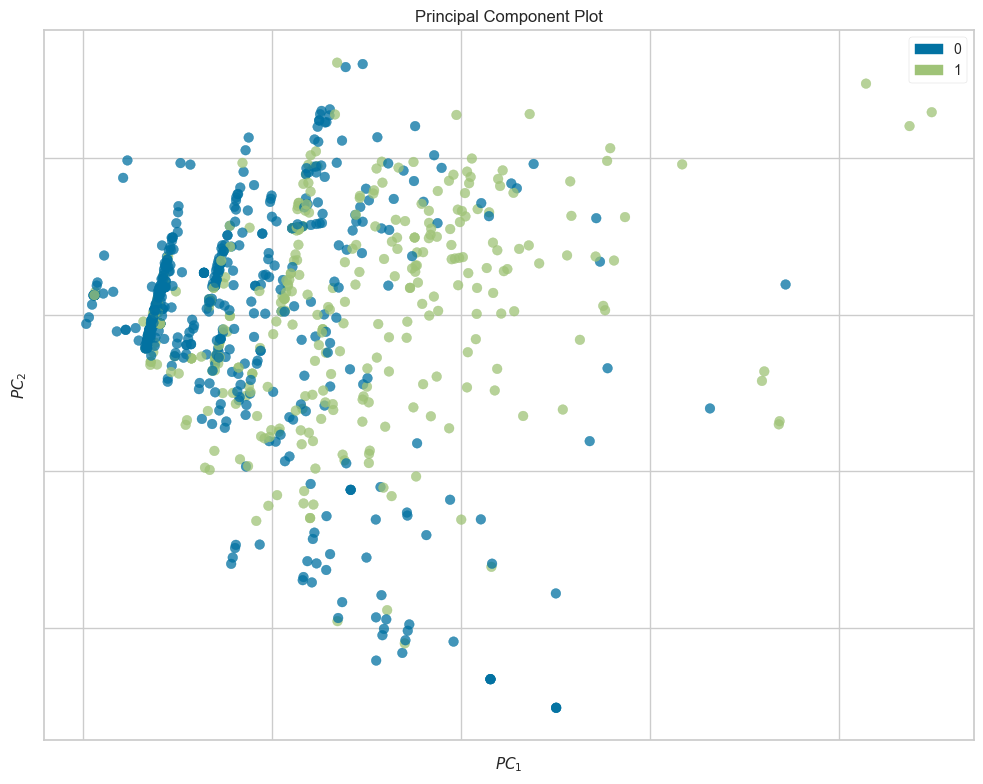

<Axes: title={'center': 'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [150]:
from yellowbrick.features.pca import PCADecomposition

plt.figure(figsize=(10, 8))

# Création de la liste de couleurs (Rouge=Mort, Vert=Survivant)
colors = ["r" if v == 0 else "g" for v in y]

# proj_dim=3 active le mode 3D
viz = PCADecomposition(
    scale=True, 
    proj_dim=3, 
    color=colors,
    fontsize=8
)

viz.fit_transform(X_std, y)
viz.show()

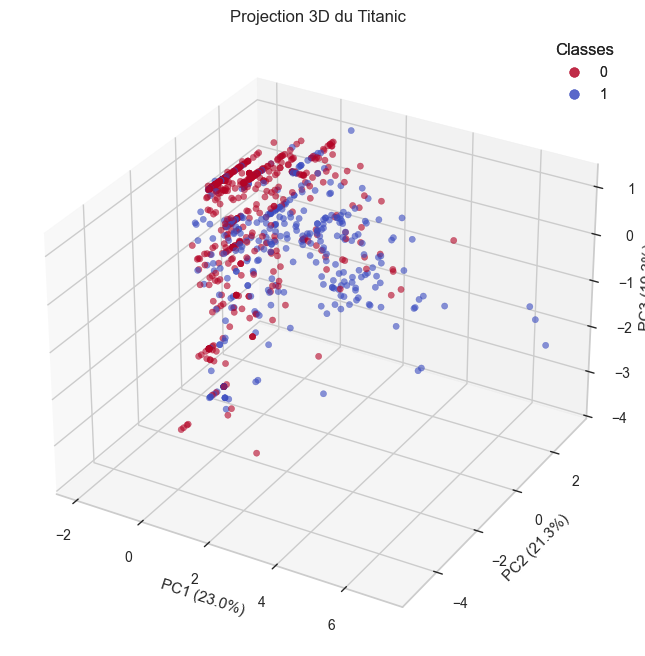

In [151]:
from mpl_toolkits.mplot3d import Axes3D

# Création de la figure 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Nuage de points
scatter = ax.scatter(
    xs=X_pca[:, 0], # PC1
    ys=X_pca[:, 1], # PC2
    zs=X_pca[:, 2], # PC3
    c=y,            # Couleur selon la survie
    cmap='coolwarm_r', # Bleu (Survivant) / Rouge (Mort) inversé
    s=20,           # Taille des points
    alpha=0.6       # Transparence
)

# Labels
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.1%})")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.1%})")
ax.set_zlabel(f"PC3 ({pca.explained_variance_ratio_[2]:.1%})")
ax.set_title("Projection 3D du Titanic")

# Légende manuelle
legend1 = ax.legend(*scatter.legend_elements(), title="Classes")
ax.add_artist(legend1)

plt.show()

In [152]:
try:
    import scprep
    
    # Rotation et affichage interactif (si l'environnement le permet)
    scprep.plot.rotate_scatter3d(
        X_pca,
        c=y,
        cmap='Spectral',
        figsize=(8, 6),
        label_prefix="PC"
    )
except ImportError:
    print("La librairie 'scprep' n'est pas installée.")

## Umap

In [153]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

# --- Rechargement et Nettoyage ---
df = pd.read_csv('titanic_dataset.csv')
# Nettoyage noms colonnes
df.columns = [c.lower() for c in df.columns] 
# Suppression colonnes inutiles
df = df.drop(columns=['name', 'ticket', 'cabin', 'passengerid', 'home.dest', 'boat', 'body'], errors='ignore')
# Encodage
df_encoded = pd.get_dummies(df, drop_first=True)
# Imputation des manquants (Age, Fare)
X_imp = SimpleImputer(strategy='median').fit_transform(df_encoded.drop('survived', axis=1))
y = df['survived']

# --- STANDARDISATION (Crucial pour UMAP) ---
X_std = StandardScaler().fit_transform(X_imp)

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\matplotlib\animation.py:908: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Forme de sortie : (891, 2) (2 dimensions)


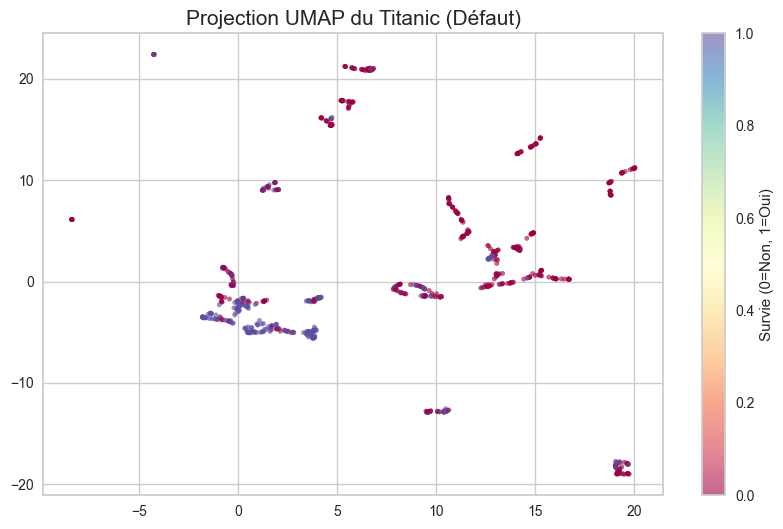

In [154]:
import umap

# 1. Création et Transformation
# random_state=42 assure que le dessin sera le même à chaque fois
reducer = umap.UMAP(random_state=42)
X_umap = reducer.fit_transform(X_std)

print(f"Forme de sortie : {X_umap.shape} (2 dimensions)")

# 2. Visualisation
plt.figure(figsize=(10, 6))
plt.scatter(
    X_umap[:, 0], 
    X_umap[:, 1], 
    c=y, 
    cmap='Spectral', 
    s=10, 
    alpha=0.6
)
plt.title("Projection UMAP du Titanic (Défaut)", fontsize=15)
plt.colorbar(label='Survie (0=Non, 1=Oui)')
plt.show()

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


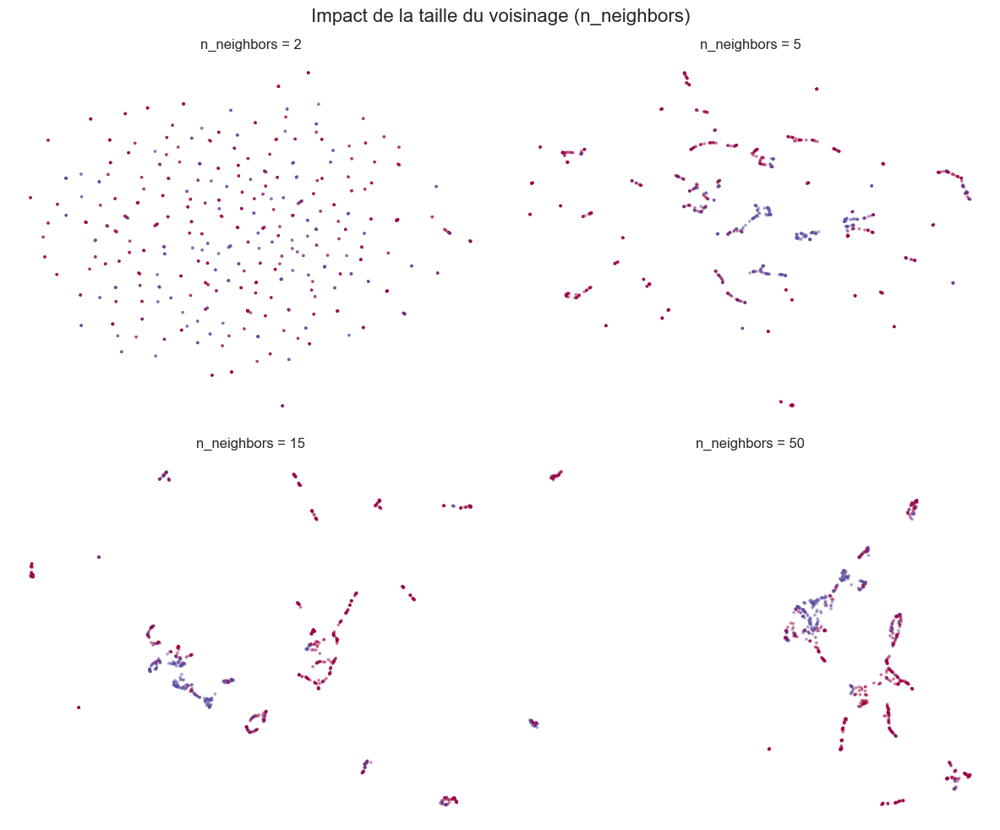

In [155]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel() # Aplatit le tableau d'axes pour boucler facilement

neighbors_list = [2, 5, 15, 50]

for i, n in enumerate(neighbors_list):
    # On entraîne un UMAP différent pour chaque valeur
    fit = umap.UMAP(n_neighbors=n, random_state=42)
    u = fit.fit_transform(X_std)
    
    # Affichage
    axes[i].scatter(u[:, 0], u[:, 1], c=y, cmap='Spectral', s=5, alpha=0.5)
    axes[i].set_title(f"n_neighbors = {n}")
    axes[i].axis('off') # On cache les axes qui ne signifient rien en soi

plt.suptitle("Impact de la taille du voisinage (n_neighbors)", fontsize=16)
plt.tight_layout()
plt.show()

c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


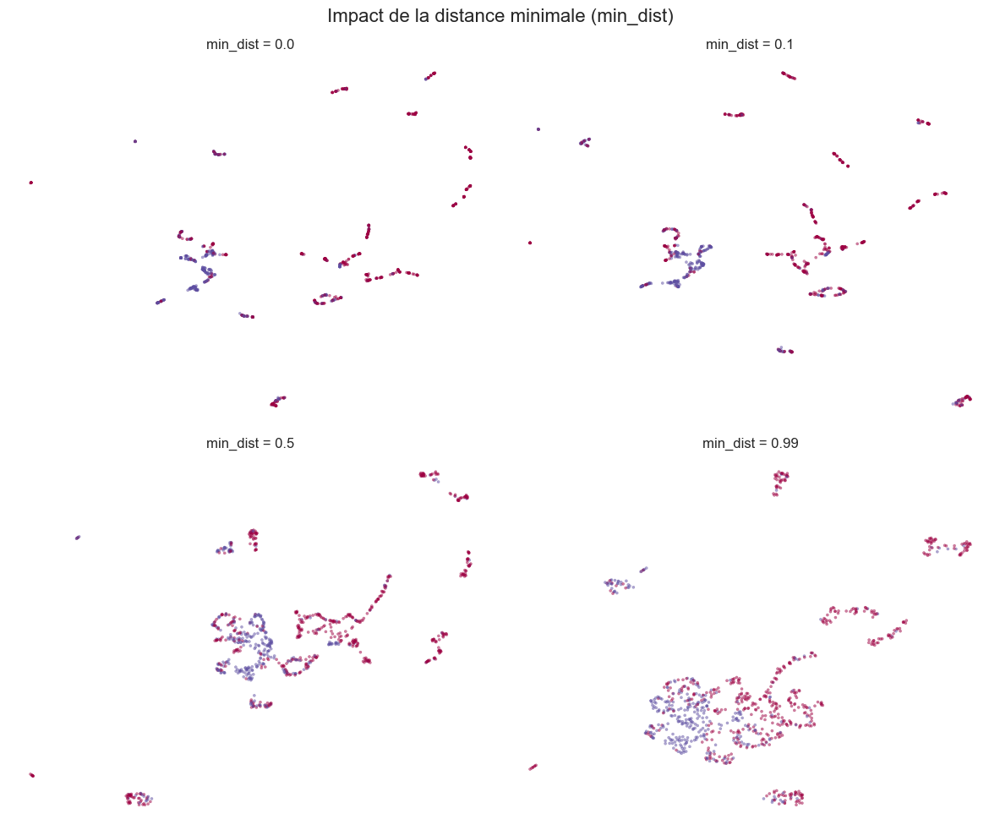

In [156]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()

dist_list = [0.0, 0.1, 0.5, 0.99]

for i, d in enumerate(dist_list):
    # On fixe n_neighbors à 15 (défaut) et on change min_dist
    fit = umap.UMAP(min_dist=d, n_neighbors=15, random_state=42)
    u = fit.fit_transform(X_std)
    
    axes[i].scatter(u[:, 0], u[:, 1], c=y, cmap='Spectral', s=5, alpha=0.5)
    axes[i].set_title(f"min_dist = {d}")
    axes[i].axis('off')

plt.suptitle("Impact de la distance minimale (min_dist)", fontsize=16)
plt.tight_layout()
plt.show()

## t-SNE

In [157]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Rappel : Préparation des données (si session redémarrée) ---
df = pd.read_csv('titanic_dataset.csv')
df.columns = [c.lower() for c in df.columns]
df = df.drop(columns=['name', 'ticket', 'cabin', 'passengerid', 'home.dest', 'boat', 'body'], errors='ignore')
df_encoded = pd.get_dummies(df, drop_first=True)
X_imp = SimpleImputer(strategy='median').fit_transform(df_encoded.drop('survived', axis=1))
y = df['survived']

# Standardisation
X_std = StandardScaler().fit_transform(X_imp)

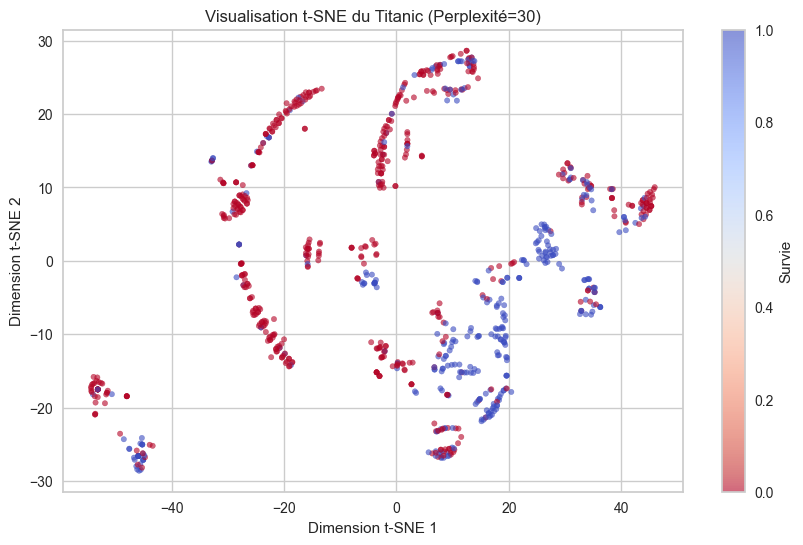

In [158]:
# Création et Entraînement
# perplexity=30 est le défaut standard
tsne = TSNE(n_components=2, perplexity=30, random_state=42, init='pca', learning_rate='auto')
X_tsne = tsne.fit_transform(X_std)

# Visualisation
plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    X_tsne[:, 0], 
    X_tsne[:, 1], 
    c=y, 
    cmap='coolwarm_r', # Rouge=Mort, Bleu=Vivant
    alpha=0.6,
    s=15
)
plt.title("Visualisation t-SNE du Titanic (Perplexité=30)")
plt.xlabel("Dimension t-SNE 1")
plt.ylabel("Dimension t-SNE 2")
plt.colorbar(scatter, label="Survie")
plt.show()

Calcul t-SNE avec perplexité = 2...
Calcul t-SNE avec perplexité = 30...
Calcul t-SNE avec perplexité = 50...
Calcul t-SNE avec perplexité = 100...


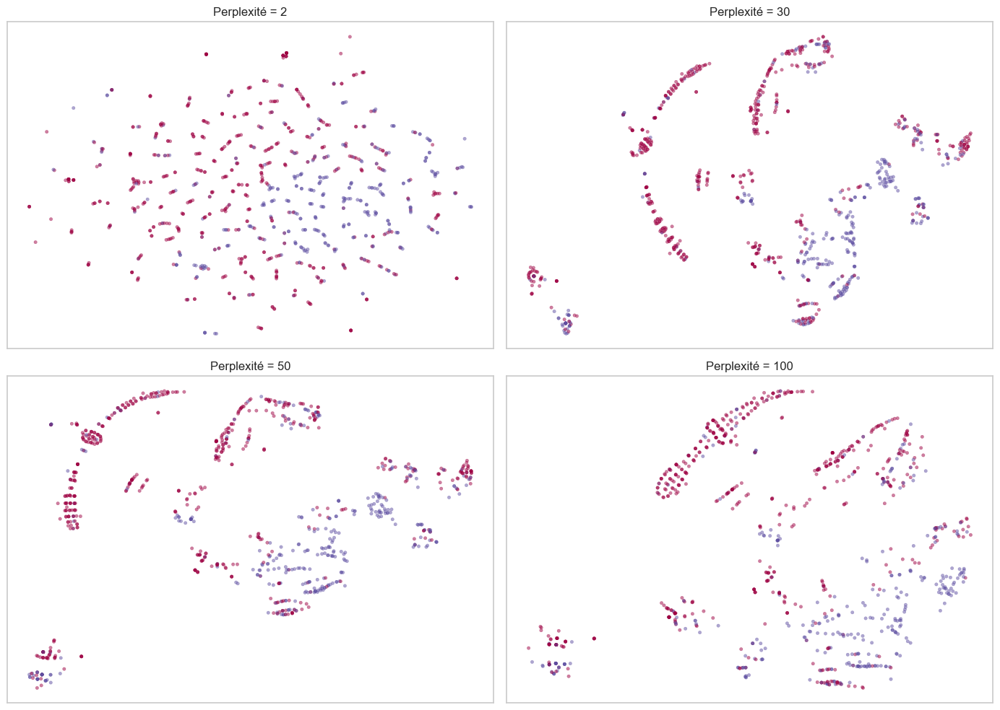

In [159]:
perplexities = [2, 30, 50, 100]

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.ravel() # Aplatit la grille pour boucler facilement

for i, perp in enumerate(perplexities):
    print(f"Calcul t-SNE avec perplexité = {perp}...")
    
    # Calcul t-SNE
    t = TSNE(n_components=2, perplexity=perp, random_state=42, init='pca', learning_rate='auto')
    X_emb = t.fit_transform(X_std)
    
    # Affichage
    axes[i].scatter(
        X_emb[:, 0], 
        X_emb[:, 1], 
        c=y, 
        cmap='Spectral', 
        alpha=0.5,
        s=10
    )
    axes[i].set_title(f"Perplexité = {perp}")
    axes[i].set_xticks([])
    axes[i].set_yticks([])

plt.tight_layout()
plt.show()

## Phate

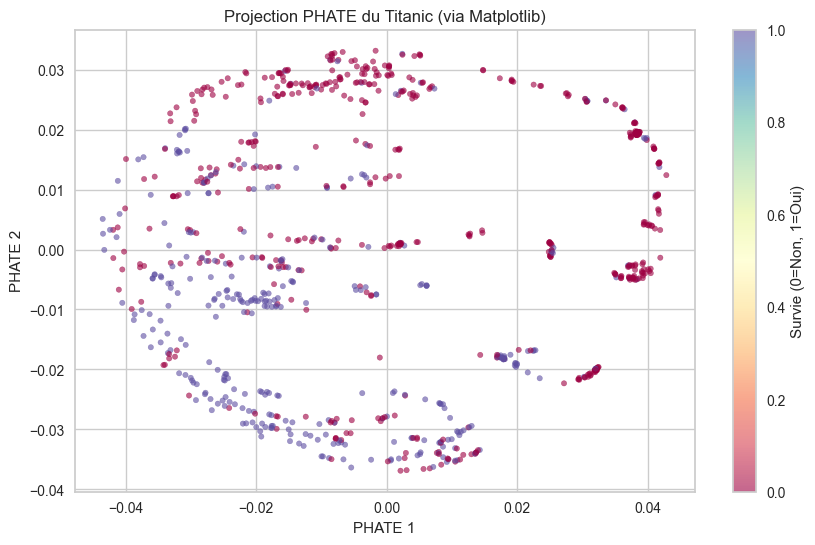

In [162]:
import matplotlib.pyplot as plt

# On utilise directement le résultat de la transformation (X_phate)
# X_phate[:, 0] = Axe X (Première dimension PHATE)
# X_phate[:, 1] = Axe Y (Deuxième dimension PHATE)

plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    X_phate[:, 0], 
    X_phate[:, 1], 
    c=y,              # Couleur selon la survie
    cmap='Spectral',  # Palette de couleurs
    alpha=0.6,        # Transparence
    s=15              # Taille des points
)

plt.title("Projection PHATE du Titanic (via Matplotlib)")
plt.xlabel("PHATE 1")
plt.ylabel("PHATE 2")
plt.colorbar(scatter, label='Survie (0=Non, 1=Oui)')
plt.show()

Calcul avec knn=2...
Calculating PHATE...
  Running PHATE on 891 observations and 8 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...


    Calculated KNN search in 0.03 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 0.08 seconds.
  Calculating optimal t...


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\graphtools\graphs.py:810: RuntimeWarning: Detected zero distance between 382 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\graphtools\graphs.py:505: RuntimeWarning: divide by zero encountered in divide
  scaled = distances_i / bw
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\graphtools\graphs.py:505: RuntimeWarning: invalid value encountered in divide
  scaled = distances_i / bw
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\graphtools\graphs.py:540: RuntimeWarning: invalid value encountered in divide
  scaled = distances_i / bw
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\phate\phate.py:919: RuntimeWarning: Graph is disconnected with 50 connected components. This may indicate that your knn parameter (cu

    Automatically selected t = 18
  Calculated optimal t in 0.23 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.05 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.68 seconds.
Calculated PHATE in 4.04 seconds.
Calcul avec knn=5...
Calculating PHATE...
  Running PHATE on 891 observations and 8 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 0.08 seconds.
  Calculating optimal t...


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\graphtools\graphs.py:810: RuntimeWarning: Detected zero distance between 382 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\graphtools\graphs.py:505: RuntimeWarning: divide by zero encountered in divide
  scaled = distances_i / bw
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\graphtools\graphs.py:505: RuntimeWarning: invalid value encountered in divide
  scaled = distances_i / bw
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\graphtools\graphs.py:540: RuntimeWarning: invalid value encountered in divide
  scaled = distances_i / bw
c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\phate\phate.py:919: RuntimeWarning: Graph is disconnected with 4 connected components. This may indicate that your knn parameter (cur

    Automatically selected t = 19
  Calculated optimal t in 0.21 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.08 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -1.4% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 3.57 seconds.
Calculated PHATE in 3.93 seconds.
Calcul avec knn=20...
Calculating PHATE...
  Running PHATE on 891 observations and 8 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 0.07 seconds.
  Calculating optimal t...


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\graphtools\graphs.py:810: RuntimeWarning: Detected zero distance between 382 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Automatically selected t = 12
  Calculated optimal t in 0.20 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.06 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.73 seconds.
Calculated PHATE in 4.06 seconds.
Calcul avec knn=100...
Calculating PHATE...
  Running PHATE on 891 observations and 8 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.09 seconds.
    Calculating affinities...
    Calculated affinities in 0.05 seconds.
  Calculated graph and diffusion operator in 0.15 seconds.
  Calculating optimal t...


c:\Users\TBAUU1N9\Desktop\code_tb\ml_biblio\biblio_env\Lib\site-packages\graphtools\graphs.py:810: RuntimeWarning: Detected zero distance between 382 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Automatically selected t = 27
  Calculated optimal t in 0.23 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.12 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -1.2% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 3.78 seconds.
Calculated PHATE in 4.28 seconds.


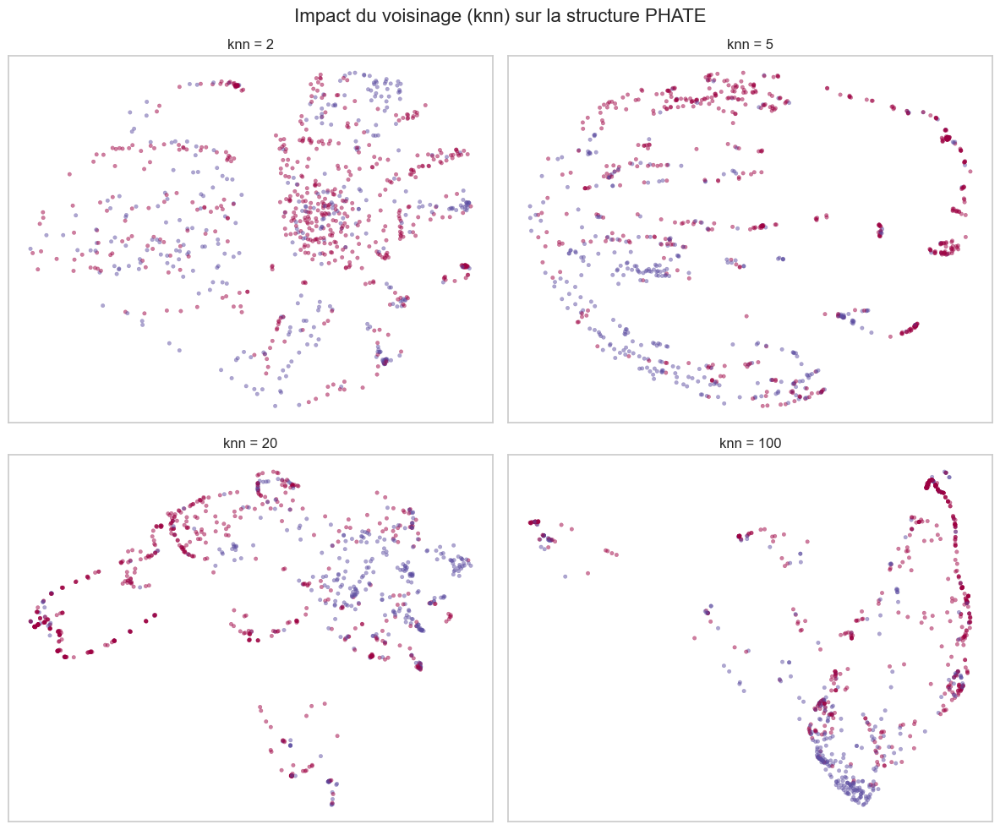

In [163]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()

knn_values = [2, 5, 20, 100]

# On réutilise l'opérateur pour gagner du temps (si possible) ou on en recrée un
p = phate.PHATE(random_state=42, n_jobs=-1)

for i, n in enumerate(knn_values):
    print(f"Calcul avec knn={n}...")
    
    # On met à jour le paramètre
    p.set_params(knn=n)
    
    # Transformation
    X_phate_k = p.fit_transform(X_std)
    
    # Affichage avec Pandas/Matplotlib (plus flexible pour les subplots que phate.plot)
    df_plot = pd.DataFrame(X_phate_k, columns=['PHATE1', 'PHATE2'])
    
    axes[i].scatter(
        df_plot['PHATE1'], 
        df_plot['PHATE2'], 
        c=y, 
        cmap='Spectral', 
        alpha=0.5,
        s=10
    )
    axes[i].set_title(f"knn = {n}")
    axes[i].set_xticks([])
    axes[i].set_yticks([])

plt.suptitle("Impact du voisinage (knn) sur la structure PHATE", fontsize=16)
plt.tight_layout()
plt.show()

## Clustering

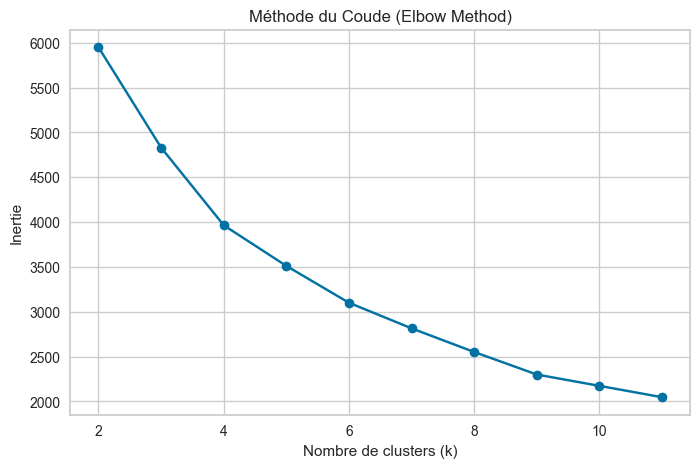

In [164]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import pandas as pd
import matplotlib.pyplot as plt

# 1. Nettoyage et Standardisation (Obligatoire pour K-Means)
df = pd.read_csv('titanic_dataset.csv')
df.columns = [c.lower() for c in df.columns]
df_clean = df.drop(columns=['name', 'ticket', 'cabin', 'passengerid', 'survived', 'home.dest', 'boat', 'body'], errors='ignore')
df_encoded = pd.get_dummies(df_clean, drop_first=True)

X_std = StandardScaler().fit_transform(
    SimpleImputer(strategy='median').fit_transform(df_encoded)
)

# 2. Calcul de l'inertie pour k=2 à k=11
inertias = []
k_range = range(2, 12)

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(X_std)
    inertias.append(km.inertia_)

# 3. Affichage du Coude
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertias, marker='o')
plt.xlabel("Nombre de clusters (k)")
plt.ylabel("Inertie")
plt.title("Méthode du Coude (Elbow Method)")
plt.grid(True)
plt.show()

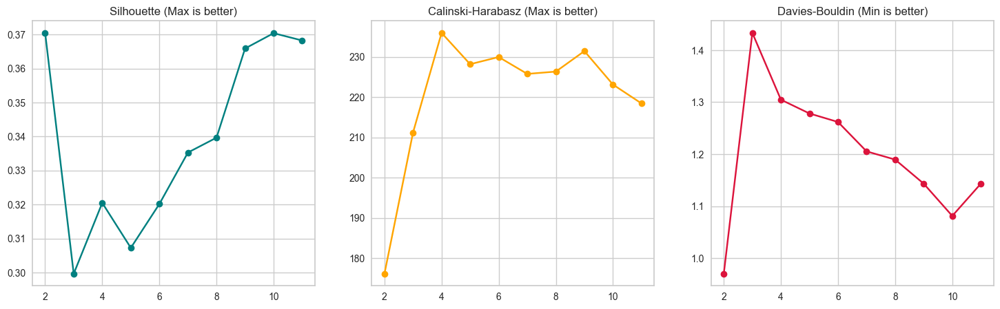

In [165]:
from sklearn import metrics

sils, chs, dbs = [], [], []

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10).fit(X_std)
    labels = km.labels_
    
    sils.append(metrics.silhouette_score(X_std, labels))
    chs.append(metrics.calinski_harabasz_score(X_std, labels))
    dbs.append(metrics.davies_bouldin_score(X_std, labels))

# Affichage comparatif
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(k_range, sils, marker='o', color='teal'); axes[0].set_title('Silhouette (Max is better)')
axes[1].plot(k_range, chs, marker='o', color='orange'); axes[1].set_title('Calinski-Harabasz (Max is better)')
axes[2].plot(k_range, dbs, marker='o', color='crimson'); axes[2].set_title('Davies-Bouldin (Min is better)')

plt.show()

In [166]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import pandas as pd
import matplotlib.pyplot as plt

# Chargement et Nettoyage rapide
df = pd.read_csv('titanic_dataset.csv')
df.columns = [c.lower() for c in df.columns]
df_clean = df.drop(columns=['name', 'ticket', 'cabin', 'passengerid', 'survived', 'home.dest', 'boat', 'body'], errors='ignore')
df_encoded = pd.get_dummies(df_clean, drop_first=True)

# Imputation & Standardisation
X_imp = SimpleImputer(strategy='median').fit_transform(df_encoded)
X_std = StandardScaler().fit_transform(X_imp)

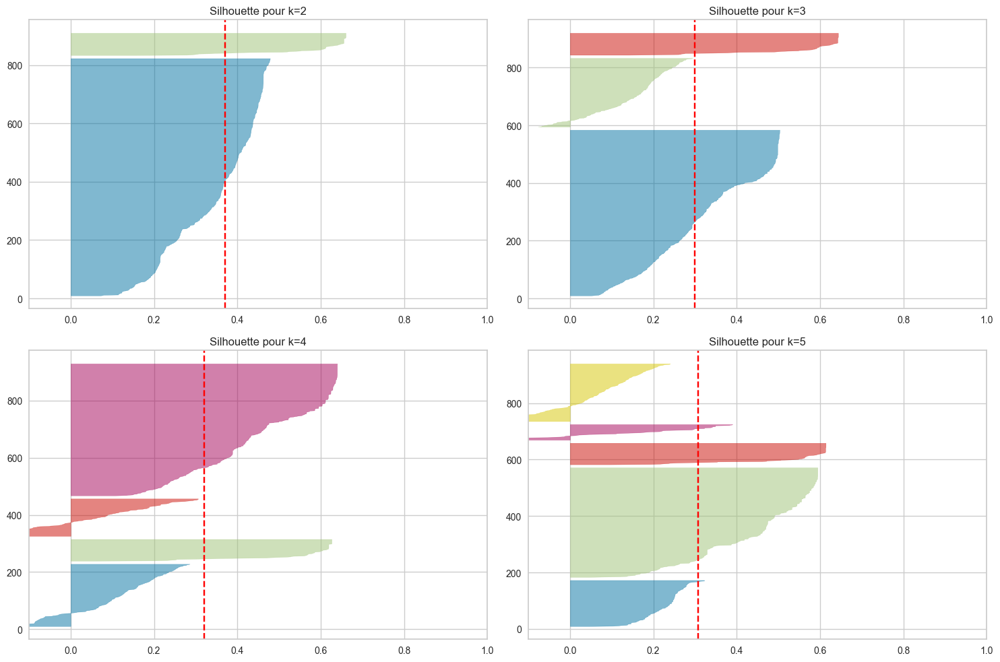

In [167]:
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

# On crée une grille de 2x2 graphiques pour tester k=2, 3, 4, 5
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.reshape(4) # Aplatit le tableau pour boucler facilement

for i, k in enumerate(range(2, 6)):
    ax = axes[i]
    
    # Création du modèle K-Means pour k clusters
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    
    # Visualisation
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax)
    visualizer.fit(X_std)
    
    ax.set_title(f"Silhouette pour k={k}")
    ax.set_xlim(-0.1, 1.0) # On fixe l'échelle pour comparer facilement

plt.tight_layout()
plt.show()

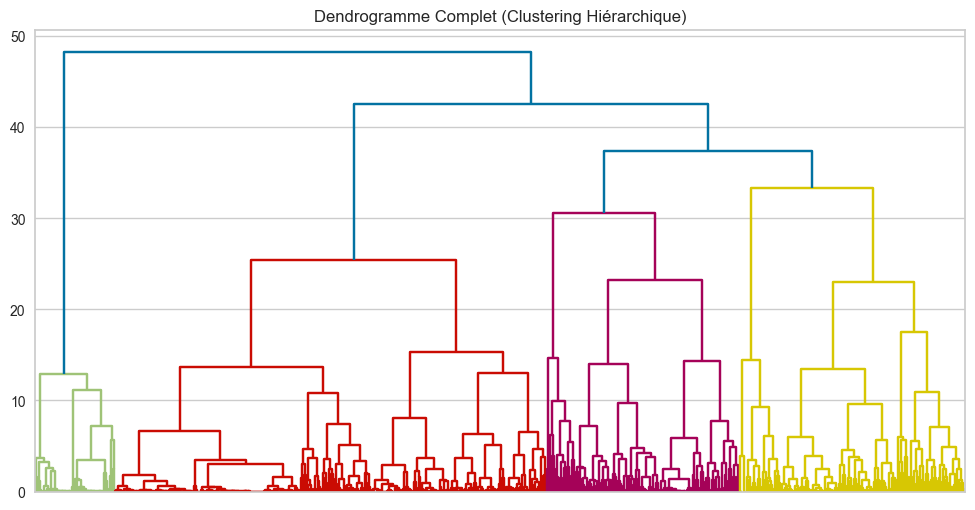

In [168]:
from scipy.cluster import hierarchy

plt.figure(figsize=(12, 6))
plt.title("Dendrogramme Complet (Clustering Hiérarchique)")

# Calcul du lien (Linkage) avec la méthode 'ward' (minimise la variance)
dend = hierarchy.dendrogram(
    hierarchy.linkage(X_std, method="ward"),
    no_labels=True # On cache les labels car illisibles avec 891 passagers
)
plt.show()

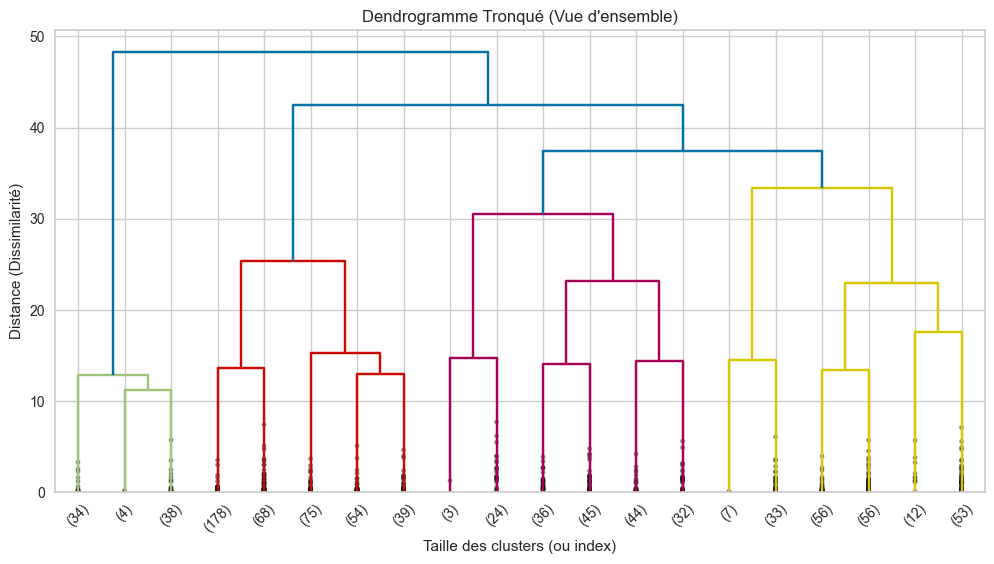

In [169]:
plt.figure(figsize=(12, 6))
plt.title("Dendrogramme Tronqué (Vue d'ensemble)")

dend = hierarchy.dendrogram(
    hierarchy.linkage(X_std, method="ward"),
    truncate_mode="lastp",  # On ne montre que les derniers clusters fusionnés
    p=20,                   # On montre les 20 dernières branches
    show_contracted=True,   # Montre les petits traits pour dire "il y a du monde caché ici"
    leaf_rotation=45.,
    leaf_font_size=10.
)

# Aide visuelle : On trace une ligne horizontale pour couper l'arbre
# Si on coupe là où les lignes verticales sont les plus longues (vers y=40 ou 50),
# on voit combien de branches verticales cela traverse.
plt.axhline(y=55, c='k', ls='--', lw=1) 

plt.xlabel("Taille des clusters (ou index)")
plt.ylabel("Distance (Dissimilarité)")
plt.show()

In [170]:
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier, plot_tree
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Préparation ---
# (On s'assure d'avoir X_std propre)
df = pd.read_csv('titanic_dataset.csv')
df.columns = [c.lower() for c in df.columns]
df_clean = df.drop(columns=['name', 'ticket', 'cabin', 'passengerid', 'survived', 'home.dest', 'boat', 'body'], errors='ignore')
df_encoded = pd.get_dummies(df_clean, drop_first=True)
X_imp = SimpleImputer(strategy='median').fit_transform(df_encoded)
X_std = StandardScaler().fit_transform(X_imp)
X = pd.DataFrame(X_imp, columns=df_encoded.columns) # Pour l'analyse lisible
y = df['survived']

# --- Clustering Agglomératif ---
# Note : 'affinity' est obsolète depuis sklearn 1.2, remplacé par 'metric'
try:
    ag = AgglomerativeClustering(n_clusters=4, metric="euclidean", linkage="ward")
except TypeError:
    ag = AgglomerativeClustering(n_clusters=4, affinity="euclidean", linkage="ward")

ag.fit(X_std)
print("Clustering Agglomératif terminé.")

Clustering Agglomératif terminé.



--- Qui sont les groupes ? (Moyennes par Cluster) ---
cluster                0           1
pclass mean     2.251843    2.909091
       var      0.715095    0.136364
age    mean    29.487310   28.032468
       var    175.881382  101.653537
sibsp  mean     0.531941    0.428571
       var      1.240676    0.958647
parch  mean     0.401720    0.168831
       var      0.666221    0.431647
fare   mean    33.994711   13.276030
       var   2647.359275  201.300677


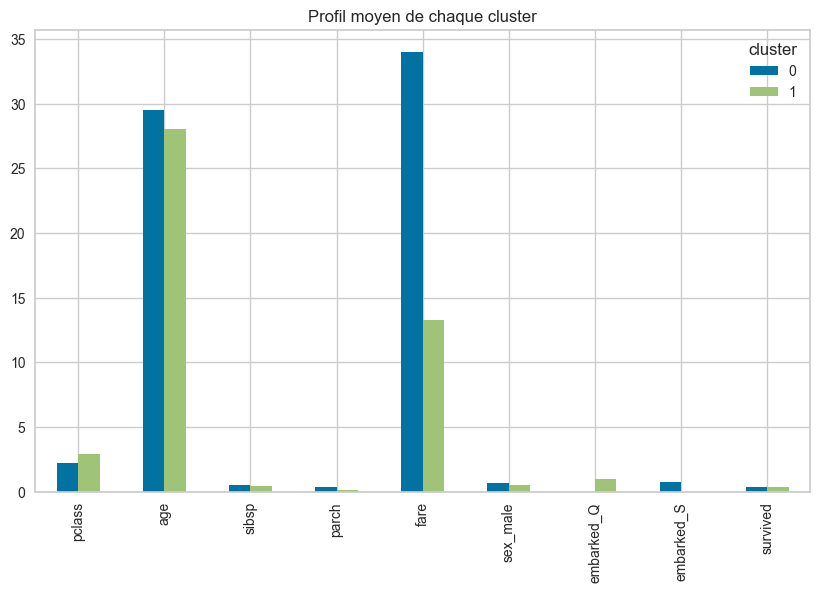

In [171]:
# Entraînement
km = KMeans(n_clusters=2, random_state=42, n_init=10)
km.fit(X_std)
labels = km.predict(X_std)

# Analyse des différences (Moyenne et Variance par cluster)
print("\n--- Qui sont les groupes ? (Moyennes par Cluster) ---")
cluster_summary = (
    X.assign(cluster=labels, survived=y)
    .groupby("cluster")
    .agg(["mean", "var"])
    .T
)
# On affiche un extrait pour la lisibilité
print(cluster_summary.head(10))

# Visualisation Graphique des Moyennes
fig, ax = plt.subplots(figsize=(10, 6))
(
    X.assign(cluster=labels, survived=y)
    .groupby("cluster")
    .mean()
    .T.plot.bar(ax=ax)
)
plt.title("Profil moyen de chaque cluster")
plt.show()


--- Règles de séparation des clusters ---
embarked_Q      : 1.000
pclass          : 0.000
age             : 0.000


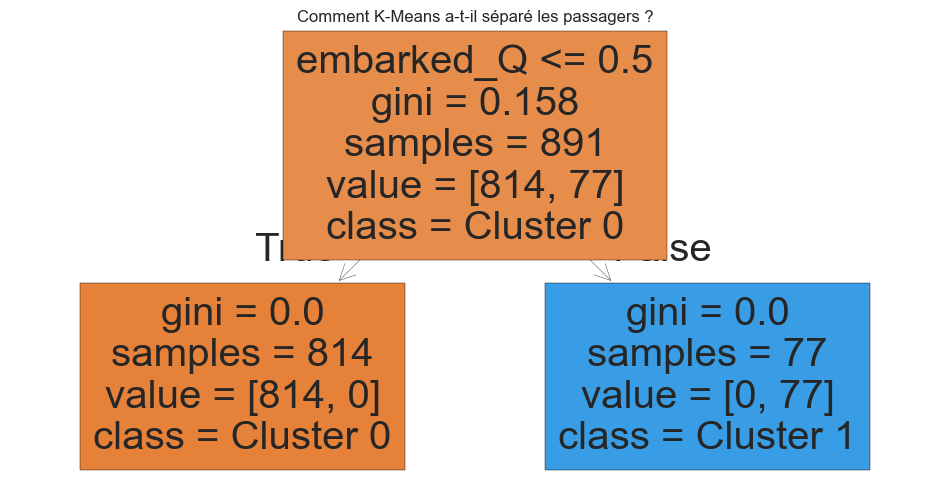

In [172]:
# Entraînement de l'arbre explicatif
dt = DecisionTreeClassifier(max_depth=2, random_state=42)
dt.fit(X, labels)

print("\n--- Règles de séparation des clusters ---")
for col, val in sorted(zip(X.columns, dt.feature_importances_), key=lambda x: x[1], reverse=True)[:3]:
    print(f"{col:15} : {val:.3f}")

# Visualisation de l'arbre
plt.figure(figsize=(12, 6))
plot_tree(dt, feature_names=X.columns, class_names=["Cluster 0", "Cluster 1"], filled=True)
plt.title("Comment K-Means a-t-il séparé les passagers ?")
plt.show()

## Pipeline pour mise en prod

In [173]:
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import SimpleImputer # Plus stable que IterativeImputer pour l'exemple
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import pandas as pd

# 1. Chargement des données brutes
orig_df = pd.read_csv('titanic_dataset.csv')
# Uniformisation des noms
orig_df.columns = [c.lower() for c in orig_df.columns]

# 2. Définition du Transformateur Personnalisé
class TitanicTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X = X.copy()
        # Suppression des colonnes inutiles
        cols_to_drop = ['name', 'ticket', 'cabin', 'passengerid', 'home.dest', 'boat', 'body']
        X = X.drop(columns=cols_to_drop, errors='ignore')
        
        # Encodage One-Hot (pd.get_dummies)
        # Attention : dans un pipeline, cela peut être risqué si le Test a des catégories inconnues
        # Mais pour l'exercice, on fait comme dans le livre.
        X = pd.get_dummies(X, drop_first=True)
        
        # Alignement : on s'assure qu'il ne reste que des colonnes numériques
        # (Si une colonne texte a survécu, elle ferait planter la suite)
        return X.select_dtypes(include=['number'])

# 3. Construction du Pipeline
# Étapes : Nettoyage -> Imputation -> Scaling -> Modèle
pipe = Pipeline([
    ("titan", TitanicTransformer()),
    ("impute", SimpleImputer(strategy='median')), # Remplace IterativeImputer (plus simple)
    ("std", StandardScaler()),
    ("rf", RandomForestClassifier(random_state=42))
])

# 4. Séparation Train / Test
X = orig_df.drop(columns='survived')
y = orig_df['survived']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 5. Entraînement et Évaluation
print("Entraînement du pipeline...")
pipe.fit(X_train, y_train)
print(f"Score du Pipeline : {pipe.score(X_test, y_test):.2%}")

Entraînement du pipeline...
Score du Pipeline : 66.04%


# Optimisation gridsearchCV

In [174]:
from sklearn.model_selection import GridSearchCV

# On veut tester le nombre d'arbres de l'étape "rf" (RandomForest)
params = {
    "rf__n_estimators": [50, 100, 200],
    "rf__max_depth": [3, 5, None]
}

print("Recherche des meilleurs hyperparamètres...")
grid = GridSearchCV(pipe, param_grid=params, cv=3, n_jobs=1) # n_jobs=1 pour éviter les crashs
grid.fit(X_train, y_train)

print("Meilleurs paramètres :", grid.best_params_)
print(f"Meilleur Score Test : {grid.score(X_test, y_test):.2%}")

Recherche des meilleurs hyperparamètres...
Meilleurs paramètres : {'rf__max_depth': 5, 'rf__n_estimators': 50}
Meilleur Score Test : 71.64%


## Pipeline de régression

In [175]:
from sklearn.linear_model import LinearRegression
from sklearn.datasets import make_regression

# Données simulées
X_reg, y_reg = make_regression(n_samples=1000, n_features=10, noise=5, random_state=42)
X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(X_reg, y_reg, test_size=0.3, random_state=42)

# Pipeline Régression
reg_pipe = Pipeline([
    ("std", StandardScaler()),
    ("lr", LinearRegression())
])

reg_pipe.fit(X_train_r, y_train_r)
print(f"Score R2 Pipeline Régression : {reg_pipe.score(X_test_r, y_test_r):.4f}")

# Accès aux coefficients (via named_steps)
print("Intercept :", reg_pipe.named_steps['lr'].intercept_)

Score R2 Pipeline Régression : 0.9987
Intercept : -0.7749848888711596


## Pipeline PCA non supervisé

In [177]:
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd

# --- 1. Rappel de la classe TitanicTransformer (Cruciale) ---
class TitanicTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X = X.copy()
        # Suppression des colonnes texte inutiles
        cols_to_drop = ['name', 'ticket', 'cabin', 'passengerid', 'home.dest', 'boat', 'body']
        X = X.drop(columns=cols_to_drop, errors='ignore')
        
        # Encodage (Male/Female -> 0/1, Embarked -> 0/1)
        X = pd.get_dummies(X, drop_first=True)
        
        # Sécurité : on ne garde que les chiffres
        return X.select_dtypes(include=['number'])

# --- 2. Pipeline PCA Complet et Robuste ---
pca_pipe = Pipeline([
    # Étape 1 : Nettoyage (Texte -> Chiffres) -> C'est ce qui manquait !
    ("clean", TitanicTransformer()),
    
    # Étape 2 : Imputation (Boucher les trous avec la médiane)
    ("impute", SimpleImputer(strategy='median')),
    
    # Étape 3 : Standardisation (Moyenne 0, Ecart-type 1)
    ("std", StandardScaler()),
    
    # Étape 4 : PCA (Réduction de dimension)
    ("pca", PCA(n_components=2))
])

# --- 3. Exécution ---
# On peut maintenant lui donner X_train BRUT (avec le texte) sans que ça plante
print("Transformation PCA en cours...")
X_pca_result = pca_pipe.fit_transform(X_train)

print("Succès ! Forme des données transformées :", X_pca_result.shape)
print("Variance expliquée :", pca_pipe.named_steps['pca'].explained_variance_ratio_)

Transformation PCA en cours...
Succès ! Forme des données transformées : (623, 2)
Variance expliquée : [0.33754828 0.32594904]
